In [1]:
# To ignore all warnings
import warnings
warnings.filterwarnings("ignore")


In [49]:
download_libraries("check")

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: Could not find a version that satisfies the requirement matplotlib.pyplot (from versions: none)
ERROR: No matching distribution found for matplotlib.pyplot
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to u

In [2]:
def download_libraries(command):
    if command=="check":
        %pip install numpy
        %pip install pandas
        %pip install seaborn
        %pip install matplotlib.pyplot
        %pip install matplotlib
        %pip install pandas_datareader
        %pip install scikit-learn
        %pip install getFamaFrenchFactors
        %pip install matplotlib 
        %pip install pandas-datareader 
        %pip install scikit-learn 
        %pip install plotly 
        %pip install ipython 
        %pip install random 
        %pip install yfinance 
        %pip install statsmodels 
        %pip install pulp
        %pip install pyarrow
        %pip install setuptools
        %pip install --upgrade certifi
        %pip install openpyxl



In [2]:
import matplotlib.pyplot as plt
import numpy as np, numpy.random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import calendar
from sklearn.linear_model import LinearRegression
import plotly.express as px
from IPython.display import Markdown as md
import random as rand
from matplotlib import gridspec
import yfinance as yf
from datetime import datetime
# import getFamaFrenchFactors as gff
from pandas.tseries.offsets import DateOffset
from statsmodels.formula.api import ols
import statsmodels.api as sm
import random
# yf.pdr_override()
import pulp
from sklearn.preprocessing import LabelEncoder
import pandas_datareader.data as reader
import yfinance as yf
import pandas as pd
import requests
# import getFamaFrenchFactors as gff
from pulp import LpProblem, LpMaximize, LpVariable, LpMinimize, LpBinary, lpSum
from pulp import *

In [3]:
import getFamaFrenchFactors as gff

In [4]:
yf.pdr_override()

In [5]:
def get_spy(beta1,beta2,beta3,start,end):
  
    global tickers
    requests.packages.urllib3.disable_warnings() 
    # Fetch HTML content
    response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
    html_content = response.content
    # Read HTML content into pandas DataFrame
    list_of_dfs = pd.read_html(html_content)
    wikitable_sp_500 = list_of_dfs[0]
    sp500_symbols = wikitable_sp_500['Symbol']#Converting SP_500 tickers into list 
    tickers = sp500_symbols.to_list()#Remove some tickers as they create an error for the yfinance api
    tickers[65] = 'BRK-B'
    tickers[81] = 'BF-B'
    tickers.remove('BF-B')
    tickers.remove('BRK-B')#Start Date for In Sample Historical Data
    global monthly_data
    global base_w
    monthly_data = yf.download(tickers,start=start,end=end,interval='1mo')#Reformat Date Index 
    monthly_data.index = pd.to_datetime(monthly_data.index)
    monthly_data = monthly_data.tz_localize(None)#Turn Adj Close prices into pct returns
    monthly_data = monthly_data['Adj Close'].pct_change()#Drop First row NaN values
    monthly_data = monthly_data.drop(monthly_data.index[0])#Drop if stock doesnt have data starting from the first index date
    monthly_data = monthly_data.dropna(axis=1)#Assign equal weight as base weights
    
    base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
    base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])#Getting SP_500 data
    spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    spy = spy.drop(spy.index[0]).tz_localize(None)#Adding SP_500 data to monthly_data
    monthly_data['SP_500'] = spy['Adj Close']
    #Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    
    tickers = list(monthly_data.columns[:-1])
    tick_index = tickers + ['SP_500']

    

In [6]:
def famafrenchreturns():
    global ff3_monthly
    # Fama French Monthly Returns Data using getFamaFrenchFactors module
    ff3_monthly = gff.famaFrench3Factor(frequency='m')
    ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
    ff3_monthly.set_index('Date', inplace=True)
    ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
    # Keeping Only the Dates in the monthly_data
    ff3_monthly = ff3_monthly.loc[monthly_data.index]
    

In [8]:
def to__cal_stock_betas():
    global stock_betas
    stock_betas = pd.DataFrame()
    # Iterate over the tickers list
    for col in monthly_data.columns:
        # Set the dependent variable (Return of stock i)
        y = monthly_data[col]
        # Set the independent variables (Fama French 3 Factors)
        X = ff3_monthly[['Mkt-RF','SMB','HML']]
        # Fit the multiple linear regression model
        model = LinearRegression()
        model.fit(X, y)
        # Store the results in the DataFrame
        stock_betas[col] = [model.intercept_] + list(model.coef_)
    stock_betas = stock_betas.T
    stock_betas.columns = ['Intercept','Mkt-RF','SMB','HML']

In [9]:
def to_cal_stock_price():
    global stock_price
    global s_price
    global s_keys
    global s_values
    #Stock Prices on the Day of Optimization(Rebalancing)
    stock_price = pd.DataFrame(yf.download(tickers,start=start,end=end,interval='1d')['Adj Close'])
    stock_price = stock_price[-1:]
    stock_price.index = pd.to_datetime(stock_price.index).tz_localize(None)
    s_price = {}
    s_keys = list(tickers)
    s_values =  list(stock_price.iloc[0])
    for key,value in zip(s_keys,s_values):
        s_price[key] = value

In [10]:
def Transaction_Costs(initialize=False):
    if initialize:
        random.seed(1)  # Set seed only during initialization
    global t_cost
    t_cost = {}
    global keys
    keys = list(tickers)
    values = list(random.uniform(.01, .02) for i in range(len(tickers)))
    for key, value in zip(keys, values):
        t_cost[key] = value


In [11]:
def optimization():
# OPTIMIZATION MODEL
    global index
    global wei
    global aux
    global err
    global binary
    global tr_cost
    global shares
    index = LpProblem('Index', LpMinimize) 
    # Decision Variables
    wei = LpVariable.dicts('Weight',tickers,lowBound=0)                           # Weights for stock i in the optimal portfolio
    aux = LpVariable.dicts('Y',tickers,lowBound=0)                                # Absolute value of change for stock i from base weights
    err = LpVariable.dicts('Error', monthly_data.index, lowBound=0)               # Error term for portfolio
    binary = LpVariable.dicts('bin',tickers,cat=LpBinary)                         # Used if we want to limit the # of stocks we want to have in optimal portfolio
    tr_cost = LpVariable.dicts('Transaction_Cost',tickers,lowBound=0)             # Total Transaction cost for stock i in the optimal portfolio
    shares = LpVariable.dicts('shares',tickers,lowBound=0)                        # Total Transaction cost for stock i in the optimal portfolio
    #Objective Function - Minimize the error term 
    index +=  lpSum(err[t] for t in monthly_data.index) # Constraint: Weights sum to 1 
    index += lpSum(wei[i] for i in tickers) == 1
    # Constraint: Absolute value of change in weights from base weigths
    for i in tickers:
        index += aux[i] >= base_weights[i]  - wei[i]
        index += aux[i] >= wei[i] - base_weights[i]
    index += lpSum(aux[i] for i in tickers) <= 1 
    # Constraint: Error term
    for t in monthly_data.index:
        index += lpSum(wei[i]*(monthly_data.loc[t,i]-ff3_monthly.loc[t,'RF']) for i in tickers) - err[t] <= (mkt_opt*ff3_monthly.loc[t,'Mkt-RF']+smb_opt*ff3_monthly.loc[t,'SMB']+hml_opt*ff3_monthly.loc[t,'HML'])
        index += lpSum(wei[i]*(monthly_data.loc[t,i]-ff3_monthly.loc[t,'RF']) for i in tickers) + err[t] >= (mkt_opt*ff3_monthly.loc[t,'Mkt-RF']+smb_opt*ff3_monthly.loc[t,'SMB']+hml_opt*ff3_monthly.loc[t,'HML'])
    # Shares
    for i in tickers:
        index += shares[i] == (aux[i]*B/s_price[i])
    # Transaction Costs
    for i in tickers:
        index += lpSum(aux[i] *B*t_cost[i]/s_price[i]) == tr_cost[i]
    index += lpSum(tr_cost[i] for i in tickers) <= 2000
    # Limit # of stocks in Optimal Portfolio
    for i in tickers: # Forces weight of stock i to be less than binary value of stock i. If stock is not selected binary variable is 0 which then forces weight of stock i to be in the optimal portfolio to be 0.
        index += wei[i] <= binary[i]
    index += lpSum(binary[i] for i in tickers) <= q
    index.solve()
    

In [12]:
def others():
    global sharess
    #Change in number of shares
    sharess = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 's'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 's'] , columns = ['Optimal'])
    sharess
    global tr_cost
    #Transaction Costs
    tr_cost = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'T'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'T'] , columns = ['Optimal'])
    tr_cost.sum()
    global weii
    #Optimal weights
    weii = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'W'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'W'] , columns = ['Optimal'])
    weii.sum()
    global auxx
    #Change of weights
    auxx = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'Y'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'Y'] , columns = ['Optimal'])
    auxx.sum()
    global errr
    #Error terms
    errr = pd.DataFrame([v.varValue for v in index.variables() if str(v.name)[0] == 'E'], index = [str(v.name) for v in index.variables() if str(v.name)[0] == 'E'] , columns = ['Optimal'])
    errr.sum()
    global binary_v
    # Check if Binary Values Constraint works
    binary_v = pd.DataFrame([v.varValue for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'b'], index = [str(v.name) for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'b'] , columns = ['Optimal'])
    binary_v.sum()
    global opt_weights 
    # Weights in Optimal Portfolio
    opt_weights = pd.DataFrame([v.varValue for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'W'], index = [str(v.name) for v in index.variables() if v.varValue != 0 and str(v.name)[0] == 'W'] , columns = ['Optimal'])
    opt_weights.style.format('{:,.2%}'.format)
    global weights_new
    weights_new = pd.DataFrame([v.varValue for v in index.variables() if str(v.name[0]) == 'W'], index = [str(v.name).split('_')[1] for v in index.variables() if str(v.name[0]) == 'W'] , columns = ['New Weights'])
    global weights
    weights = pd.DataFrame(np.zeros((len(monthly_data.columns[:-1]),3)), index=monthly_data.columns[:-1], columns=['PORTFOLIO Weights','Difference','New Weights'])
    for t in monthly_data.columns[:-1]:
        weights.loc[t][0] = base_w.loc[t]
        weights.loc[t][1] = weights_new.loc[t][0]-base_w.loc[t][0]
        weights.loc[t][2] = weights_new.loc[t]
    weights
    columns_to_remove = ['PORTFOLIO Weights', 'Difference']
    # Specify the column to filter non-zero values
    column_to_filter = 'New Weights'
    # Create a new DataFrame with selected columns and rows where New Weights is not equal to 0
    global opt_portf_weights
    opt_portf_weights = weights.drop(columns=columns_to_remove)[weights[column_to_filter] != 0]




In [13]:
def portfolio_betas():
    # CHECK PORTFOLIO BETAS
   
    global port_betas
    port_returns = pd.DataFrame(np.zeros((len(monthly_data.index),2)), index=monthly_data.index, columns=["SP_500","Optimization"])
    for j in port_returns.index:
        port_returns.loc[j]["SP_500"] = monthly_data.loc[j]['SP_500']
        port_returns.loc[j]['Optimization'] = monthly_data.loc[j,:monthly_data.columns[-2]].dot(weights['New Weights'])
    port_returns = port_returns.merge(ff3_monthly[['Mkt-RF','SMB','HML']], left_index=True, right_index=True)
    # Create an empty DataFrame to store the Portfolio Beta
    port_betas = pd.DataFrame(np.zeros((3,4)), index=ff3_monthly.columns[0:3], columns=["SP_500", "Target", "Optimization", "Abs. Diff"])
    port_betas["Target"] = [mkt_opt, smb_opt, hml_opt]# Set the independent variables (Fama French 3 Factors)
    X = port_returns[['Mkt-RF','SMB','HML']]
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['SP_500']# Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['SP_500'] = regr.coef_
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['Optimization']
    # Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['Optimization'] = regr.coef_
    # Abs Difference between Target Betas & Optimal Portfolio Betas
    port_betas["Abs. Diff"] = round(abs(port_betas['Optimization'] - port_betas["Target"]),4)
    port_betas
    return port_betas
    

In [15]:
def simulator(beta1,beta2,beta3,begin,final,budget,number):
    global start
    global end
    start=begin
    end=final
    get_spy(beta1,beta2,beta3,start,end)
    #Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    global tickers
    tickers = list(monthly_data.columns[:-1])
    tick_index = tickers + ['SP_500']
    

    # TARGET FACTOR BETAS 
    global base_weights
    global mkt_opt
    global smb_opt
    global hml_opt
    global B
    global q
    
    mkt_opt = beta1                          # TARGET MKT BETA - EXPOSURE OF THE NEW PORTFOLIO TO MARKET FACTOR 
    smb_opt = beta2                           # TARGET SMB BETA - EXPOSURE OF THE NEW PORTFOLIO TO SIZE FACTOR 
    hml_opt = beta3                           # TARGET HML BETA - EXPOSURE OF THE NEW PORTFOLIO TO VALUE FACTOR 
    B = budget                             # BUDGET
    q = number                                # NUMBER OF STOCKS IN THE NEW PORTFOLIO
    base_weights = base_w.T*0               # ONLY HAVE THIS LINE OF CODE WHEN YOU ARE CONSTRUCTING THE PORTFOLIO FROM SCRATCH 
    
    famafrenchreturns()
    to__cal_stock_betas()
    to_cal_stock_price()
    Transaction_Costs()
    optimization()
    others()
    portfolio_betas()
    opt_portf_weights
    global port_betas
    opt_portf_weights


In [16]:
def out_of_sample():
    global oos1_daily_data
    global oos1_new_performance
    global o1_end_d
    global o1_start_d
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    init = 1        #Initial Common Value (Can be thought of Initial Investment of $1 USD in each stock)
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [17]:
def mod_out_of_sample1():
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = out_of_sample_year_start[1]
    last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = out_of_sample_year_end[last_key]
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [18]:
def mod_out_of_sample():
    global oos1_daily_data
    global oos1_new_performance
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [19]:
def run_with_backtest(nyears):
    
    global n_years
    n_years=nyears
    current_date()
    simulator(1,0,0,n_year_before,n_year_after,1000000,50) 
    out_of_sample()
  
    return oos1_new_performance
    
    


In [20]:
def current_date():
    global today
    global os_start
    global os_end
    global n_year_before
    global n_year_after
    from datetime import datetime, timedelta
    today = datetime.today()
    one_year_before = today - timedelta(days=365)
    os_start = today - timedelta(days=365)
    two_months_before = os_start - timedelta(days=2*30)
    os_start = two_months_before.replace(day=1)
    one_month_before = today - timedelta(days=30)
    os_end = one_month_before.replace(day=1)
    
    n_year_before = os_start - timedelta(days=(365*n_years))
    n_year_after=n_year_before+timedelta(days=(365*n_years))                           
    os_start=os_start.strftime("%Y-%m-%d")
    os_end=os_end.strftime("%Y-%m-%d")
    n_year_before=n_year_before.strftime("%Y-%m-%d")
    n_year_after=n_year_after.strftime("%Y-%m-%d")
    from datetime import date

    today = date.today()
    formatted_date = today.strftime("%Y-%m-%d")
    today = formatted_date


In [21]:
def mod_out_of_sample():
    global oos1_daily_data
    global oos1_new_performance
    o1_start_d = os_start
    o1_end_d   = os_end
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [22]:
def mod_out_of_sample1():
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = out_of_sample_year_start[1]
    last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = out_of_sample_year_end[last_key]
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['New Weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [23]:
def new_date_calculation():
    from datetime import datetime, timedelta
    from datetime import date
    today = datetime.now()
    global out_of_sample_year_start
    global out_of_sample_year_end
    out_of_sample_year_start={}
    out_of_sample_year_end={}
    for year in range(os_years):
        out_of_sample_year_start[(year+1)] = today - timedelta(days=(365 * (os_years - year)))
        two_months_before = out_of_sample_year_start[(year+1)] - timedelta(days=2 * 30)
        out_of_sample_year_start[(year+1)] = two_months_before.replace(day=1)
        years=out_of_sample_year_start[(year+1)].year
        if (years % 4 == 0 and years % 100 != 0) or (years % 400 == 0):
            is_leap_year = True
            no_days_in_year = 366
        else:
            is_leap_year = False
            no_days_in_year = 365
        out_of_sample_year_end[(year+1)]=out_of_sample_year_start[(year+1)]+ timedelta(days=no_days_in_year-1)
        out_of_sample_year_start[(year+1)]=out_of_sample_year_start[(year+1)].strftime("%Y-%m-%d")
        out_of_sample_year_end[(year+1)]=out_of_sample_year_end[(year+1)].strftime("%Y-%m-%d")                        
    
    global in_of_sample_year_start
    in_of_sample_year_start={}
    global in_of_sample_year_end
    in_of_sample_year_end={}
    for year in range(in_years):
        in_of_sample_year_start[(year+1)] = today - timedelta(days=(365 * ((in_years+os_years) - year)))
        two_months_before = in_of_sample_year_start[(year+1)] - timedelta(days=2 * 30)
        in_of_sample_year_start[(year+1)] = two_months_before.replace(day=1)
        years=in_of_sample_year_start[(year+1)].year
        if (years % 4 == 0 and years % 100 != 0) or (years % 400 == 0):
            is_leap_year = True
            no_days_in_year = 366
        else:
            is_leap_year = False
            no_days_in_year = 365
        in_of_sample_year_end[(year+1)]=in_of_sample_year_start[(year+1)]+ timedelta(days=no_days_in_year-1)
        in_of_sample_year_start[(year+1)]=in_of_sample_year_start[(year+1)].strftime("%Y-%m-%d")
        in_of_sample_year_end[(year+1)]=in_of_sample_year_end[(year+1)].strftime("%Y-%m-%d")
    today = date.today()
    formatted_date = today.strftime("%Y-%m-%d")
    today = formatted_date

In [24]:
def new_run_with_backtest(inyears,outyears,betaA,betaB,betaC):
    
    global os_years
    global in_years
    os_years=outyears
    in_years=inyears
    global performances
    performances={}
    global spy_performances
    spy_performances={}
    global new_performances
    new_performances={}
    global new_spy_performances
    new_spy_performances={}
    new_date_calculation()
    global n_year_before
    global n_year_after
    n_year_before=in_of_sample_year_start[1]
    n_year_after=in_of_sample_year_end[in_years]
    simulator(betaA,betaB,betaC,n_year_before,n_year_after,1000000,50)
    global checklist
    checklist=[]
    for k in range(os_years): 
        global os_start
        global os_end
        global oos1_new_performances
        oos1_new_performances={}
        global init
        os_start=out_of_sample_year_start[1+k]
        os_end=out_of_sample_year_end[1+k]
        out_of_sample()
        # mod_out_of_sample()
        
        checklist.append(oos1_new_performance)
        if k == 0:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1]
        else:
            performances[k + 1] = oos1_new_performance["Optimized Portfolio"].iloc[-1] * performances[k]
            spy_performances[k + 1] = oos1_new_performance["SP_500"].iloc[-1] * spy_performances[k]
    mod_out_of_sample1()
    for kk in range(os_years): 
        placeholder=oos1_new_performance.index[0]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"SP_500"]
        # performances[k + 1] = oos1_new_performance.loc[placeholder,"Optimized Portfolio"]
        placeholder=placeholder.replace(year=placeholder.year+(kk+1))
        if placeholder in oos1_new_performance.index:
            new_spy_performances[kk + 1] = oos1_new_performance.loc[placeholder,"SP_500"]
            new_performances[kk + 1] = oos1_new_performance.loc[placeholder,"Optimized Portfolio"]
    
    new_spy_performances[os_years] = oos1_new_performance.iloc[-1].loc["SP_500"]
    new_performances[os_years] = oos1_new_performance.iloc[-1].loc["Optimized Portfolio"]
    
            
            
        

In [25]:
def list_sharpe_ratio(dflist):
    i=0
    sharpe_list=[]
    for df in dflist:
        if i==0:
            checkff3_monthly = gff.famaFrench3Factor(frequency='m')
            checkff3_monthly
            checkff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
            checkff3_monthly.set_index('Date', inplace=True)
            checkff3_monthly.index = checkff3_monthly.index.to_period('M').to_timestamp('D')
            checkff3_monthly=checkff3_monthly[checkff3_monthly.index >= df.index[0]]
            checkff3_monthly=checkff3_monthly[checkff3_monthly.index <= df.index[-1]]
            checkff3_monthly.drop(columns={'Mkt-RF','SMB','HML'},inplace=True)
            some_df2=df.copy()
            some_df2.drop(columns={'Optimized Portfolio'},inplace=True)
            sp500_sharpe_ratio=calculate_sharpe_ratio(some_df2,checkff3_monthly,'SP_500')
        i+=1
        some_df=df.copy()
        some_df.drop(columns={'SP_500'},inplace=True)
        df_sharpe_ratio=calculate_sharpe_ratio(some_df,checkff3_monthly,'Optimized Portfolio')
        sharpe_list.append(df_sharpe_ratio.copy())
    sharpe_list = pd.DataFrame(sharpe_list)
    sharpe_average=sharpe_list.mean()
    return sharpe_average,sharpe_list,sp500_sharpe_ratio
        

In [26]:
def calculate_sharpe_ratio(portfolio_cumulative_df, risk_free_rate_df, column_name):
    portfolio_monthly_returns = portfolio_cumulative_df[column_name].pct_change().dropna()
    aligned_risk_free_rate = risk_free_rate_df.loc[portfolio_monthly_returns.index, 'RF']
    excess_returns = portfolio_monthly_returns - aligned_risk_free_rate
    avg_excess_return = excess_returns.mean()
    std_dev_return = portfolio_monthly_returns.std()
    sharpe_ratio = avg_excess_return / std_dev_return *3.3974184469680715

    return sharpe_ratio


In [27]:
def monte_carlo_simulation(n_simulations,mbetaA,mbetaB,mbetaC):
    results = []
    yearly_returns=[]
    for i in range(n_simulations):
        new_run_with_backtest(3,5,mbetaA,mbetaB,mbetaC)
        globals()[f'x{i}_df']=oos1_new_performance.copy()
        globals()[f'y{i}_df']=new_performances.copy()
        results.append(globals()[f'x{i}_df'])
        yearly_returns.append(globals()[f'y{i}_df'])
        # results.append(oos1_new_performance.deepcopy())
        # yearly_returns.append(new_performances.__deepcopy__copy())
        # results[f'os_df{i}'] = oos1_new_performance.copy()
        # yearly_returns[f'return_df{i}'] = new_performances.copy()
        # results.append(oos1_new_performance)
        # yearly_returns.append(new_performances)
    
    sums = {key: 0 for key in yearly_returns[0]}
    for d in yearly_returns:
        for key, value in d.items():
            sums[key] += value
    num_dicts = len(yearly_returns)
    averages = {key: sums[key] / num_dicts for key in sums}
    return results,yearly_returns,averages

In [28]:

def final_visual():
    fig, ax = plt.subplots(figsize=(12, 8))
    for i, df in enumerate(oos1_list):
        ax.plot(df['Optimized Portfolio'])
    ax.plot(oos1_list[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average')
    ax.legend()
    plt.show()
    return averaged_df



In [29]:

def final_visual1():
    fig, ax = plt.subplots(figsize=(12, 8))
    for i, df in enumerate(oos1_list):
        ax.plot(df['Optimized Portfolio'], label=f'optimized_{i + 1}')
    ax.plot(oos1_list[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    # ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average')
    ax.legend()
    plt.show()



In [30]:

def final_visual2():
    fig, ax = plt.subplots(figsize=(12, 8))
#     for i, df in enumerate(oos1_list):
#         ax.plot(df['Optimized Portfolio'], label=f'optimized_{i + 1}')
    ax.plot(oos1_list[-1]['SP_500'], label='SP_500', linestyle='--',  marker='o',color='brown')
    last_df_index = oos1_list[-1].index
    concatenated_df = pd.concat(oos1_list, axis=1)
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='expectation', marker='o', color='black')
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_title('Optimized Portfolio Comparison with SP_500 and Average')
    ax.legend()
    plt.show()



In [31]:
def monte_carlo_simulation(n_simulations,mbetaA,mbetaB,mbetaC):
    results = []
    yearly_returns = []
    
    for i in range(n_simulations):
        # Run simulation
        # Transaction_Costs()
        new_run_with_backtest(3,5,mbetaA,mbetaB,mbetaC)
        
        # Append results
        results.append(oos1_new_performance.copy())
        yearly_returns.append(new_performances.copy())
        
    # Convert yearly returns to DataFrame for easier averaging
    df_yearly_returns = pd.DataFrame(yearly_returns)
    
    # Calculate averages for each key
    averages = df_yearly_returns.mean().to_dict()
    
    return results, yearly_returns, averages


In [32]:
def calculate_yearly_returns_from_start(df):
    df.index = pd.to_datetime(df.index)
    start_date = df.index[0] 
    start_month = start_date.month
    start_year = start_date.year

    yearly_returns = {}
    for year_offset in range(1, df.index[-1].year - start_year + 1):
        comparison_date = pd.Timestamp(start_year + year_offset, start_month, 1)
        if comparison_date in df.index:
            start_value = df.iloc[0, 1]  # Value at the start (first month)
            comparison_value = df.loc[comparison_date, df.columns[1]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
        else: 
            start_value = df.iloc[0, 1]
            comparison_date=df.index[-1]
            comparison_value = df.loc[comparison_date, df.columns[1]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
            

    return yearly_returns

In [33]:
def calculate_yearly_returns_from_start2(df):
    df.index = pd.to_datetime(df.index)
    start_date = df.index[0] 
    start_month = start_date.month
    start_year = start_date.year

    yearly_returns = {}
    for year_offset in range(1, df.index[-1].year - start_year + 1):
        comparison_date = pd.Timestamp(start_year + year_offset, start_month, 1)
        if comparison_date in df.index:
            start_value = df.iloc[0, 0]  # Value at the start (first month)
            comparison_value = df.loc[comparison_date, df.columns[0]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return
        else: 
            start_value = df.iloc[0, 0]
            comparison_date=df.index[-1]
            comparison_value = df.loc[comparison_date, df.columns[0]]
            yearly_return = (comparison_value / start_value) - 1
            yearly_returns[comparison_date.year] = yearly_return

    return yearly_returns

In [34]:

def new_calculate_yearly_returns(df):
    yearly_returns = {}
    start_index = df.index[0]  
    end_index = df.index[-1] 
    current_start = start_index
    year_counter = 1

    while current_start < end_index:
        next_year_end = current_start + pd.DateOffset(months=12)
        if next_year_end > end_index:
            next_year_end = end_index
        if next_year_end in df.index:
            start_value = df.loc[current_start, 'Optimized Portfolio']
            end_value = df.loc[next_year_end, 'Optimized Portfolio']
            yearly_returns[year_counter] = (end_value / start_value) - 1
            year_counter += 1
        current_start = current_start + pd.DateOffset(months=12)
        
    return yearly_returns

def new_calculate_yearly_returns2(df):
    yearly_returns = {}
    start_index = df.index[0]  
    end_index = df.index[-1] 
    current_start = start_index
    year_counter = 1

    while current_start < end_index:
        next_year_end = current_start + pd.DateOffset(months=12)
        if next_year_end > end_index:
            next_year_end = end_index
        if next_year_end in df.index:
            start_value = df.loc[current_start, 'SP_500']
            end_value = df.loc[next_year_end, 'SP_500']
            yearly_returns[year_counter] = (end_value / start_value) - 1
            year_counter += 1
        current_start = current_start + pd.DateOffset(months=12)
        
    return yearly_returns

def new_get_all_yearly_returns(listof):
    yearly_data = {}

    for i, df in enumerate(listof):
        df_yearly_returns = new_calculate_yearly_returns(df)
        
        for year, return_value in df_yearly_returns.items():
            if year not in yearly_data:
                yearly_data[year] = {}
            yearly_data[year][f'df_{i + 1}'] = return_value  # Store return with df number as key

    return yearly_data
def new_calculate_percentiles(yearly_data):
    percentiles_data = {}

    for year, year_returns in yearly_data.items():
        returns = list(year_returns.values())
        
        percentile_99 = np.percentile(returns, 99)
        percentile_1 = np.percentile(returns, 1)
        median = np.median(returns)

        percentiles_data[year] = {
            '99th Percentile': percentile_99,
            'Median': median,
            '1st Percentile': percentile_1
        }

    return percentiles_data

In [49]:
new_run_with_backtest(3,5)
mod_out_of_sample1()

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['OTIS', 'ABNB', 'CARR', 'AMTM', 'KVUE', 'CEG', 'VLTO', 'GEHC', 'GEV', 'PLTR', 'SOLV', 'SW']: Exception("%ticker%: Data doesn't exist for startDate = 1470024000, endDate = 1564545600")
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-08-01 -> 2019-07-31)')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  472 of 472 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/51753fadc12243c3b3c0fafc10cd360d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/51753fadc12243c3b3c0fafc10cd360d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2439 COLUMNS
At line 43137 RHS
At line 45572 BOUNDS
At line 46045 ENDATA
Problem MODEL has 2434 rows, 2395 columns and 39718 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.06 seconds
Cgl0004I processed model has 1018 rows, 1451 columns (472 integer (472 of which binary)) and 36886 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11736 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2019-09-01,1.000000,1.000000
2019-10-01,1.017181,1.044408
2019-11-01,1.037964,1.080142
2019-12-01,1.073304,1.128322
2020-01-01,1.103989,1.148408
2020-02-01,1.102192,1.099203
2020-03-01,1.009486,1.018242
2020-04-01,0.883180,0.813428
2020-05-01,0.995206,0.947032


In [41]:
# Convert the decimal returns to percentages
yearly_returns_99 = {key: value * 100 for key, value in yearly_returns_99.items()}
yearly_returns_1 = {key: value * 100 for key, value in yearly_returns_1.items()}
yearly_returns_sp = {key: value * 100 for key, value in yearly_returns_sp.items()}
yearly_returns_avg = {key: value * 100 for key, value in yearly_returns_avg.items()}

# Combine the dictionaries into a single DataFrame
data = {
    '99 percentile': pd.Series(yearly_returns_99),
    'Average': pd.Series(yearly_returns_avg),
    '1 percentile': pd.Series(yearly_returns_1),
    'sp500': pd.Series(yearly_returns_sp)
}

# Create the DataFrame
returns_df = pd.DataFrame(data)

# Transpose the DataFrame so that years are columns and rows are labeled as specified
returns_df.index.name = 'Year'
returns_df.columns.name = 'Percentile'
returns_df = returns_df.T
returns_df

Year,2020,2021,2022,2023
Percentile,,,,
99 percentile,8.693352,60.005194,38.803640,62.597541
Average,9.957220,55.094927,29.749527,47.855360
1 percentile,11.090683,57.568558,32.509082,46.026204
sp500,12.975940,44.706627,20.454596,44.051876


In [140]:
# Convert the decimal returns to percentages
yearly_returns_99 = {key: value * 100 for key, value in yearly_returns_99.items()}
yearly_returns_1 = {key: value * 100 for key, value in yearly_returns_1.items()}
yearly_returns_sp = {key: value * 100 for key, value in yearly_returns_sp.items()}
yearly_returns_avg = {key: value * 100 for key, value in yearly_returns_avg.items()}

# Combine the dictionaries into a single DataFrame
data = {
    '99 percentile': pd.Series(yearly_returns_99),
    'Average': pd.Series(yearly_returns_avg),
    '1 percentile': pd.Series(yearly_returns_1),
    'sp500': pd.Series(yearly_returns_sp)
}

# Create the DataFrame
returns_df = pd.DataFrame(data)

# Transpose the DataFrame so that years are columns and rows are labeled as specified
returns_df.index.name = 'Year'
returns_df.columns.name = 'Percentile'
returns_df = returns_df.T
returns_df

Year,2020,2021,2022,2023,2024
Percentile,,,,,
99 percentile,16.468668,90.436891,92.674328,125.027713,171.592578
Average,14.246241,84.990054,88.173676,122.950294,162.575166
1 percentile,13.366071,84.232513,85.829895,117.754958,157.410671
sp500,12.975940,44.706627,20.454596,44.051876,85.515021


In [49]:
final_return_df = pd.DataFrame(newpercentiles_data)

final_return_df.loc['SP500'] = pd.Series(sp500_newyearly_data)

final_return_df = (final_return_df * 100).round(2)
final_return_df

,1,2,3,4,5
99th Percentile,19.31,52.10,-13.00,20.50,29.02
Median,8.77,40.57,-16.26,13.71,23.85
1st Percentile,4.25,29.93,-20.52,9.56,15.52
SP500,12.98,28.09,-16.76,19.59,28.78


In [149]:
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')


The sharpe ratio of the portfolio on average:0    0.809799
dtype: float64
The sharpe ratio of the sp500 : 0.66


In [51]:
sp500_newyearly_data = new_calculate_yearly_returns2(oos1_list[0])

In [57]:
yoy_exp_return

,1,2,3,4,5
99th Percentile,-4.73,74.83,4.19,11.38,26.30
Median,-7.80,69.07,-1.55,9.15,23.58
1st Percentile,-15.55,65.80,-9.17,1.46,20.99
SP500,12.98,28.09,-16.76,19.59,28.78


In [53]:

newyearly_data = new_get_all_yearly_returns(oos1_list)
newpercentiles_data = new_calculate_percentiles(newyearly_data)
# for year, percentiles in newpercentiles_data.items():
#     print(f"Year {year}:")
#     print(f"99th Percentile: {percentiles['99th Percentile']}")
#     print(f"Median: {percentiles['Median']}")
#     print(f"1st Percentile: {percentiles['1st Percentile']}")
#     print("-" * 50)
# newpercentiles_data

In [66]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,0,0)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'GEV', 'CEG', 'VLTO', 'SOLV', 'AMTM', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/9a79ff58858d40489aa3d56a2192d23e-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/9a79ff58858d40489aa3d56a2192d23e-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.06 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 623
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'AMTM', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/c2fe7724fa934143bf7e0dcbb21beaaf-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/c2fe7724fa934143bf7e0dcbb21beaaf-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 624
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'SOLV', 'CEG', 'VLTO', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6cce4f683ab24fa4bb8b50ffd987aa31-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6cce4f683ab24fa4bb8b50ffd987aa31-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 596
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/66d9c098a141443d90b95c4e449d377b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/66d9c098a141443d90b95c4e449d377b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 637
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'GEV', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6857bac712114bcf98f2fb10ac2e1ee1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6857bac712114bcf98f2fb10ac2e1ee1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 637
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b00c7e0e42684959ac2b344c25acbff5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b00c7e0e42684959ac2b344c25acbff5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 641
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/39bc2a7bd135447789d42691b661cffa-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/39bc2a7bd135447789d42691b661cffa-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 633
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/438cffedc61244cba35ae59840936428-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/438cffedc61244cba35ae59840936428-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 620
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/fd6e9de62de04899a2520ef00f1f7150-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/fd6e9de62de04899a2520ef00f1f7150-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 647
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/47cc8ca4042f4821851e51b0f21f2bc9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/47cc8ca4042f4821851e51b0f21f2bc9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 610
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'CEG', 'GEV', 'VLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/92cf1432ed9c452a92aa8b7f3dc90695-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/92cf1432ed9c452a92aa8b7f3dc90695-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 589
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'KVUE', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4247a99e6817484cb8c755102abbbe0b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4247a99e6817484cb8c755102abbbe0b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 604
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'KVUE', 'S

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bc1cbcd408f34ee58a89102450b4f289-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bc1cbcd408f34ee58a89102450b4f289-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 579
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'SOLV', 'CEG', 'VLTO', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2d1bd0ea0a9942c59b7c67fdef70a269-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2d1bd0ea0a9942c59b7c67fdef70a269-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 608
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'AMTM', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bc0870faebe74348aa2179aee398e3c9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bc0870faebe74348aa2179aee398e3c9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 603
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ebb067521b1d4b90809255461a94bdee-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ebb067521b1d4b90809255461a94bdee-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 633
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1514405303ff42b884a4642509eb9266-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1514405303ff42b884a4642509eb9266-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11214 iterations 642
Cbc0038I Solution found of 1.11214
Cbc0038I Relaxing continuous gives 1.11214
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


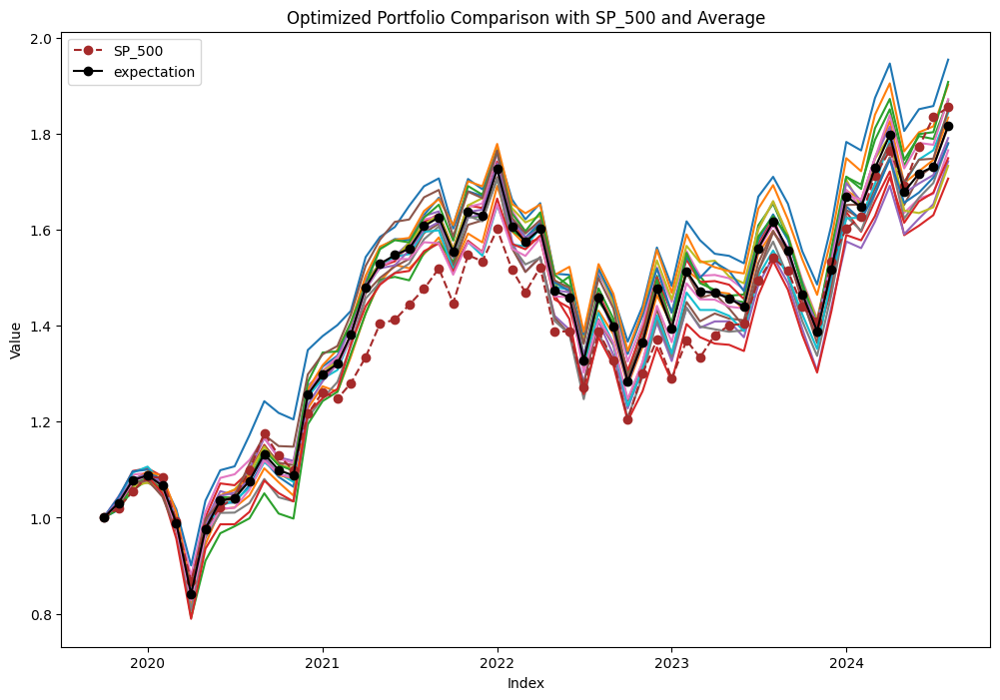

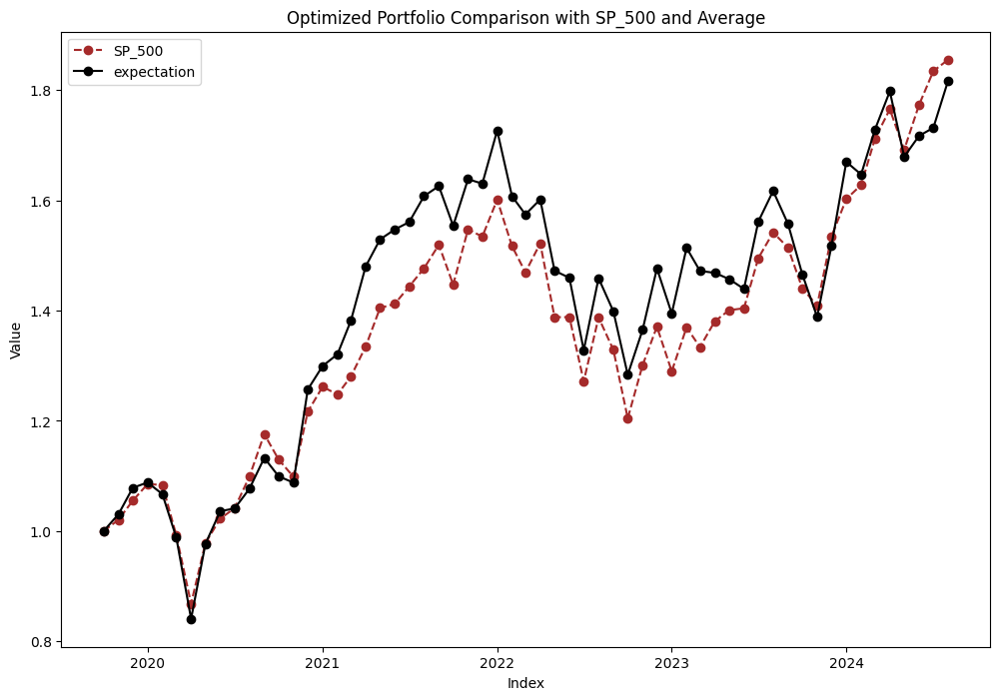

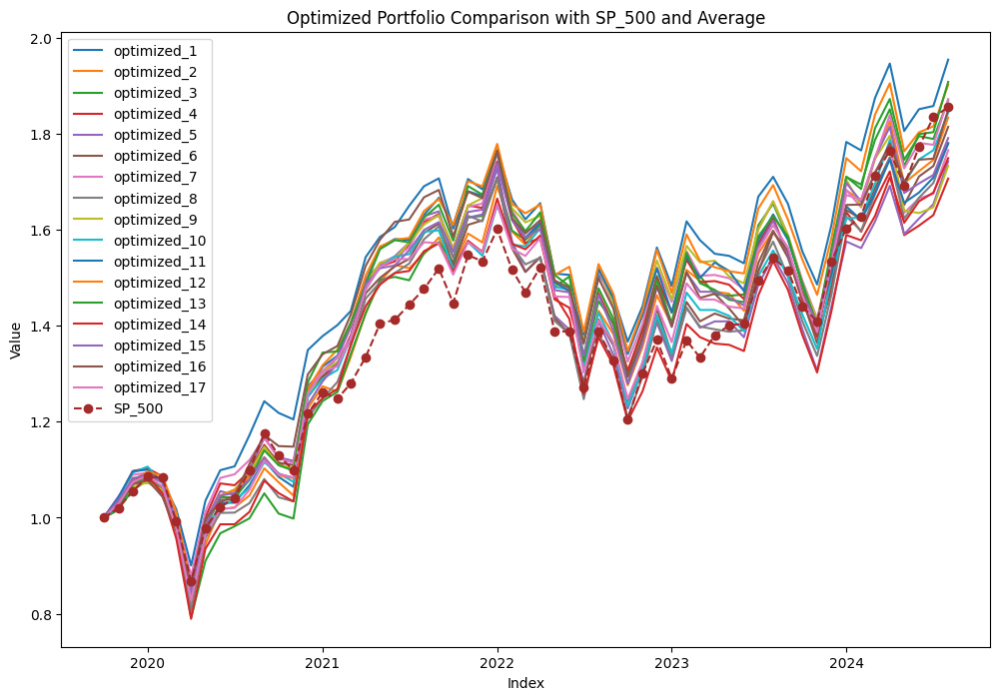

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.030336
2019-12-01,1.055174,1.078407
2020-01-01,1.085342,1.088221
2020-02-01,1.083575,1.066987
2020-03-01,0.992435,0.988514
2020-04-01,0.868262,0.840814
2020-05-01,0.978396,0.976941
2020-06-01,1.022699,1.036097


In [67]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [68]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0,0],3,0,0)
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.575831
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022       2023       2024
Percentile                                                          
99 percentile   8.526114  60.927285  36.675904  55.506285  95.429065
Average         9.934674  55.367071  28.363898  46.586070  81.740993
1 percentile   11.340285  56.069968  30.707525  45.148234  70.655611
sp500          12.975940  44.706627  20.454596  44.051876  85.515021
      1 percentile return in %
Year                          
1                         1.42
2                        32.35
3                       -21.48
4                        10.94
5                        16.49


NameError: name 'workbook_filename' is not defined

In [69]:
flist['100']=avg_100

In [35]:


def finale_visual(diction):
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Iterate over the dictionary (key as label, value as DataFrame)
    for label, df in diction.items():
        ax.plot(df['Optimized Portfolio'], label=f'{label}_optimized')
    
    # Plot the SP_500 from the last DataFrame (assuming it exists in the last DataFrame)
    last_df = list(diction.values())[-1]
    ax.plot(last_df['SP_500'], label='SP_500', linestyle='--', marker='o', color='red')
    
    # Concatenate all DataFrames (along the columns)
    concatenated_df = pd.concat(diction.values(), axis=1)
    
    # Average the columns related to 'SP_500' and 'Optimized Portfolio'
    averaged_df_A = concatenated_df.filter(like='SP_500').mean(axis=1)
    averaged_df_B = concatenated_df.filter(like='Optimized Portfolio').mean(axis=1)
    
    # Create a DataFrame for the averaged values
    averaged_df = pd.DataFrame({
        'SP_500': averaged_df_A,
        'Optimized Portfolio': averaged_df_B
    })
    
    # Uncomment if you want to plot the averaged data
    ax.plot(averaged_df.index, averaged_df['Optimized Portfolio'], label='Average optimized performance', marker='o', color='black')
    
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_title('Various Optimized Portfolio Comparison')
    ax.legend()
    plt.show()


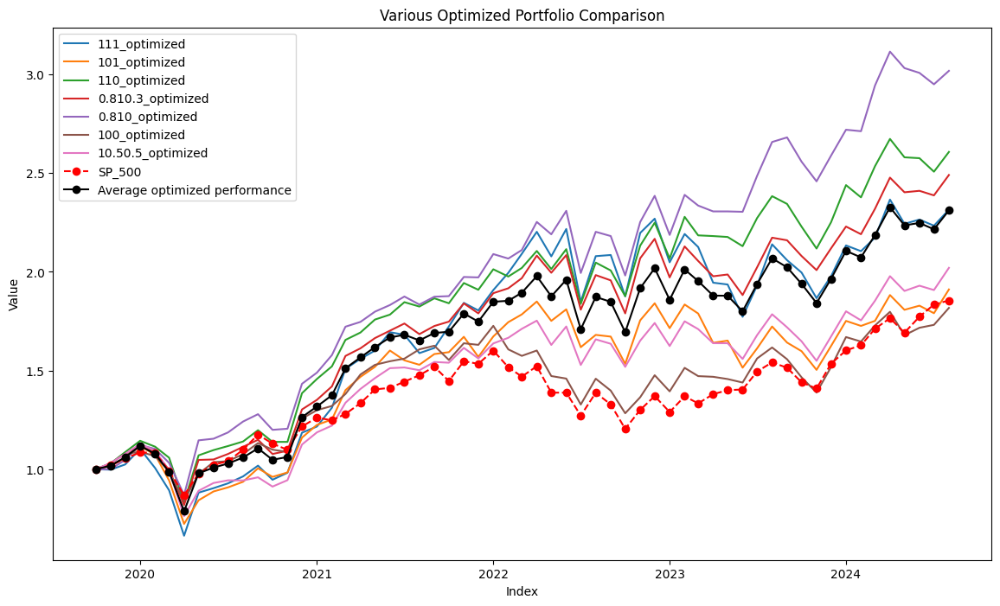

In [84]:
finale_visual(flist)

In [71]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,0.5,0.5)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'GEV', 'SOLV', 'CEG', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/5b3329e14d5942539cb2900db35f3d05-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/5b3329e14d5942539cb2900db35f3d05-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 972
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/41c7349b495e4668b1b0b1a4ffed6412-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/41c7349b495e4668b1b0b1a4ffed6412-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1008
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'GEV', 'AMT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ab8063e22cc64ca3916a55132bbdc9d1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ab8063e22cc64ca3916a55132bbdc9d1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 995
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/945fa50d81264e138af6d09ef4d20130-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/945fa50d81264e138af6d09ef4d20130-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 947
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/12b8dfacb9494c84b8d0528427fdffa7-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/12b8dfacb9494c84b8d0528427fdffa7-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 959
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1afe2843c4154f0497a4f2417e86c97a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1afe2843c4154f0497a4f2417e86c97a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1067
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ca7bac24f6de412c995e050ee27862ef-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ca7bac24f6de412c995e050ee27862ef-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 943
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/091fc83c1ac64265ad25e17d7fb9f9d1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/091fc83c1ac64265ad25e17d7fb9f9d1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 956
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/cb706c7f9971417cb3b6be1e4c7182fb-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/cb706c7f9971417cb3b6be1e4c7182fb-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1003
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'GEV', 'VLTO', 'CEG', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bb63b20e293340f28f8be9c35b7dc8fa-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bb63b20e293340f28f8be9c35b7dc8fa-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1020
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3918adcc2ec744ff9e42e7142143fce2-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3918adcc2ec744ff9e42e7142143fce2-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 982
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  39 of 39 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'AMTM', 'KVUE', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1374e128f0dd4222b0f36d8a7499cdfa-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1374e128f0dd4222b0f36d8a7499cdfa-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 967
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/7178cb9f261a4d9da399014ec53d38e9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/7178cb9f261a4d9da399014ec53d38e9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 987
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1dc52c3df66e4f508d1ed8448dae62d2-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1dc52c3df66e4f508d1ed8448dae62d2-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 980
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d699c05a3386474caabba10c44991b9a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d699c05a3386474caabba10c44991b9a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1010
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  38 of 38 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/84921b8d1b354388b883df36f68034ec-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/84921b8d1b354388b883df36f68034ec-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 956
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a34458e0904541ae983257a175487a16-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a34458e0904541ae983257a175487a16-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1123
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


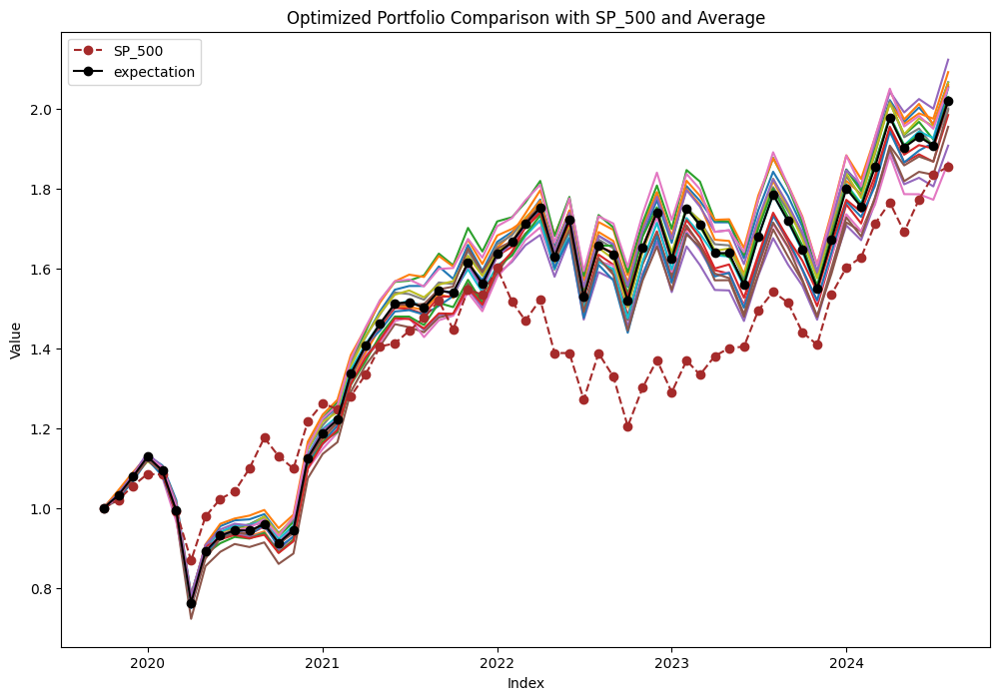

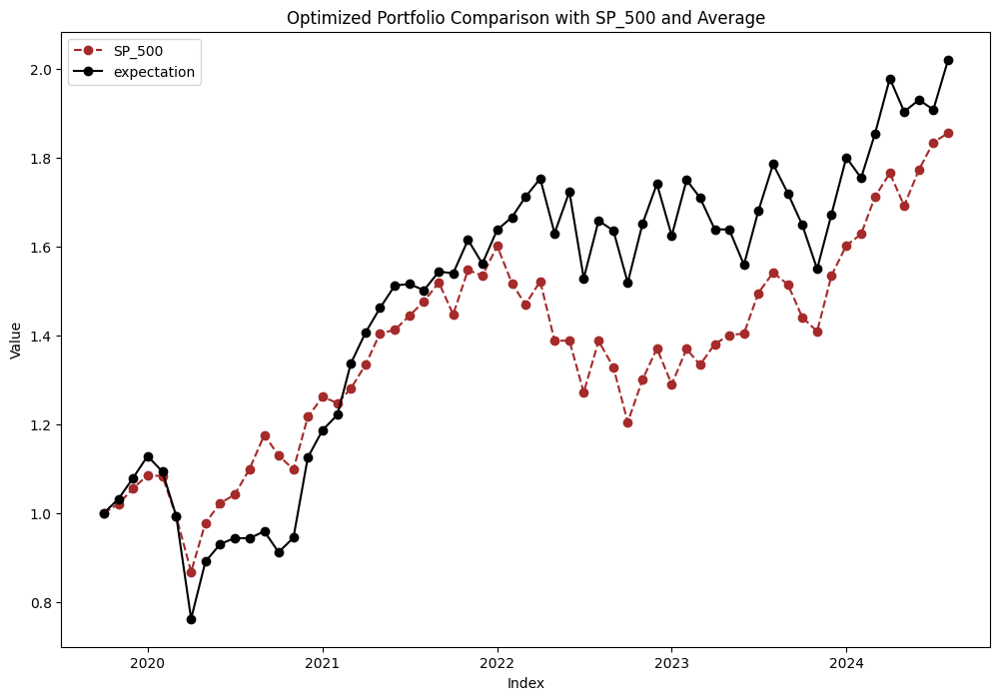

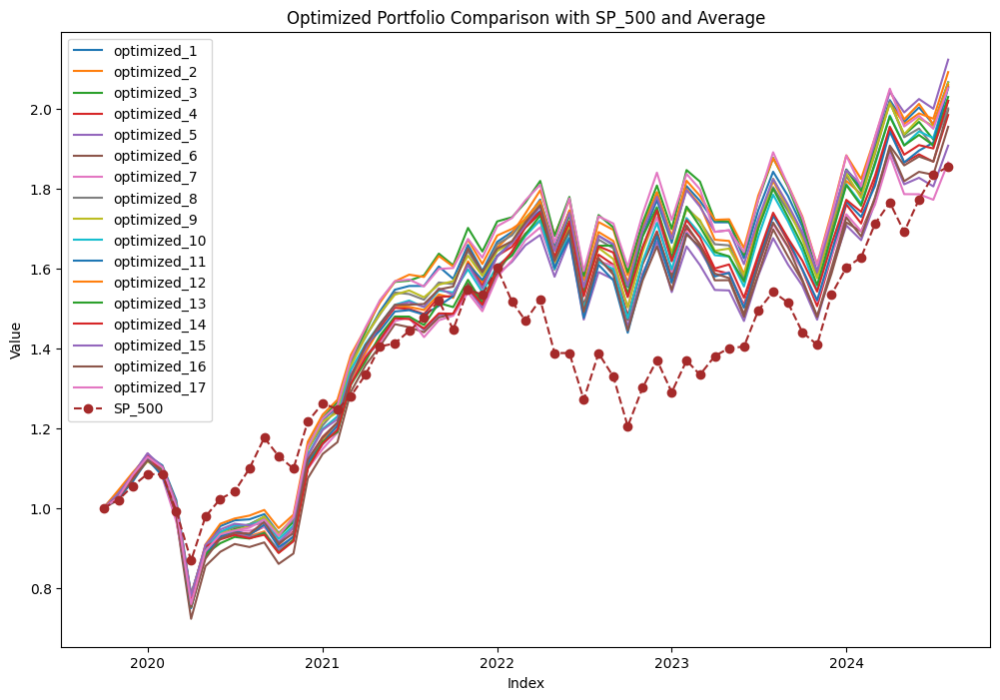

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.031770
2019-12-01,1.055174,1.078179
2020-01-01,1.085342,1.128482
2020-02-01,1.083575,1.093464
2020-03-01,0.992435,0.993370
2020-04-01,0.868262,0.762320
2020-05-01,0.978396,0.891178
2020-06-01,1.022699,0.930514


In [72]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [74]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
# save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0,0],3,0,0)
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.638511
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022       2023        2024
Percentile                                                           
99 percentile  -8.593478  53.405232  55.694063  69.090809  112.314873
Average        -8.773118  53.977600  51.874828  64.816578  102.039117
1 percentile   -8.596819  48.175212  50.374863  59.830451   86.560704
sp500          12.975940  44.706627  20.454596  44.051876   85.515021
      1 percentile return in %
Year                          
1                       -13.57
2                        62.74
3                        -6.89
4                         5.96
5                        16.97


,1,2,3,4,5
99th Percentile,-5.25,72.88,3.60,11.43,28.42
Median,-8.60,68.62,-1.27,7.94,23.37
1st Percentile,-13.57,62.74,-6.89,5.96,16.97
SP500,12.98,28.09,-16.76,19.59,28.78


In [73]:
flist['10.50.5']=avg_100

In [143]:
sim_one_percentile

,1 percentile return in %
Year,
1,3.87
2,35.48
3,-19.38
4,9.87
5,19.51


In [149]:
save_df_with_combination_to_excel(gdsk,workbook_filename,'downside_protection',['SP500','SP500','SP500'],1,0,0)

(2,)

In [135]:
print(cumulative_exp_return)
print(sim_one_percentile)

Year                2020       2021       2022       2023       2024
Percentile                                                          
99 percentile  10.768793  53.566223  30.186239  54.272990  99.899360
Average         9.582083  54.632116  28.671675  46.633653  83.311572
1 percentile    6.974920  55.459478  27.862423  41.413875  73.269128
sp500          12.975940  44.706627  20.454596  44.051876  85.515021
      1 percentile return in %
Year                          
1                         3.87
2                        35.48
3                       -19.38
4                         9.87
5                        19.51


In [147]:
gdsk=yoy_exp_return.copy()
gdsk.drop(['99th Percentile','1st Percentile','Median'],inplace=True)
gdsk=gdsk.T
gdsk=gdsk.rename(columns={'SP500':'1 percentile return in %'})
gdsk.index.name = 'Year'

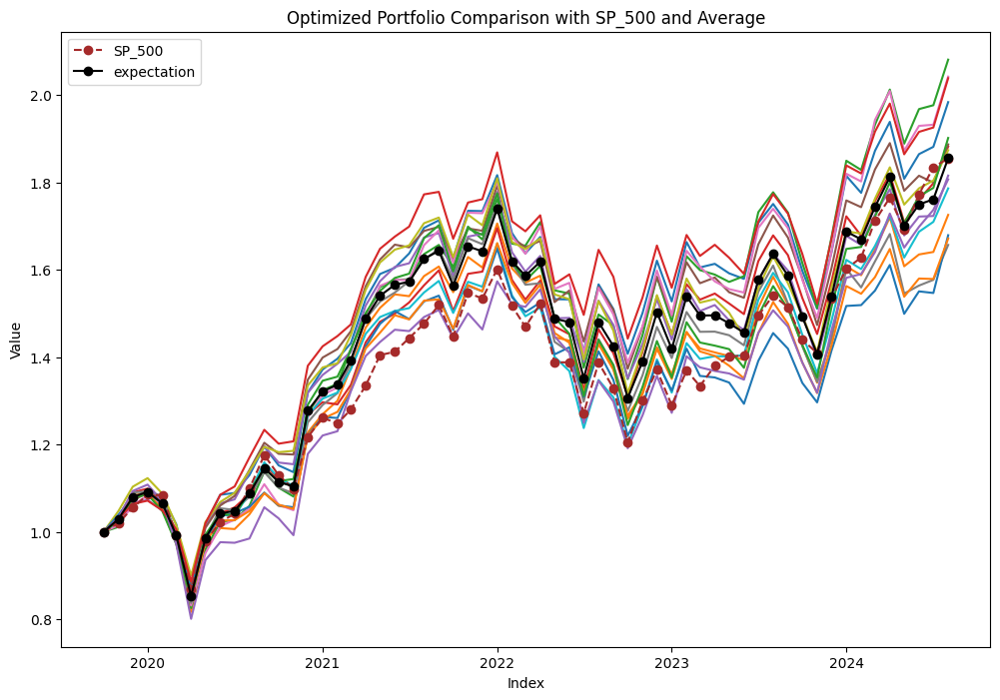

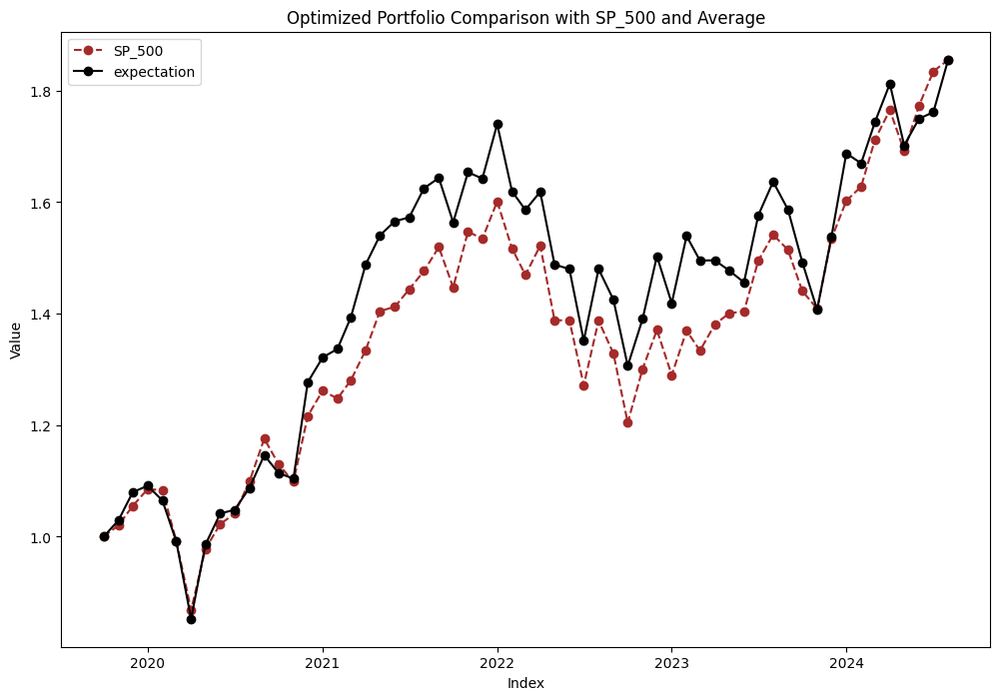

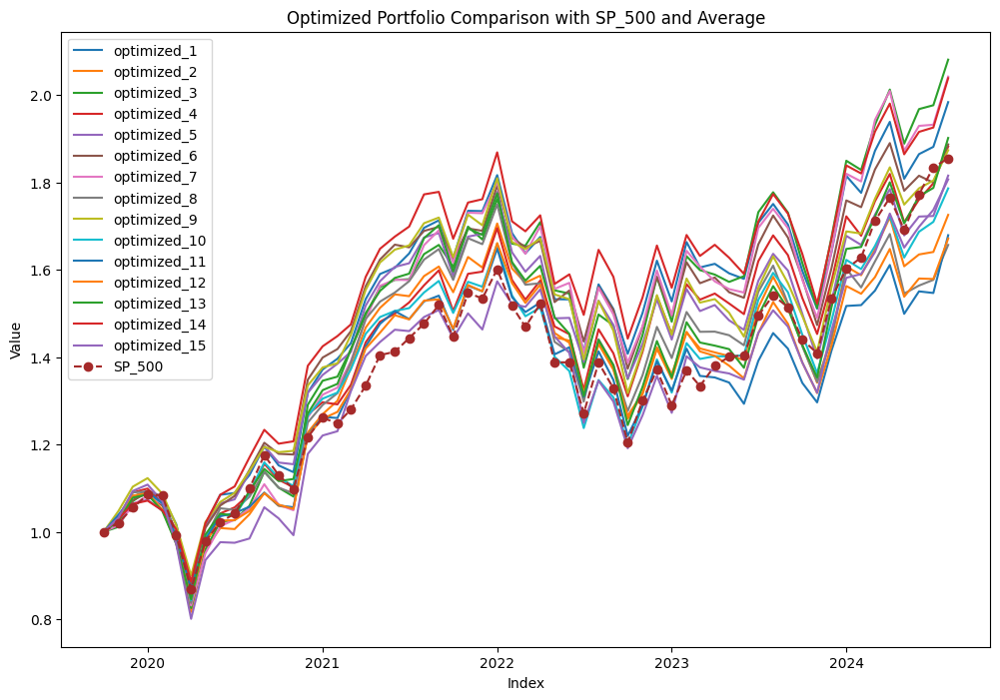

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.029277
2019-12-01,1.055174,1.079774
2020-01-01,1.085342,1.091417
2020-02-01,1.083575,1.065132
2020-03-01,0.992435,0.991641
2020-04-01,0.868262,0.852765
2020-05-01,0.978396,0.985969
2020-06-01,1.022699,1.041673


In [35]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

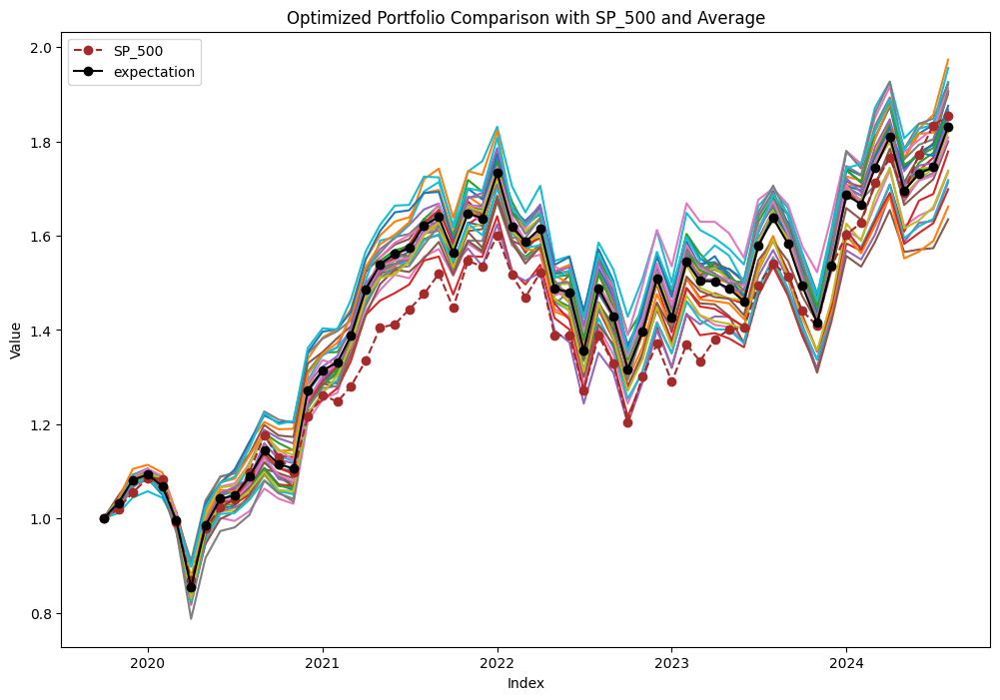

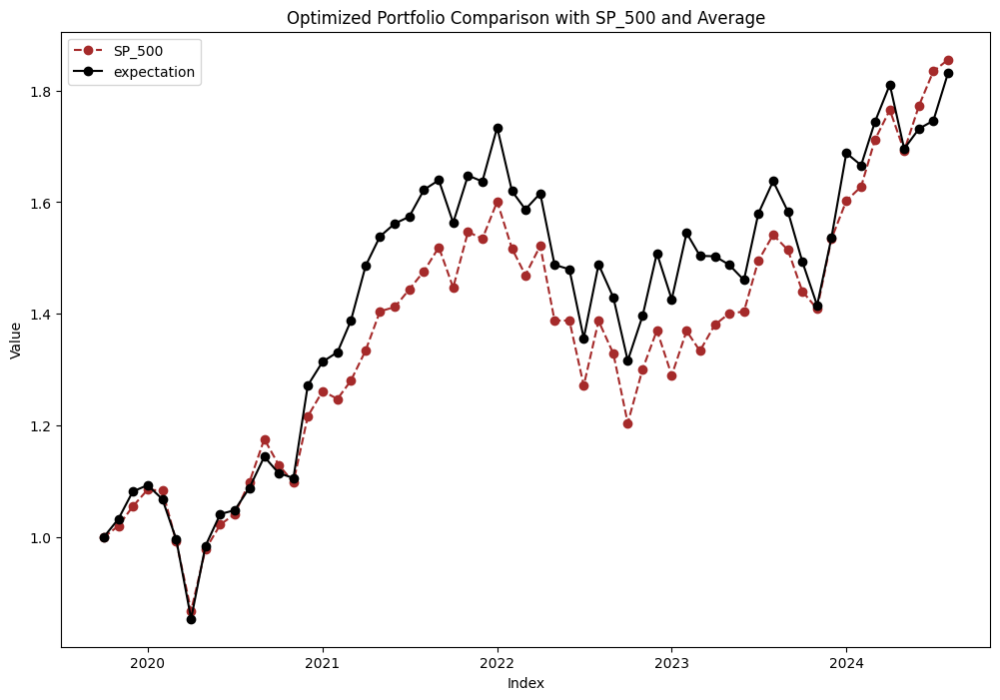

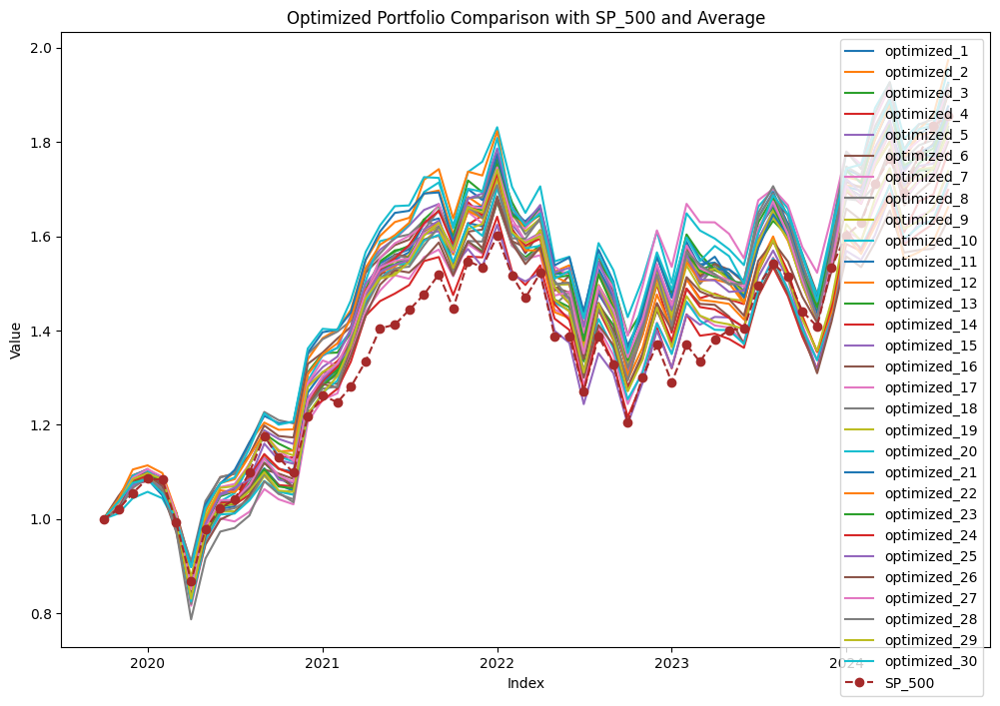

In [38]:
avg_100=final_visual()#100
final_visual2()
final_visual1()


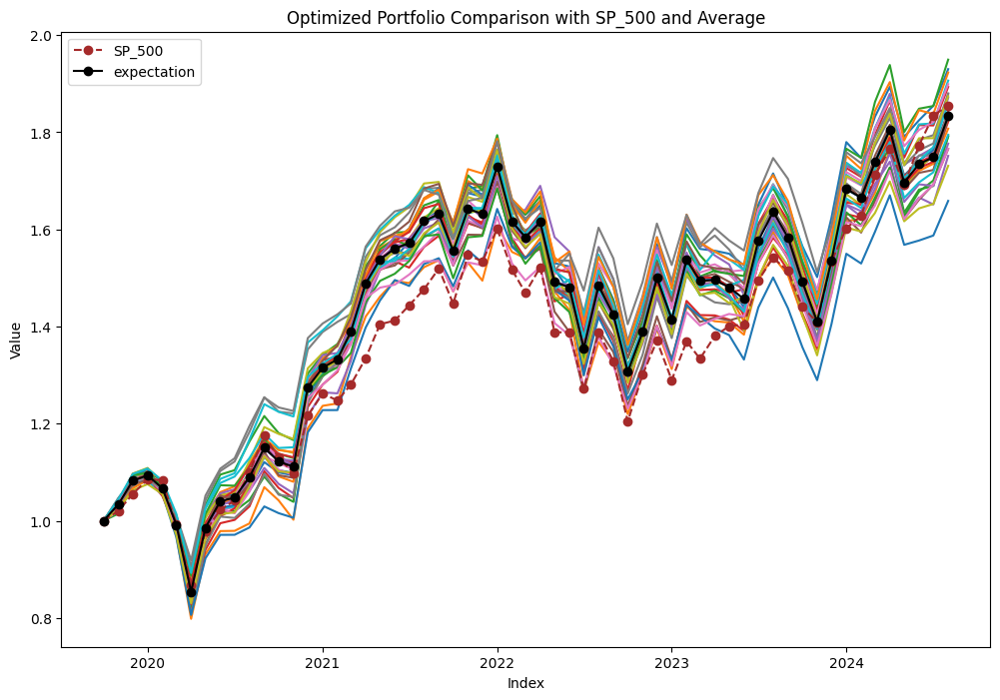

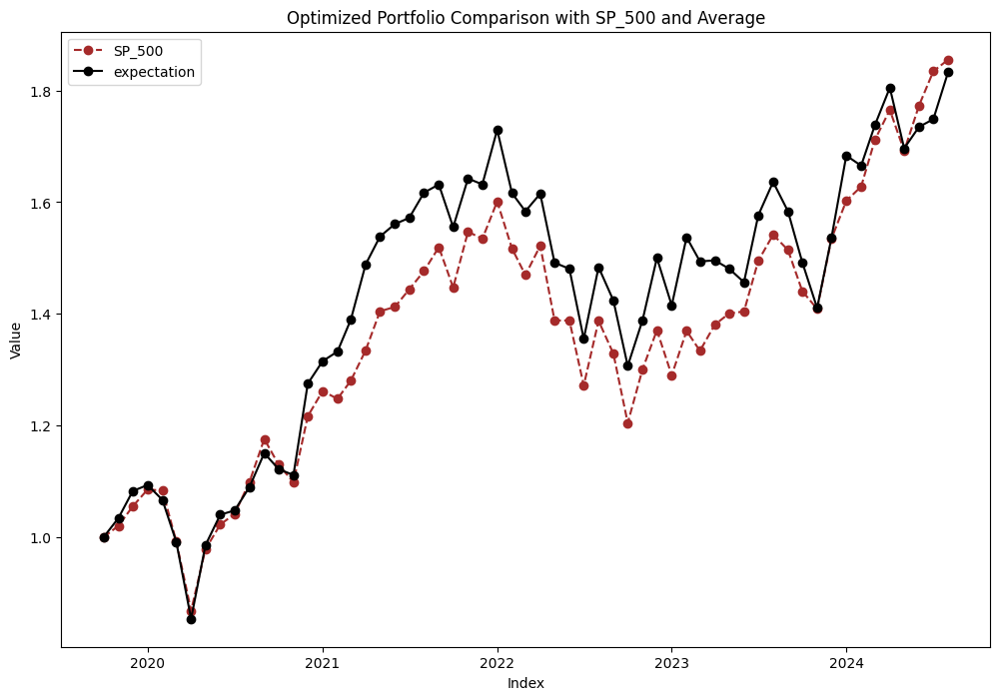

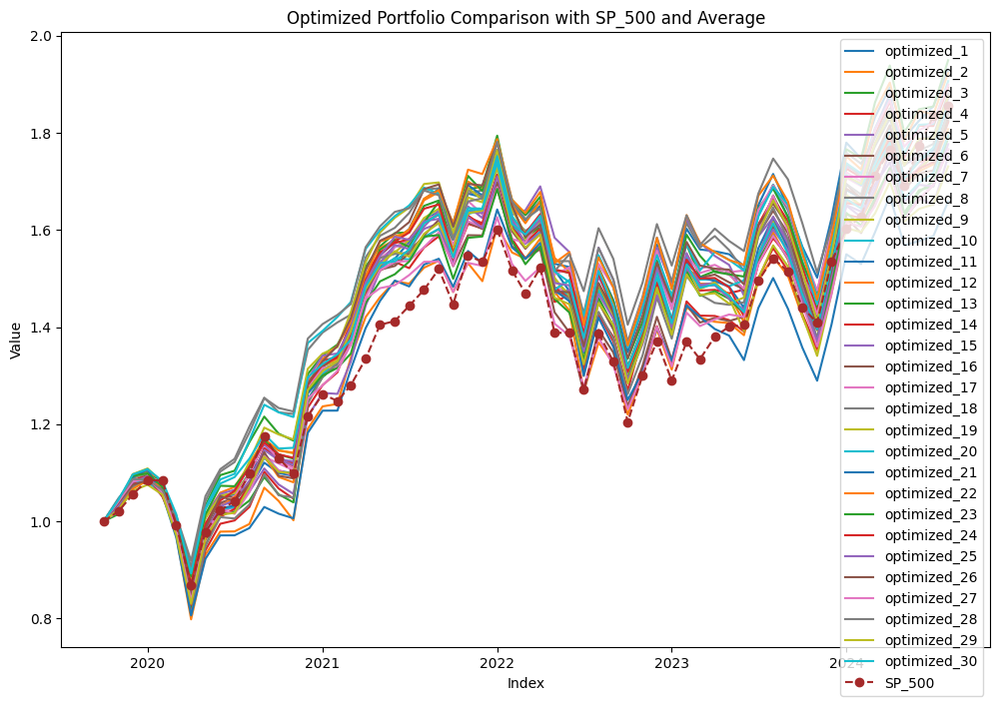

In [69]:
avg_100=final_visual()#100
final_visual2()
final_visual1()


In [55]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(5,1,1,0)

[*********************100%%**********************]  501 of 501 completed

16 Failed downloads:
['KVUE', 'LRCX', 'MPC']: ConnectionError(ProtocolError('Connection aborted.', RemoteDisconnected('Remote end closed connection without response')))
['VLTO', 'AMTM', 'PLTR', 'SW', 'SOLV', 'GEV', 'OTIS', 'CARR', 'GEHC', 'ABNB', 'CEG']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  471 of 471 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/213557fb465f487987f39aae14d86ca3-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/213557fb465f487987f39aae14d86ca3-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2434 COLUMNS
At line 43046 RHS
At line 45476 BOUNDS
At line 45948 ENDATA
Problem MODEL has 2429 rows, 2390 columns and 39634 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.10 seconds
Cgl0004I processed model has 1016 rows, 1448 columns (471 integer (471 of which binary)) and 36808 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.51314 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['KVUE', 'VLTO', 'AMTM', 'PLTR', 'SW', 'SOLV', 'GEV', 'OTIS', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/b7065d48cc1943a8bcc45bdacc5e5e21-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/b7065d48cc1943a8bcc45bdacc5e5e21-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['KVUE', 'VLTO', 'AMTM', 'PLTR', 'SW', 'SOLV', 'GEV', 'OTIS', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/562d30baa469497eaea7302118025b70-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/562d30baa469497eaea7302118025b70-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 ite

[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  40 of 40 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['KVUE', 'VLTO', 'AMTM', 'PLTR', 'SW', 'SOLV', 'GEV', 'OTIS', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/53fffdcc1f14439a82563b2b49fa27f1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/53fffdcc1f14439a82563b2b49fa27f1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['KVUE', 'VLTO', 'AMTM', 'PLTR', 'SW', 'SOLV', 'GEV', 'OTIS', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/e7fb640fd08b44a8a12f304786e9f803-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/e7fb640fd08b44a8a12f304786e9f803-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


In [53]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,1,0)

[*********************100%%**********************]  500 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CEG', 'AMTM', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/02c4ff9953fd41809b3c7c8812df5f8d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/02c4ff9953fd41809b3c7c8812df5f8d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 992
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'GEV', 'CEG', 'SOLV', 'VLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/988c23f3a5cb4ec4a2c4849793f51775-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/988c23f3a5cb4ec4a2c4849793f51775-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 1041
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before mi

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'CEG', 'AMT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/cfe550cdf91e46bd8791841374267edf-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/cfe550cdf91e46bd8791841374267edf-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 941
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'SOLV', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d9ebccc84f924d2080345cdf8fe943ec-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d9ebccc84f924d2080345cdf8fe943ec-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 962
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'KVUE', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/44dc5663be144d7ca7274356977ec678-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/44dc5663be144d7ca7274356977ec678-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 985
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3865907069234c31939c78d81a6471f9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3865907069234c31939c78d81a6471f9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 986
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'GEV', 'VLTO', 'CEG', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/411af2b953734d3e991ce6acd0ebc9bd-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/411af2b953734d3e991ce6acd0ebc9bd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 956
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/20e6155fe49642f8aaae211fff43677e-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/20e6155fe49642f8aaae211fff43677e-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 941
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ea9a7f8250d74cd4ab8127d3681c58c4-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ea9a7f8250d74cd4ab8127d3681c58c4-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 933
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'CEG', 'VLTO', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/aad6e546078b4535ae9e9b012b8b7034-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/aad6e546078b4535ae9e9b012b8b7034-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 971
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/97edd1663e4e4da3ba5c1729ea7f5416-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/97edd1663e4e4da3ba5c1729ea7f5416-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 1018
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before mi

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ddc5567ea9434c3888ba79fc622cacb8-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ddc5567ea9434c3888ba79fc622cacb8-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 1023
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before mi

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a8a465577de14e0e8f9c3d2fb34dfc8a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a8a465577de14e0e8f9c3d2fb34dfc8a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 952
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/68f2d078b4d04bbe86b97f4feaa37fa3-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/68f2d078b4d04bbe86b97f4feaa37fa3-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 963
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be 

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/41eaf9394a62478998242acda37227d9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/41eaf9394a62478998242acda37227d9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 1021
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before mi

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'AMTM', 'S

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a545211bd5bd41b8b83db80564ad0311-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a545211bd5bd41b8b83db80564ad0311-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 948
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'CEG', 'SOLV', 'VLTO', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/918108092f3b46389f6ac60bcf615808-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/918108092f3b46389f6ac60bcf615808-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.32099 iterations 971
Cbc0038I Solution found of 1.32099
Cbc0038I Relaxing continuous gives 1.32099
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


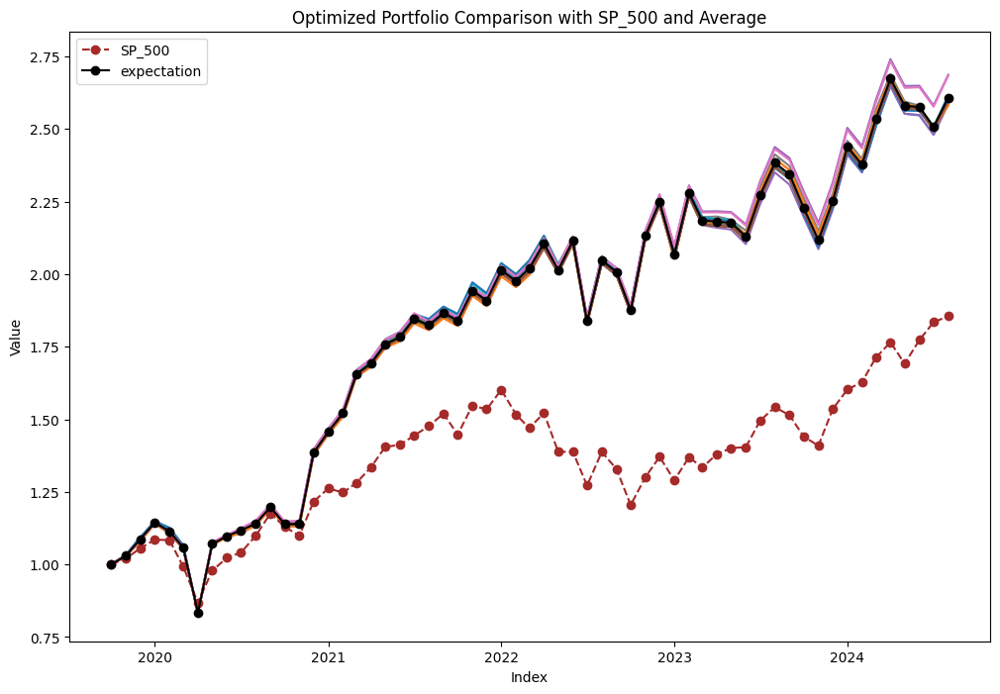

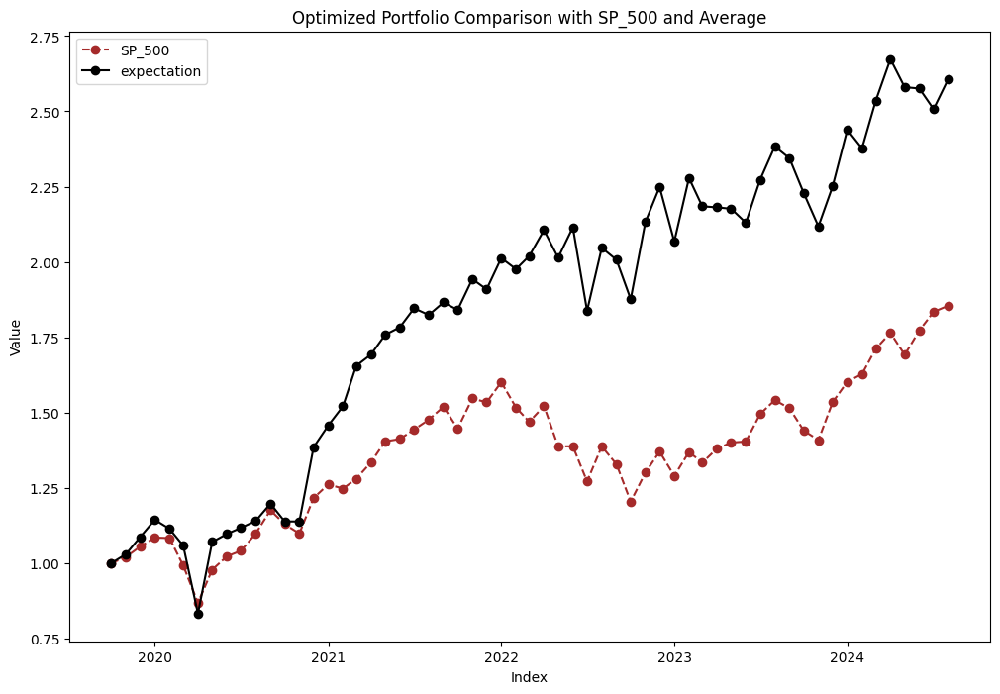

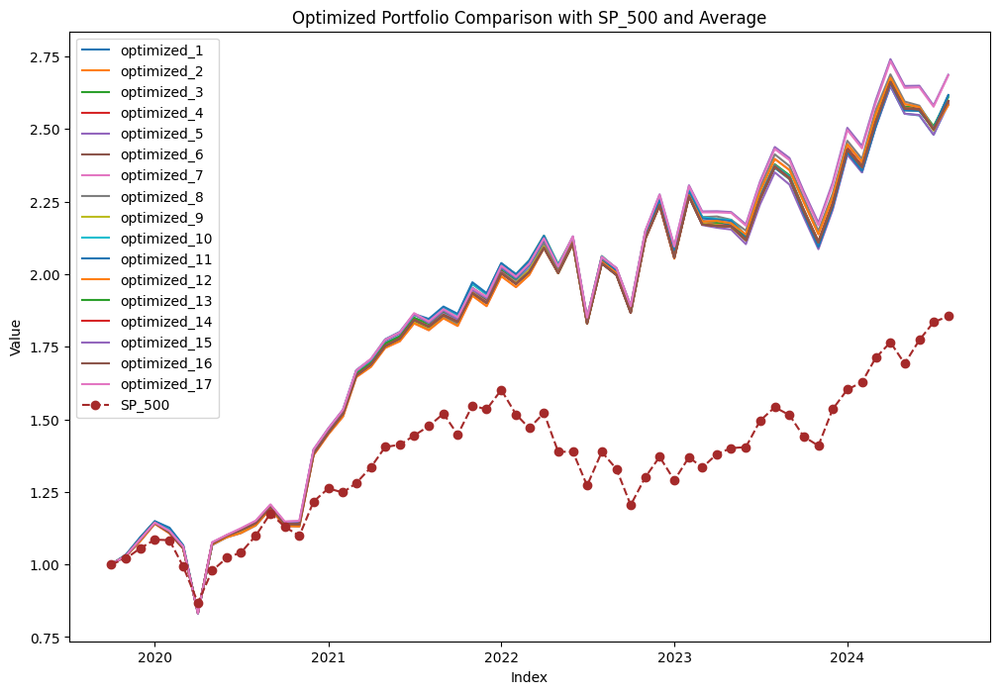

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.030001
2019-12-01,1.055174,1.086693
2020-01-01,1.085342,1.144407
2020-02-01,1.083575,1.114424
2020-03-01,0.992435,1.058520
2020-04-01,0.868262,0.833132
2020-05-01,0.978396,1.070543
2020-06-01,1.022699,1.097192


In [54]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [56]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,1,0],4,0,0)
flist['110']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.804897
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022        2023        2024
Percentile                                                            
99 percentile  14.684137  84.638058  89.126812  128.544152  168.677839
Average        13.873126  84.088746  87.645576  122.899629  160.751380
1 percentile   13.257174  82.163738  87.102903  124.813481  158.228718
sp500          12.975940  44.706627  20.454596   44.051876   85.515021
      1 percentile return in %
Year                          
1                        13.26
2                        60.84
3                         1.17
4                        17.11
5                        14.34


,1,2,3,4,5
99th Percentile,14.79,63.22,2.98,20.78,18.47
Median,13.89,61.28,1.72,18.79,17.06
1st Percentile,13.26,60.84,1.17,17.11,14.34
SP500,12.98,28.09,-16.76,19.59,28.78


In [58]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,0.8,1,0.3)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'CEG', 'VLTO', 'SOLV', 'GEV', 'AMTM', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/272124db8e284ba498a2326ecf3e1331-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/272124db8e284ba498a2326ecf3e1331-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1039
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'GEV', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/fd0f5b3662af456d8ad55e3d56e1e14c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/fd0f5b3662af456d8ad55e3d56e1e14c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1107
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6b5a4a8c5b354327a652caee06cd9d6c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6b5a4a8c5b354327a652caee06cd9d6c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1071
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'AMTM', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/66ad2c7f5b9c4e9d821a83c45f417f3d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/66ad2c7f5b9c4e9d821a83c45f417f3d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1.00043
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1103
Cbc0038

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/f64d617ae40a4bc390309621e4096200-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/f64d617ae40a4bc390309621e4096200-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1.00005
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1096
Cbc0038

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'AMTM', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/dfd3fde8c37a4f00a7000a5f5a062a61-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/dfd3fde8c37a4f00a7000a5f5a062a61-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1025
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'GEV', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2a731819c6374dabaa287a7008081850-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2a731819c6374dabaa287a7008081850-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1044
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'KV

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4d3e70bd55f24990b38739a1cec26ae5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4d3e70bd55f24990b38739a1cec26ae5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1023
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/f2650846eb45418a9bcb099333695bb5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/f2650846eb45418a9bcb099333695bb5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1188
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8f1280f3c3924a999150fd8d29b952a1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8f1280f3c3924a999150fd8d29b952a1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1056
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d6c67877a28e4146a20ce05ec744dd6d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d6c67877a28e4146a20ce05ec744dd6d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1067
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  500 of 501 completed

15 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'AMTM', 'KV

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/64831e2ac9a44a7a80cc5cfe97e5f1d0-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/64831e2ac9a44a7a80cc5cfe97e5f1d0-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2439 COLUMNS
At line 43137 RHS
At line 45572 BOUNDS
At line 46045 ENDATA
Problem MODEL has 2434 rows, 2395 columns and 39718 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1018 rows, 1451 columns (472 integer (472 of which binary)) and 36886 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.71985 iterations 1054
Cbc0038I Solution found of 1.71985
Cbc0038I Relaxing continuous gives 1.71985
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'GEV', 'AMT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/087c07b1bccd48309447477773995b27-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/087c07b1bccd48309447477773995b27-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1.00086
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1092
Cbc0038

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'CEG', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3d293bf8d52847ba817a963b42b41082-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3d293bf8d52847ba817a963b42b41082-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1065
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1000309f2b2e49efbcbb54b9f8777980-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1000309f2b2e49efbcbb54b9f8777980-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1089
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'CEG', 'AMTM', 'SOLV', 'VL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e20188e910234d798eff5de1c6c3d01e-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e20188e910234d798eff5de1c6c3d01e-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1071
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b890c3c28cc24142988450ecc1be4af5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b890c3c28cc24142988450ecc1be4af5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0643041 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 28 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.39146 iterations 1116
Cbc0038I Solution found of 1.39146
Cbc0038I Relaxing continuous gives 1.39146
Cbc0038I B

[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  28 of 28 completed
[*********************100%%**********************]  1 of 1 completed


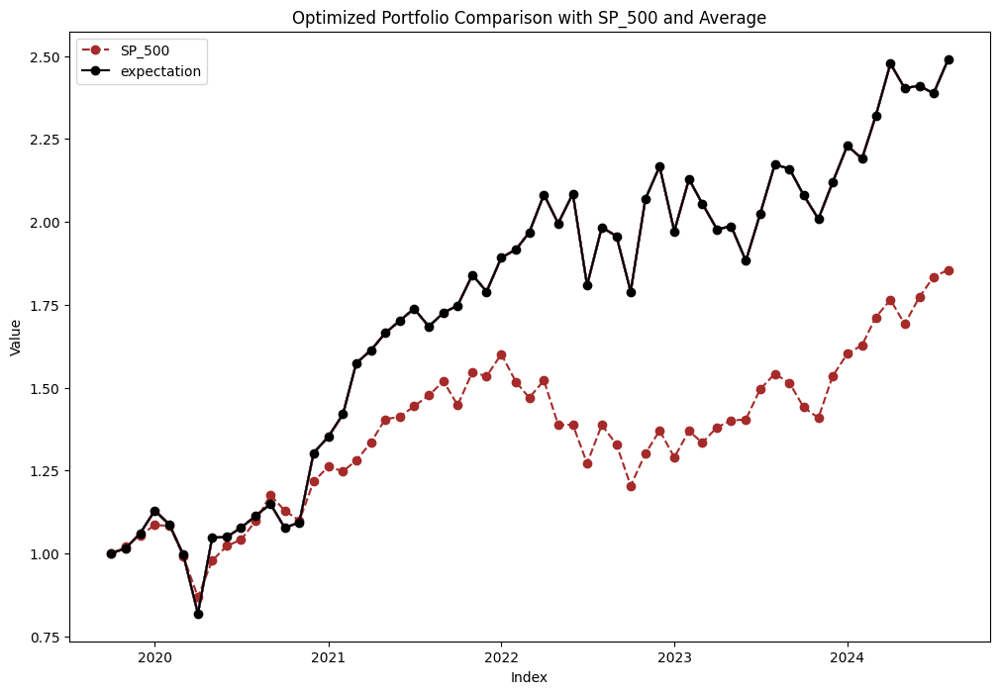

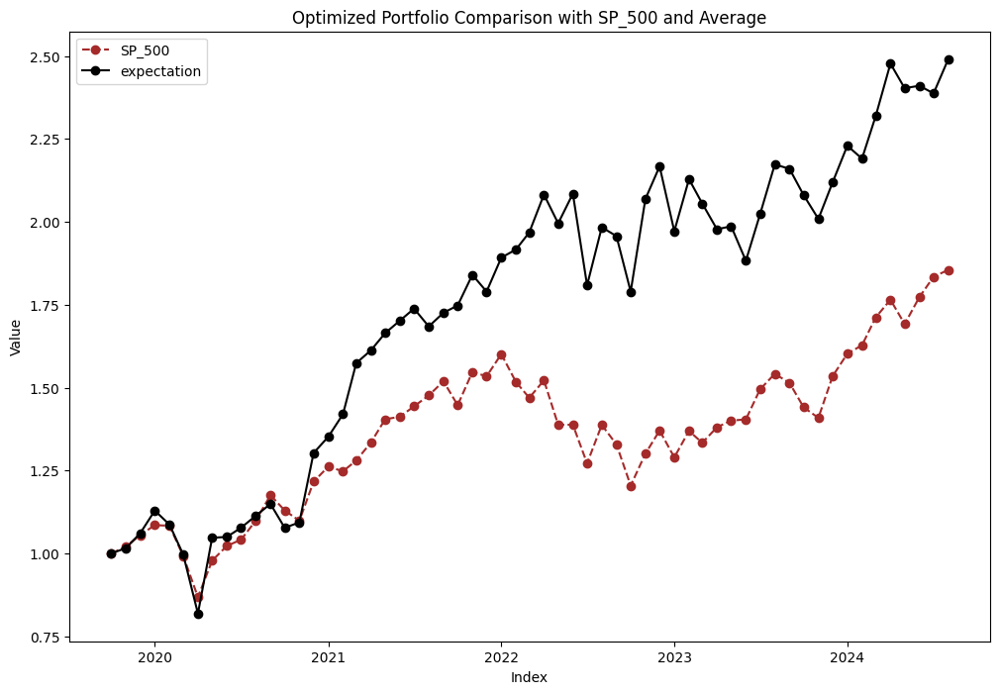

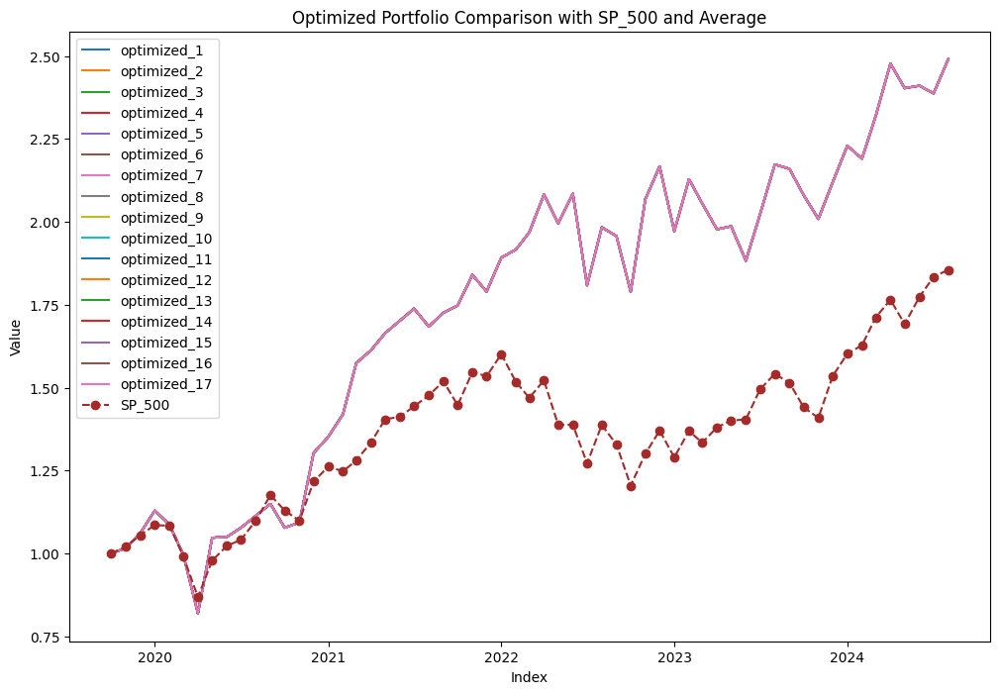

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.016064
2019-12-01,1.055174,1.060344
2020-01-01,1.085342,1.129245
2020-02-01,1.083575,1.086984
2020-03-01,0.992435,0.996482
2020-04-01,0.868262,0.818762
2020-05-01,0.978396,1.047365
2020-06-01,1.022699,1.049741


In [59]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [60]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[0.8,1,0.3],7,0,0)
flist['0.810.3']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.779279
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022        2023        2024
Percentile                                                            
99 percentile   7.749039  74.784804  78.956319  108.029583  149.072770
Average         7.749039  74.784804  78.956319  108.029583  149.072770
1 percentile    7.749039  74.784804  78.956319  108.029583  149.072770
sp500          12.975940  44.706627  20.454596   44.051876   85.515021
      1 percentile return in %
Year                          
1                         7.75
2                        62.21
3                         2.39
4                        16.25
5                        19.73


,1,2,3,4,5
99th Percentile,7.75,62.21,2.39,16.25,19.73
Median,7.75,62.21,2.39,16.25,19.73
1st Percentile,7.75,62.21,2.39,16.25,19.73
SP500,12.98,28.09,-16.76,19.59,28.78


In [61]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,0.8,1,0)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'AMTM', 'CEG', 'GEV', 'SOLV', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bcbeea23782e46c2afdad25e42448275-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bcbeea23782e46c2afdad25e42448275-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06587
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1008
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'AMTM', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6bb38ba00da24092a266691685dd7e03-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6bb38ba00da24092a266691685dd7e03-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06088
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1001
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'KVUE', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/627cf715821a47f5bed2099f93390547-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/627cf715821a47f5bed2099f93390547-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.08409
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1001
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'ABNB', 'GEHC', 'PLTR', 'VLTO', 'KVUE', 'SOLV', 'A

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/0b945bd24ed543a0a9a82e55535b31d4-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/0b945bd24ed543a0a9a82e55535b31d4-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.09282
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 975
Cbc0038I

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'GEV', 'AMTM', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/caab7e89dddd49e6bb7ed807e679e6d5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/caab7e89dddd49e6bb7ed807e679e6d5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06177
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1006
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'GEV', 'AMT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/cca9a1426d804c11ab0f909c7927dae9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/cca9a1426d804c11ab0f909c7927dae9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.0774
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 877
Cbc0038I 

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  500 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d458831a6aff4aadaf38c4209991a2b1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d458831a6aff4aadaf38c4209991a2b1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.09511
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 996
Cbc0038I

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'SOLV', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/86b01d4e2e1b4cf9a567a426c581bf14-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/86b01d4e2e1b4cf9a567a426c581bf14-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.07656
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1009
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6f36f9c06c7744b9b352ecd07beb0c33-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6f36f9c06c7744b9b352ecd07beb0c33-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06852
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1043
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8c31af773e164cd08c538a510b4dfa5a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8c31af773e164cd08c538a510b4dfa5a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.05 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.10129
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1029
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'GEV', 'VLTO', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b1dda53ee4864e39b6dcb8e57c0f9459-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b1dda53ee4864e39b6dcb8e57c0f9459-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.07861
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1018
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/7566c1339e0e48bc996e9531c24ce077-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/7566c1339e0e48bc996e9531c24ce077-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.08969
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1104
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/03b56f7e898746a89825daf835b286a7-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/03b56f7e898746a89825daf835b286a7-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06986
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1047
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'AMTM', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8534cfb78f374b57a551efc7f383f650-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8534cfb78f374b57a551efc7f383f650-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.05164
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1017
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2ffb73cab0464d9b9dac3fc6518fc46e-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2ffb73cab0464d9b9dac3fc6518fc46e-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.06722
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1056
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'KVUE', 'SOLV', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bb8bc392af62400fba4e44d3fcf143b0-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bb8bc392af62400fba4e44d3fcf143b0-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.04699
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 1029
Cbc0038

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/80e00a3ae9da46529be1ff9b69ac2f49-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/80e00a3ae9da46529be1ff9b69ac2f49-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0278749 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 33 integers unsatisfied sum - 1.10176
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.31389 iterations 985
Cbc0038I

[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  33 of 33 completed
[*********************100%%**********************]  1 of 1 completed


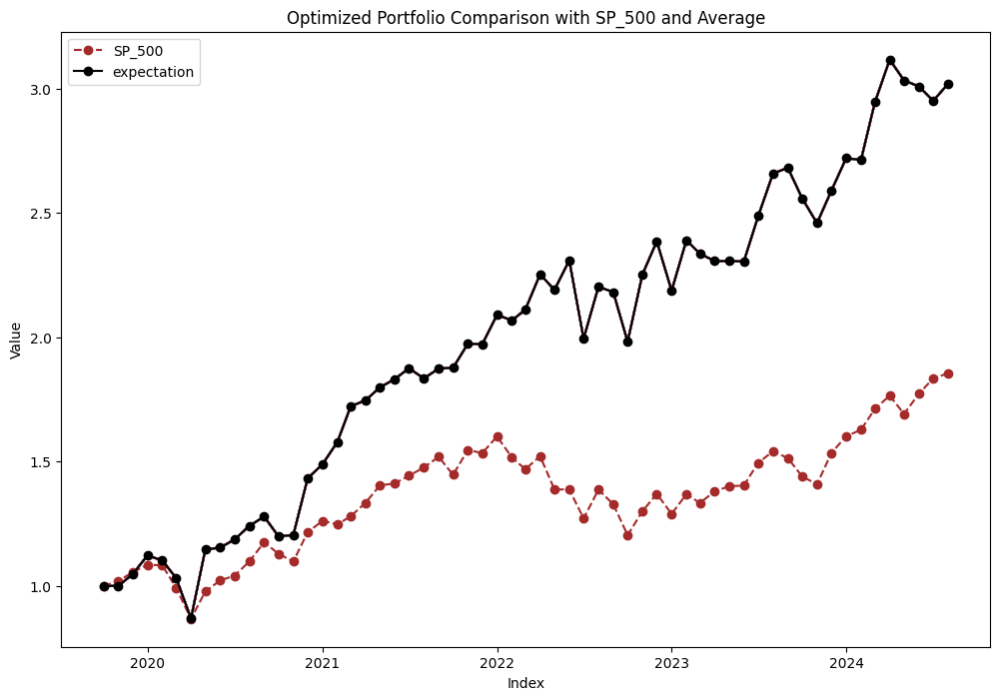

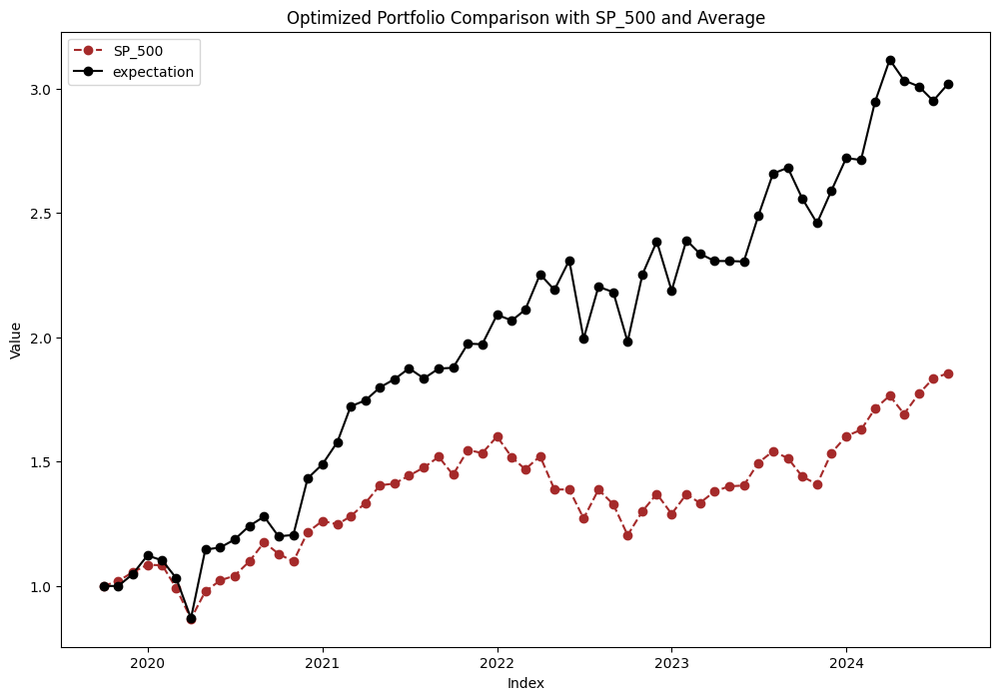

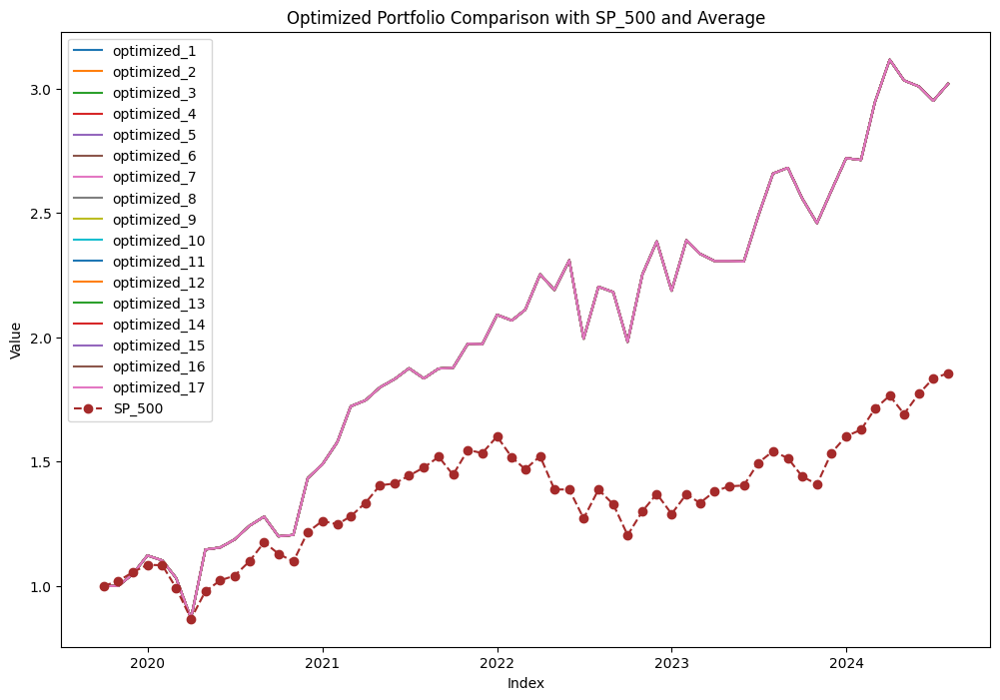

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.000522
2019-12-01,1.055174,1.047612
2020-01-01,1.085342,1.122943
2020-02-01,1.083575,1.102927
2020-03-01,0.992435,1.032187
2020-04-01,0.868262,0.870301
2020-05-01,0.978396,1.146621
2020-06-01,1.022699,1.154827


In [62]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [65]:
flist

{'111':               SP_500  Optimized Portfolio
 Date                                     
 2019-10-01  1.000000             1.000000
 2019-11-01  1.020432             0.998068
 2019-12-01  1.055174             1.024318
 2020-01-01  1.085342             1.103158
 2020-02-01  1.083575             1.006284
 2020-03-01  0.992435             0.893356
 2020-04-01  0.868262             0.663355
 2020-05-01  0.978396             0.881620
 2020-06-01  1.022699             0.904421
 2020-07-01  1.041505             0.928775
 2020-08-01  1.098893             0.963811
 2020-09-01  1.175887             1.018463
 2020-10-01  1.129759             0.947036
 2020-11-01  1.098504             0.982423
 2020-12-01  1.216643             1.185277
 2021-01-01  1.261807             1.216619
 2021-02-01  1.247754             1.311830
 2021-03-01  1.280310             1.508463
 2021-04-01  1.334645             1.559514
 2021-05-01  1.404614             1.601014
 2021-06-01  1.412320             1.694240
 202

In [63]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[0.8,1,0],8,0,0)
flist['0.810']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.937771
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022        2023        2024
Percentile                                                            
99 percentile  19.978637  87.707115  98.162775  155.805672  201.827408
Average        19.978637  87.707115  98.162775  155.805672  201.827408
1 percentile   19.978637  87.707115  98.162775  155.805672  201.827408
sp500          12.975940  44.706627  20.454596   44.051876   85.515021
      1 percentile return in %
Year                          
1                        19.98
2                        56.45
3                         5.57
4                        29.09
5                        17.99


,1,2,3,4,5
99th Percentile,19.98,56.45,5.57,29.09,17.99
Median,19.98,56.45,5.57,29.09,17.99
1st Percentile,19.98,56.45,5.57,29.09,17.99
SP500,12.98,28.09,-16.76,19.59,28.78


In [85]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1.1,0,0)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CEG', 'AMTM', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/759245ef07834fccbbfdbc04f4ce4323-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/759245ef07834fccbbfdbc04f4ce4323-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 600
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/75a5d2e48dac4ccf8e1076462a7c5629-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/75a5d2e48dac4ccf8e1076462a7c5629-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 605
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'CEG', 'SOLV', 'GEV', 'VLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8e1917eeea9b4d55bbdd2ecb61d5d904-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8e1917eeea9b4d55bbdd2ecb61d5d904-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 636
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/eaba16420024450ab9d0e717229cd485-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/eaba16420024450ab9d0e717229cd485-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 614
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/76ca805b25f543909fa0a15f374b2600-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/76ca805b25f543909fa0a15f374b2600-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 643
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'CEG', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8362b6c1156b4d2c98f78e2134f75af1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8362b6c1156b4d2c98f78e2134f75af1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 596
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'AMTM', 'KV

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4e35e276fc9a457da31955aca429e1f9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4e35e276fc9a457da31955aca429e1f9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 605
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/056921e988eb4a5193cad188047d8c8e-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/056921e988eb4a5193cad188047d8c8e-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 604
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'AMTM', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/67443d3febc041dba4439614c63f893b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/67443d3febc041dba4439614c63f893b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 644
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'CEG', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/84bf21107d0e40da8aeb217ad6b3d412-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/84bf21107d0e40da8aeb217ad6b3d412-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 631
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'KVUE', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/f56a4ac3c9bc4b8ba698861a08079d9b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/f56a4ac3c9bc4b8ba698861a08079d9b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 607
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'KVUE', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/f45bbe5dc73e4856bded98b3e547f357-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/f45bbe5dc73e4856bded98b3e547f357-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 592
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['CARR', 'SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1af01f1694f847c89e61c48c3ff42e6d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1af01f1694f847c89e61c48c3ff42e6d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 603
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/54b4346fae074b74b8d8ca6c991f3c13-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/54b4346fae074b74b8d8ca6c991f3c13-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.05 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 640
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8b1a596e8c864babbddf0817941320a1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8b1a596e8c864babbddf0817941320a1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 638
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2ddb69bf50d043b2968e0dbafad2980a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2ddb69bf50d043b2968e0dbafad2980a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 594
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'AMTM', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ba56335fac2642378aa47051d03883a7-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ba56335fac2642378aa47051d03883a7-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.11634 iterations 662
Cbc0038I Solution found of 1.11634
Cbc0038I Relaxing continuous gives 1.11634
Cbc0038I Before min

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


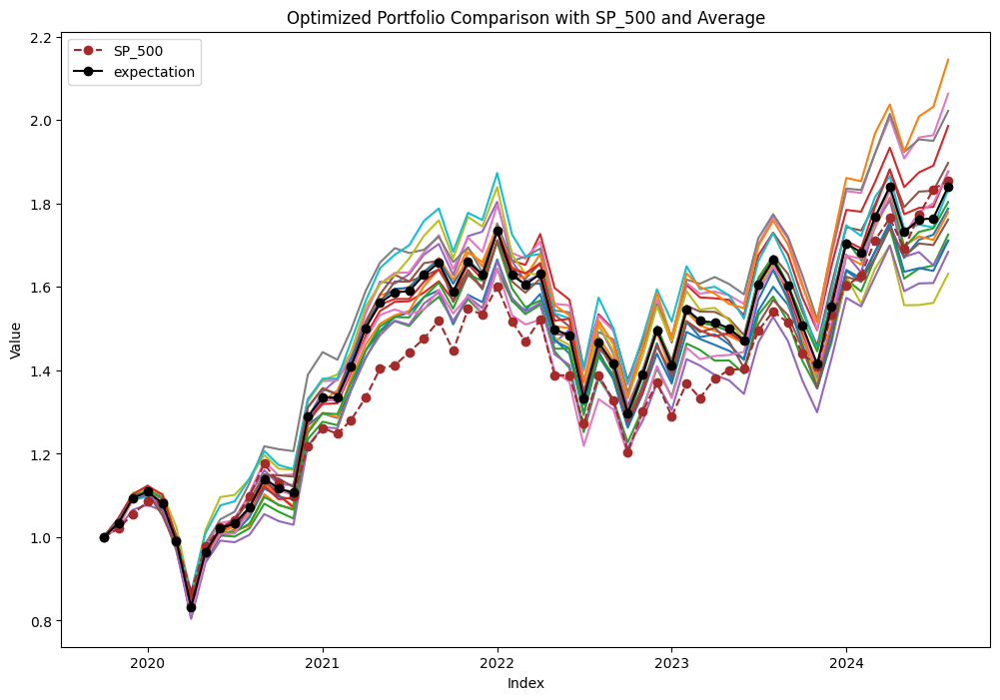

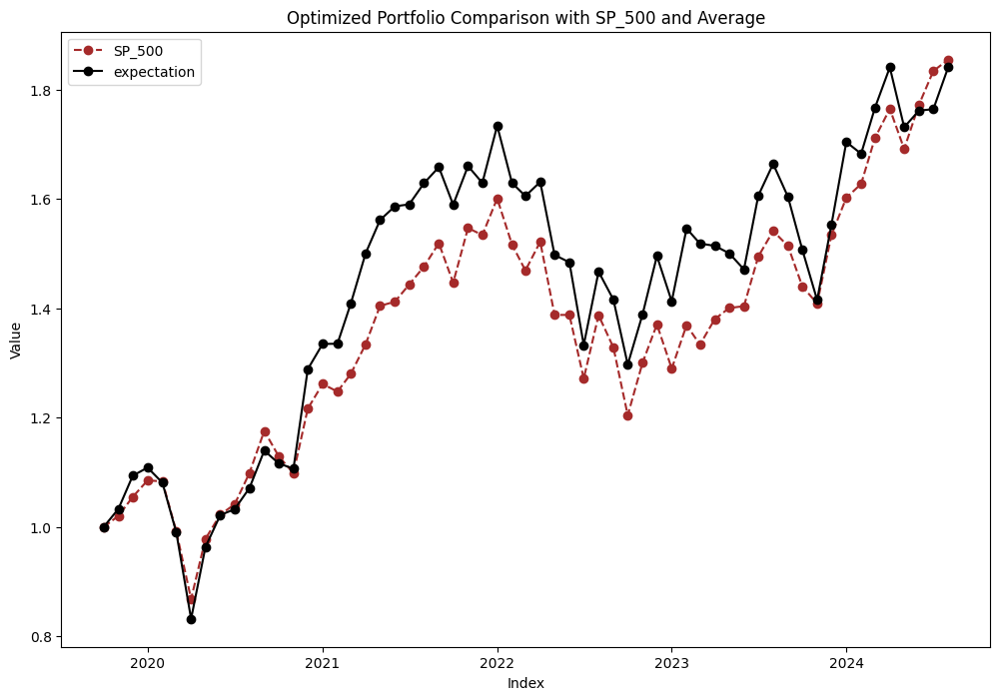

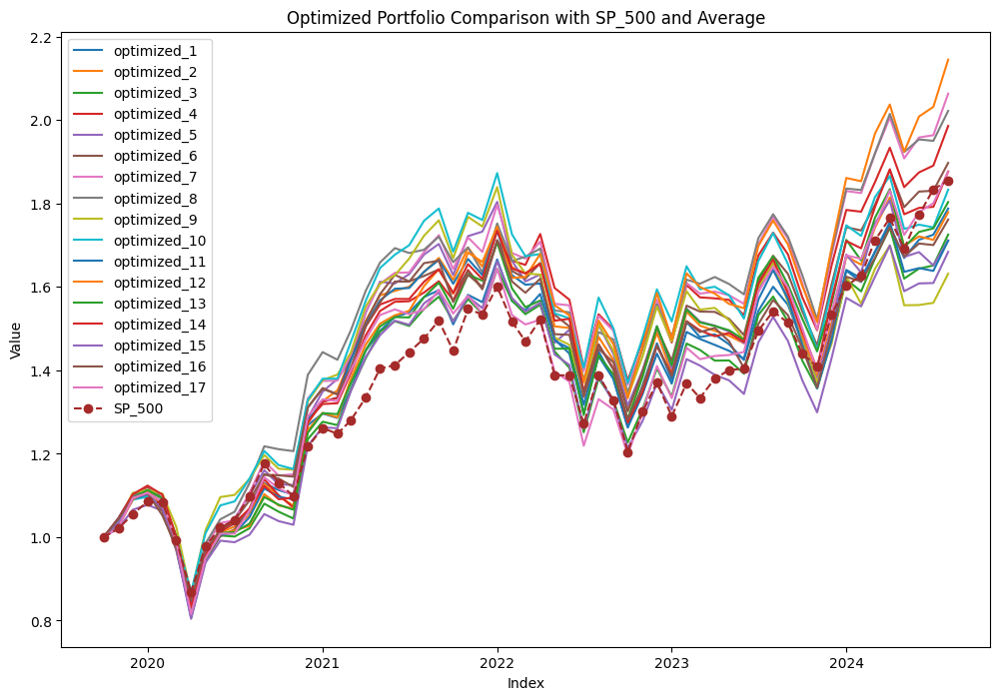

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.033179
2019-12-01,1.055174,1.093929
2020-01-01,1.085342,1.108804
2020-02-01,1.083575,1.081157
2020-03-01,0.992435,0.990425
2020-04-01,0.868262,0.832062
2020-05-01,0.978396,0.963447
2020-06-01,1.022699,1.021882


In [86]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [87]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1.1,0,0],9,0,0)
flist['1.100']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.575519
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022       2023        2024
Percentile                                                           
99 percentile   7.599903  58.363452  33.285735  60.248389  114.521354
Average        11.656212  58.969041  29.733341  50.750214   84.112502
1 percentile   16.408189  66.906941  33.710767  46.807098   63.194940
sp500          12.975940  44.706627  20.454596  44.051876   85.515021
      1 percentile return in %
Year                          
1                         4.21
2                        35.79
3                       -21.99
4                        10.10
5                        12.02


,1,2,3,4,5
99th Percentile,20.49,47.17,-12.81,24.66,32.97
Median,11.29,43.38,-18.87,15.99,21.86
1st Percentile,4.21,35.79,-21.99,10.10,12.02
SP500,12.98,28.09,-16.76,19.59,28.78


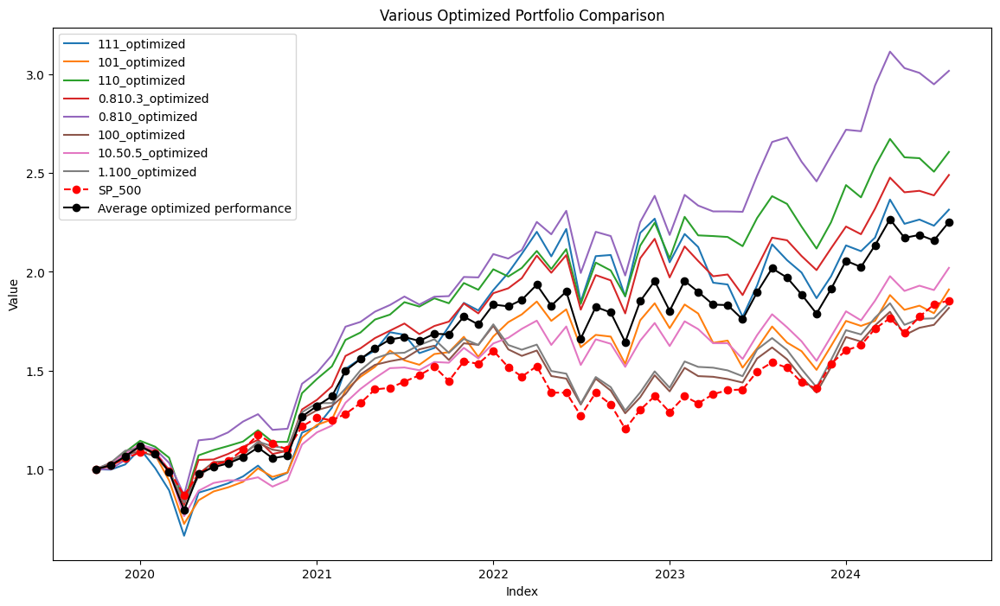

In [88]:
finale_visual(flist)

In [89]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,0.8,1.1,0)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'GEV', 'AMTM', 'SOLV', 'KVUE', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b87d6dc3c69a4777a0f51d5da1e5e3de-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b87d6dc3c69a4777a0f51d5da1e5e3de-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.05355
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1083
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'AMTM', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/da98c711d7ff496fa73700b6420e3382-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/da98c711d7ff496fa73700b6420e3382-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.07809
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1131
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8c27e959469e4402be065c59c6f939b6-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8c27e959469e4402be065c59c6f939b6-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.07257
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 980
Cbc0038I

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'AMTM', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a14f4f48be6f42a697075892f51077bd-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a14f4f48be6f42a697075892f51077bd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.04815
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1029
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[**********************79%%************          ]  395 of 501 completed/home/gooners/my_env/jo_env/lib/python3.12/site-packages/yfinance/base.py:273: Deprecati

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6bd4ea0c3c8b49629e886924567a915d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6bd4ea0c3c8b49629e886924567a915d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.04843
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1062
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'CEG', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e9a7c35d1511464c8ffa254479b51532-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e9a7c35d1511464c8ffa254479b51532-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.07921
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1079
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['KVUE', 'SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e63e96a12c3d472b8455a867517efb38-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e63e96a12c3d472b8455a867517efb38-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.08528
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1032
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  500 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/0d828d8eb44a41d689838005a6160e69-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/0d828d8eb44a41d689838005a6160e69-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.06742
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 984
Cbc0038I

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'GEV', 'CEG', 'VLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6e6b636b50c14e2796f44e4c83fac532-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6e6b636b50c14e2796f44e4c83fac532-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.05924
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1051
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*****                 10%%                      ]  48 of 501 completedIOStream.flush timed out
[*********************100%%**********************]  501 of 501 c

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3c0ca28bc4d647e4bd85a78b3177bf19-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3c0ca28bc4d647e4bd85a78b3177bf19-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.039
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1059
Cbc0038I 

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  500 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'KV

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ba09950434614819a82db7b497f7145b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ba09950434614819a82db7b497f7145b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.08674
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1062
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'AMTM', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/5eb06048c1cb460c9c1950e6059d50fd-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/5eb06048c1cb460c9c1950e6059d50fd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.05081
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1052
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[***                    6%%                      ]  32 of 501 completed/home/gooners/my_env/jo_env/lib/python3.12/site-packages/yfinance/base.py:273: Deprecatio

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2e6f2f59955a4ca9b87caa6c0b1666e9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2e6f2f59955a4ca9b87caa6c0b1666e9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.09184
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1066
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'GEV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/74c90a3dacda46f7843dcecd76aee4d5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/74c90a3dacda46f7843dcecd76aee4d5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.04364
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1026
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'AMTM', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/00089cf828c34c10bacd07f1b222d16b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/00089cf828c34c10bacd07f1b222d16b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.09042
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1132
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2766eb3d8fe3441ab7aca855c6e3d065-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2766eb3d8fe3441ab7aca855c6e3d065-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.04098
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1094
Cbc0038

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/49fcf306c8d740d0bea0210edca103b9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/49fcf306c8d740d0bea0210edca103b9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0565783 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 31 integers unsatisfied sum - 1.0454
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.34838 iterations 1016
Cbc0038I

[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  31 of 31 completed
[*********************100%%**********************]  1 of 1 completed


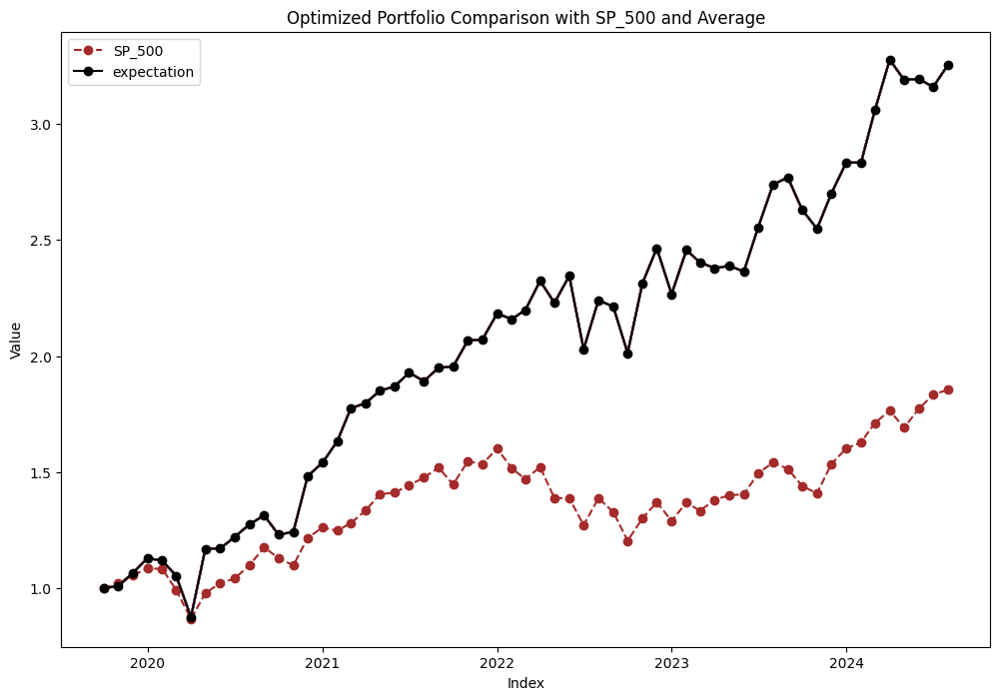

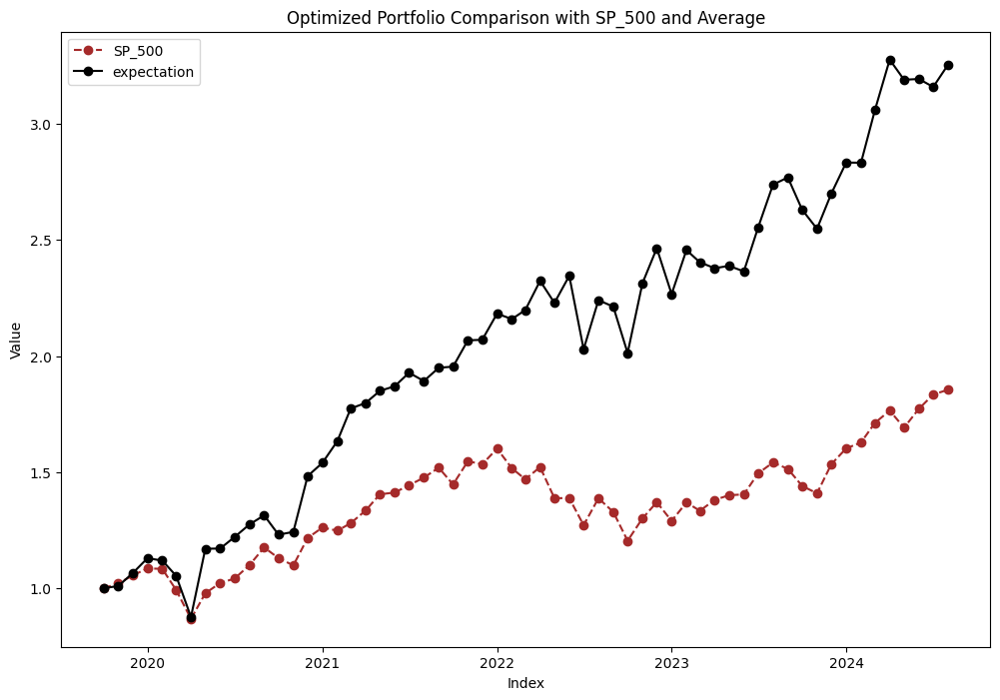

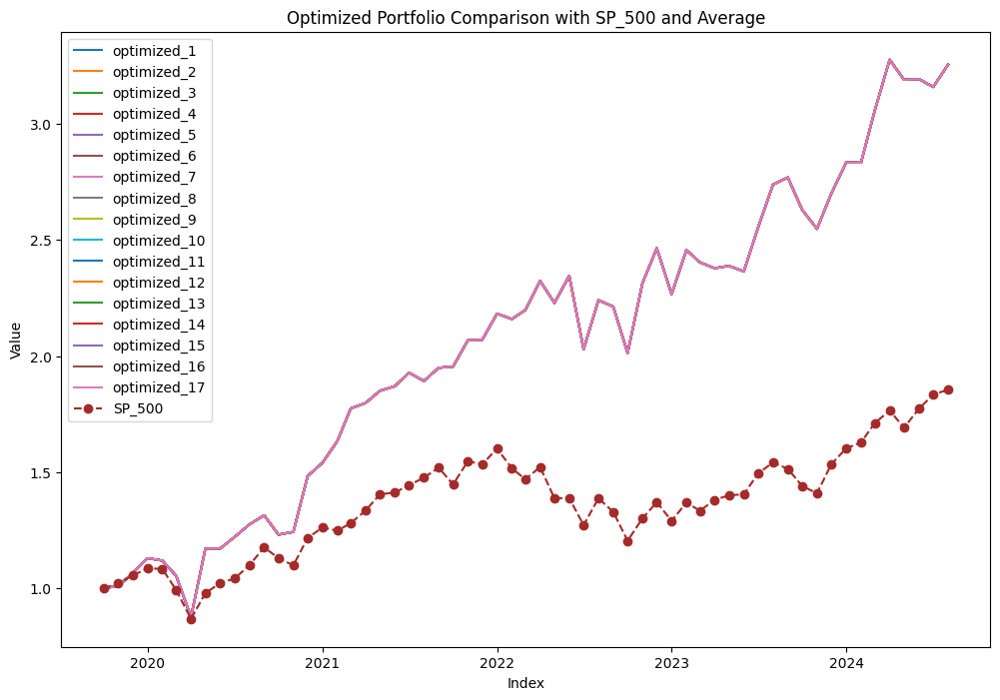

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.009560
2019-12-01,1.055174,1.064698
2020-01-01,1.085342,1.129378
2020-02-01,1.083575,1.119319
2020-03-01,0.992435,1.053530
2020-04-01,0.868262,0.876187
2020-05-01,0.978396,1.170166
2020-06-01,1.022699,1.171095


In [90]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [91]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[0.8,1.1,0],10,0,0)
flist['0.81.10']=avg_100
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.980264
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021        2022        2023        2024
Percentile                                                             
99 percentile  23.086383  95.448808  101.322041  163.018755  225.507372
Average        23.086383  95.448808  101.322041  163.018755  225.507372
1 percentile   23.086383  95.448808  101.322041  163.018755  225.507372
sp500          12.975940  44.706627   20.454596   44.051876   85.515021
      1 percentile return in %
Year                          
1                        23.09
2                        58.79
3                         3.00
4                        30.65
5                        23.76


,1,2,3,4,5
99th Percentile,23.09,58.79,3.00,30.65,23.76
Median,23.09,58.79,3.00,30.65,23.76
1st Percentile,23.09,58.79,3.00,30.65,23.76
SP500,12.98,28.09,-16.76,19.59,28.78


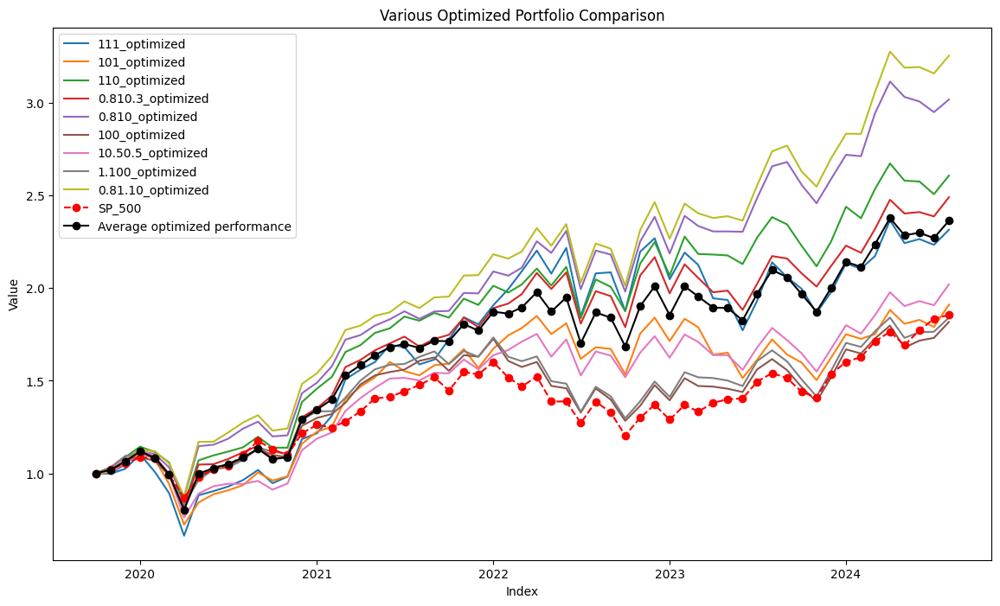

In [92]:
finale_visual(flist)

In [49]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,0,1)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CEG', 'KVUE', 'AMTM', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/436b886c3a1a4595ab5e0a3ee6e85f8a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/436b886c3a1a4595ab5e0a3ee6e85f8a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0371398 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 32 integers unsatisfied sum - 1.0015
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1035
Cbc0038I

[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/82e033e9a366442ab284206b20b045bb-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/82e033e9a366442ab284206b20b045bb-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1024
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/da3ee0f4bbb545139f5d5ebff93a5d94-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/da3ee0f4bbb545139f5d5ebff93a5d94-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1030
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'CEG', 'VLTO', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b55e47c8e1f140df8b3b748a675156d5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b55e47c8e1f140df8b3b748a675156d5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1022
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'AMTM', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/61598ba50f784b04b8bb30287d039f29-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/61598ba50f784b04b8bb30287d039f29-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00011
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1032
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/99f8973b9ba940d794c8ed2e3c2601c6-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/99f8973b9ba940d794c8ed2e3c2601c6-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1011
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'KV

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/0d65acd3f1ce4fb496de32d01b099a60-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/0d65acd3f1ce4fb496de32d01b099a60-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1195
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/539c8461c31d429393b5152a9ebcdcdc-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/539c8461c31d429393b5152a9ebcdcdc-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1050
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/dda5002c1d6145ff8b05825fa7d699b7-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/dda5002c1d6145ff8b05825fa7d699b7-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00006
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 997
Cbc0038I

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/9c65a9b199d34b0cb7c26c3ffdaab74f-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/9c65a9b199d34b0cb7c26c3ffdaab74f-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1085
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'AM

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a481e30e19094f05bb2745e9827b2c65-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a481e30e19094f05bb2745e9827b2c65-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00027
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1087
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d7bcf1f7c71c474ca5f0de0c1b3a217b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d7bcf1f7c71c474ca5f0de0c1b3a217b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1120
Cbc0038I Solu

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'GEV', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1e24c3b194bd45e88798c61dbb44c306-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1e24c3b194bd45e88798c61dbb44c306-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1033
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'AMTM', 'S

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/517c8cc35be84bb78068b45a5cbb6134-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/517c8cc35be84bb78068b45a5cbb6134-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1093
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'KVUE', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b606473fae554be2a808dc943e2fd120-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b606473fae554be2a808dc943e2fd120-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1027
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/5c9bdaed7bf9490eae0d07f8330cf15a-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/5c9bdaed7bf9490eae0d07f8330cf15a-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1045
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d13b66e1b16644cca0050f6aee1ba03d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d13b66e1b16644cca0050f6aee1ba03d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1021
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed


In [52]:
flist['101']=avg_100
flist

{'111':               SP_500  Optimized Portfolio
 Date                                     
 2019-10-01  1.000000             1.000000
 2019-11-01  1.020432             0.998068
 2019-12-01  1.055174             1.024318
 2020-01-01  1.085342             1.103158
 2020-02-01  1.083575             1.006284
 2020-03-01  0.992435             0.893356
 2020-04-01  0.868262             0.663355
 2020-05-01  0.978396             0.881620
 2020-06-01  1.022699             0.904421
 2020-07-01  1.041505             0.928775
 2020-08-01  1.098893             0.963811
 2020-09-01  1.175887             1.018463
 2020-10-01  1.129759             0.947036
 2020-11-01  1.098504             0.982423
 2020-12-01  1.216643             1.185277
 2021-01-01  1.261807             1.216619
 2021-02-01  1.247754             1.311830
 2021-03-01  1.280310             1.508463
 2021-04-01  1.334645             1.559514
 2021-05-01  1.404614             1.601014
 2021-06-01  1.412320             1.694240
 202

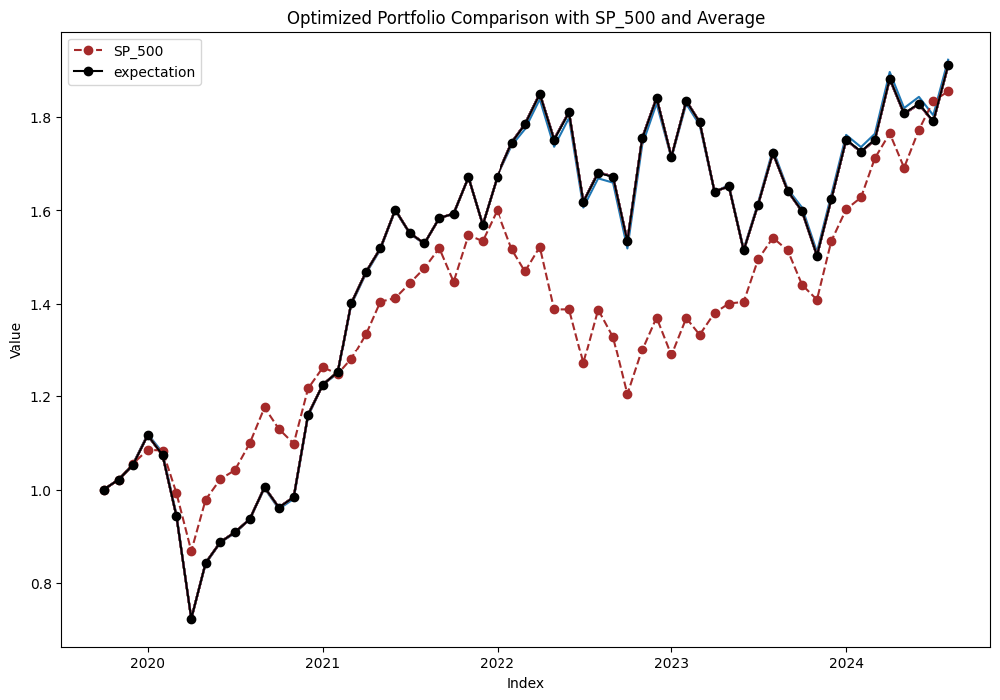

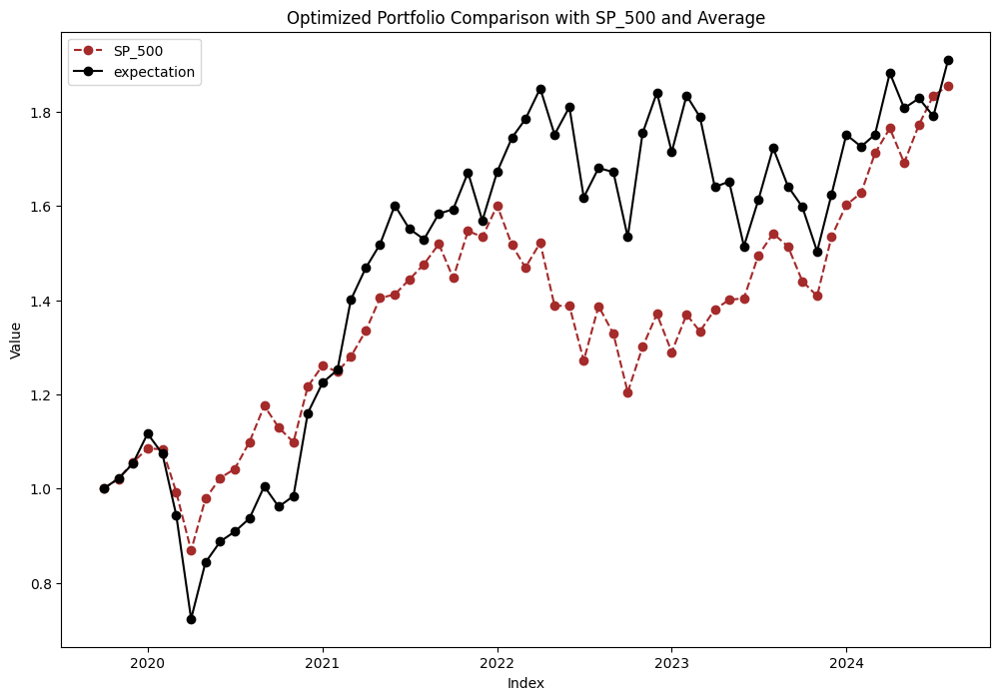

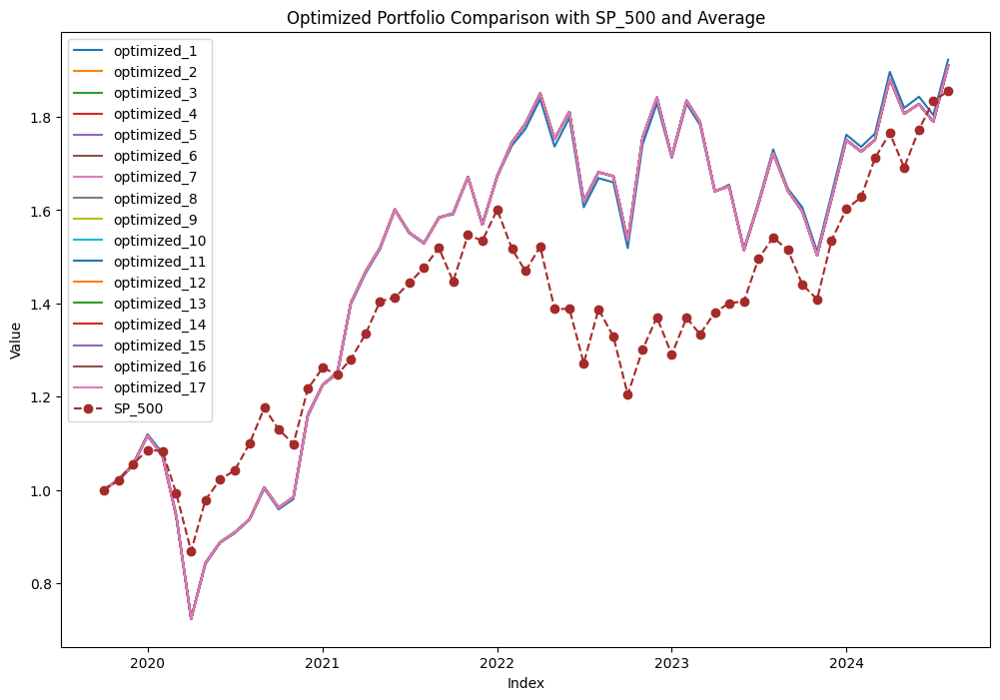

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.021271
2019-12-01,1.055174,1.052587
2020-01-01,1.085342,1.116698
2020-02-01,1.083575,1.073874
2020-03-01,0.992435,0.943291
2020-04-01,0.868262,0.723428
2020-05-01,0.978396,0.842978
2020-06-01,1.022699,0.887721


In [50]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [51]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,0,1],5,0,0)
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.570718
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022       2023       2024
Percentile                                                          
99 percentile  -4.168203  59.089843  51.860226  60.598460  92.288965
Average        -3.851550  59.315163  53.397633  59.816029  91.080913
1 percentile   -3.831759  59.329246  53.493721  59.767127  91.005409
sp500          12.975940  44.706627  20.454596  44.051876  85.515021
      1 percentile return in %
Year                          
1                        -4.11
2                        65.68
3                        -4.40
4                         4.09
5                        19.55


,1,2,3,4,5
99th Percentile,-3.83,65.96,-3.66,5.49,19.70
Median,-3.83,65.68,-3.66,4.09,19.55
1st Percentile,-4.11,65.68,-4.40,4.09,19.55
SP500,12.98,28.09,-16.76,19.59,28.78


In [42]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,1,1)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'SOLV', 'VLTO', 'GEV', 'CEG', 'KVUE', 'AMTM', 'CARR']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3f1b1d8bbbfb466caebd3762cea0ef23-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3f1b1d8bbbfb466caebd3762cea0ef23-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.18329 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 21 integers unsatisfied sum - 1.05135
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1114
Cbc0038I 

[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'SOLV', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4a97a08ffc4b40bb8f0b582cc976ef69-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4a97a08ffc4b40bb8f0b582cc976ef69-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.183397 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 21 integers unsatisfied sum - 1.05913
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1138
Cbc0038I

[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  21 of 21 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'CEG', 'SOLV', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6c9c7bf49289417fb78c6f90426a74ad-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6c9c7bf49289417fb78c6f90426a74ad-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.03768
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1005
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/cb3e99c03dff458a88a0af7ae62ce449-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/cb3e99c03dff458a88a0af7ae62ce449-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02043
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1076
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'KVUE', 'SO

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/5aed0377cbeb4bd5bd0f5ed1141fa8c1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/5aed0377cbeb4bd5bd0f5ed1141fa8c1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.03674
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1025
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'CEG', 'KVUE', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/3ba9bda3133e441fbf05a545b72337ec-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/3ba9bda3133e441fbf05a545b72337ec-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.03005
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1013
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'CEG', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8cc0d1fee9eb49fd9be997c499927503-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8cc0d1fee9eb49fd9be997c499927503-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02269
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1004
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/8c596e137a7d426292e423d39d40b39f-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/8c596e137a7d426292e423d39d40b39f-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02295
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1003
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'GEV', 'SOLV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/893d64e969764a06a4a7d720046922c9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/893d64e969764a06a4a7d720046922c9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02536
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1035
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'PLTR', 'ABNB', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a911eb08b3d74a00ab56c9cd7cf2980f-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a911eb08b3d74a00ab56c9cd7cf2980f-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.04948
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1092
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a08b19824d584191a7978208a98120a7-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a08b19824d584191a7978208a98120a7-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.01526
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1085
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'AMTM', 'C

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1c3bc384227a471fb2f78ce7975fdc3d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1c3bc384227a471fb2f78ce7975fdc3d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02815
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1029
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/1f37e0daaf3c44be807f5bbc4f92a9d0-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/1f37e0daaf3c44be807f5bbc4f92a9d0-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02188
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1009
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'GEV', 'CE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/30c30dc6577d4a8c809ebbb59ec1a140-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/30c30dc6577d4a8c809ebbb59ec1a140-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02528
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1036
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'SOLV', 'VLTO', 'AMTM', 'G

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ae9bb69d48a04f899030397494606aba-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ae9bb69d48a04f899030397494606aba-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 2 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02154
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1007
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'AMTM', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/34337477678343c88372f5caea26e9e0-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/34337477678343c88372f5caea26e9e0-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.0322
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1019
Cbc0038I 

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SW', 'OTIS', 'GEHC', 'ABNB', 'PLTR', 'VLTO', 'SOLV', 'CEG', 'GE

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2c3abff473314b489945ef3700da6e87-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2c3abff473314b489945ef3700da6e87-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.184096 - 0.02 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 22 integers unsatisfied sum - 1.02355
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.63216 iterations 1006
Cbc0038I

[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  22 of 22 completed
[*********************100%%**********************]  1 of 1 completed


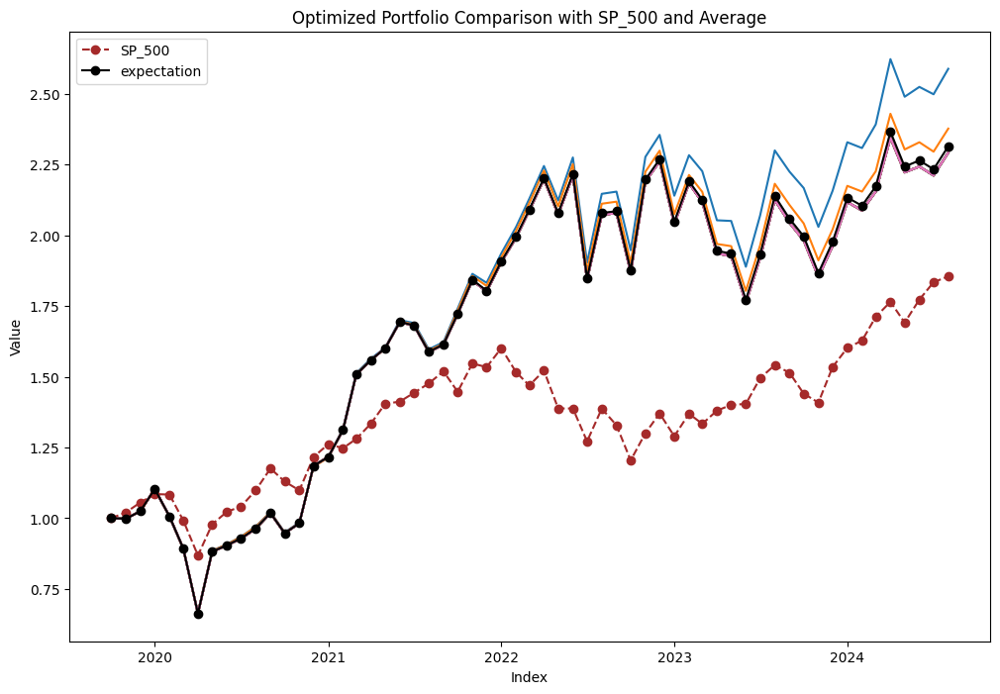

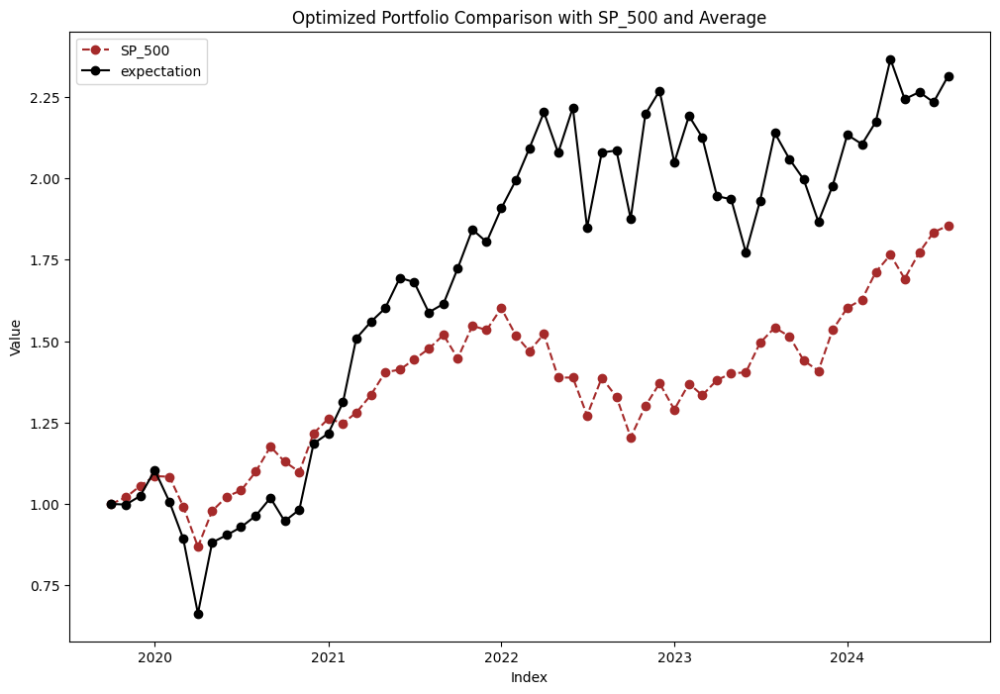

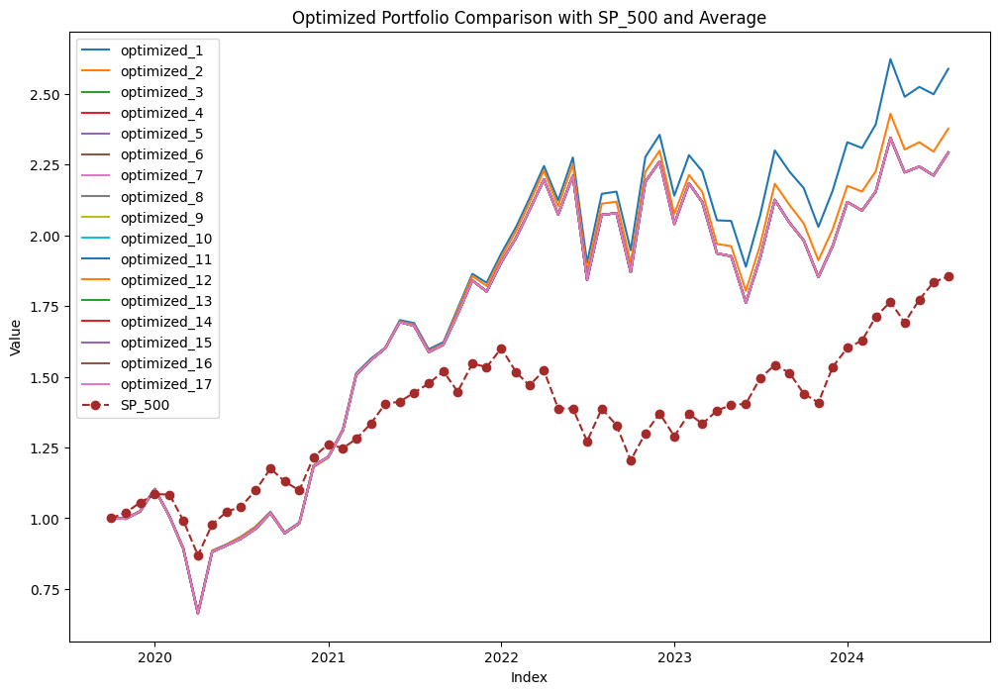

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,0.998068
2019-12-01,1.055174,1.024318
2020-01-01,1.085342,1.103158
2020-02-01,1.083575,1.006284
2020-03-01,0.992435,0.893356
2020-04-01,0.868262,0.663355
2020-05-01,0.978396,0.881620
2020-06-01,1.022699,0.904421


In [43]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [48]:
flist={}
flist['111']=avg_100
flist

{'111':               SP_500  Optimized Portfolio
 Date                                     
 2019-10-01  1.000000             1.000000
 2019-11-01  1.020432             0.998068
 2019-12-01  1.055174             1.024318
 2020-01-01  1.085342             1.103158
 2020-02-01  1.083575             1.006284
 2020-03-01  0.992435             0.893356
 2020-04-01  0.868262             0.663355
 2020-05-01  0.978396             0.881620
 2020-06-01  1.022699             0.904421
 2020-07-01  1.041505             0.928775
 2020-08-01  1.098893             0.963811
 2020-09-01  1.175887             1.018463
 2020-10-01  1.129759             0.947036
 2020-11-01  1.098504             0.982423
 2020-12-01  1.216643             1.185277
 2021-01-01  1.261807             1.216619
 2021-02-01  1.247754             1.311830
 2021-03-01  1.280310             1.508463
 2021-04-01  1.334645             1.559514
 2021-05-01  1.404614             1.601014
 2021-06-01  1.412320             1.694240
 202

In [46]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,'combination_data.xlsx','downside_protection',[1,1,1],6,0,0)
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.628823
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022        2023        2024
Percentile                                                            
99 percentile  -4.987845  74.150089  94.755084  116.751079  158.902081
Average        -5.296409  72.346389  87.613078   99.656964  131.510599
1 percentile   -5.328037  72.152545  86.959098   98.212174  129.268364
sp500          12.975940  44.706627  20.454596   44.051876   85.515021
      1 percentile return in %
Year                          
1                        -5.33
2                        81.84
3                         8.60
4                         6.02
5                        15.67


,1,2,3,4,5
99th Percentile,-5.01,83.22,11.49,10.66,18.96
Median,-5.33,81.84,8.60,6.02,15.67
1st Percentile,-5.33,81.84,8.60,6.02,15.67
SP500,12.98,28.09,-16.76,19.59,28.78


In [156]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,1,0)

avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,1,0],4,0,0)
yoy_exp_return
print(cumulative_exp_return)
print(sim_one_percentile)
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0,1],5,0,0)
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.57044
dtype: float64
The sharpe ratio of the sp500 : 0.66
Year                2020       2021       2022       2023       2024
Percentile                                                          
99 percentile  -3.831759  59.329246  53.493721  59.767127  91.005409
Average        -3.831759  59.329246  53.493721  59.767127  91.005409
1 percentile   -3.831759  59.329246  53.493721  59.767127  91.005409
sp500          12.975940  44.706627  20.454596  44.051876  85.515021
      1 percentile return in %
Year                          
1                        -3.83
2                        65.68
3                        -3.66
4                         4.09
5                        19.55


,1,2,3,4,5
99th Percentile,-3.83,65.68,-3.66,4.09,19.55
Median,-3.83,65.68,-3.66,4.09,19.55
1st Percentile,-3.83,65.68,-3.66,4.09,19.55
SP500,12.98,28.09,-16.76,19.59,28.78


In [154]:
cumulative_exp_return,yoy_exp_return=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.809799
dtype: float64
The sharpe ratio of the sp500 : 0.66


,1,2,3,4,5
99th Percentile,16.20,63.49,2.66,20.44,20.33
Median,13.97,61.54,1.69,18.56,17.94
1st Percentile,13.16,60.27,0.91,16.82,15.82
SP500,12.98,28.09,-16.76,19.59,28.78


In [155]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,0,1)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'KVUE', 'CEG', 'CARR', 'PLTR', 'GEV', 'VLTO']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a678841f12174ccfb4c2b95a00a3819f-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a678841f12174ccfb4c2b95a00a3819f-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0371385 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 32 integers unsatisfied sum - 1.00115
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1046
Cbc0038

[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a1b0b34954cf4a8095c7ab3de0d18830-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a1b0b34954cf4a8095c7ab3de0d18830-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0367764 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 32 integers unsatisfied sum - 1.00017
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1021
Cbc0038

[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  32 of 32 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4e99f09620264691a1ff1e6fc74a3894-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4e99f09620264691a1ff1e6fc74a3894-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00036
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1007
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e8d3ba78eee34c25b432d643ada9111c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e8d3ba78eee34c25b432d643ada9111c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1049
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/786a423e9d974e3d8380d86f39c5ea66-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/786a423e9d974e3d8380d86f39c5ea66-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00051
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1022
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['SOLV', 'AMTM', 'ABNB', 'GEHC', 'OTIS', 'SW', 'CEG', 'KVUE', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bdde00760f604231b34c262c1f1d08d5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bdde00760f604231b34c262c1f1d08d5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1036
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'CEG', 'KVUE', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/241ec2aa6024433ea542f33df19b82bd-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/241ec2aa6024433ea542f33df19b82bd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00005
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1106
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'KVUE', 'SW', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/5bbaf1d2e61b4dfcbf94f990b956e403-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/5bbaf1d2e61b4dfcbf94f990b956e403-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1135
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ba103dfc2e924a79b6f4e664540dc71c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ba103dfc2e924a79b6f4e664540dc71c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1047
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'CEG', 'KVUE', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/f563ae40f23248f887e2f8a5b9fc9153-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/f563ae40f23248f887e2f8a5b9fc9153-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1028
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'CEG', 'KVUE', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/79ec5ca5a9844f8a9f9402351b95f005-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/79ec5ca5a9844f8a9f9402351b95f005-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.04 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00017
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1064
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/a4dd15573af046a3ac939187eb0cc3de-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/a4dd15573af046a3ac939187eb0cc3de-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0003I 0 fixed, 0 tightened bounds, 1 strengthened rows, 0 substitutions
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1.00002
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1044
Cbc0038

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/9eff432ecb58477f9cf3678f5b203581-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/9eff432ecb58477f9cf3678f5b203581-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.02 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1019
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'CEG', 'KVUE', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/37e21f1426574fb5846cc19a47fdde87-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/37e21f1426574fb5846cc19a47fdde87-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1103
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'KVUE', 'SW', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/6819d02ca87d410f8aa672e0f856f1bc-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/6819d02ca87d410f8aa672e0f856f1bc-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1026
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'SW', 'OTIS', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/7627b4f6d0ad46e69c726c920af02722-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/7627b4f6d0ad46e69c726c920af02722-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1023
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'SOLV', 'ABNB', 'GEHC', 'OTIS', 'SW', 'KVUE', 'CEG', 'CA

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/2756d1f4dc4f4ed6a0d9c8115a3fce4d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/2756d1f4dc4f4ed6a0d9c8115a3fce4d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0.0368162 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 30 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.53798 iterations 1036
Cbc0038I Solution found of 1.53798
Cbc0038I Relaxing continuous gives 1.53798
Cbc0038I B

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  1 of 1 completed


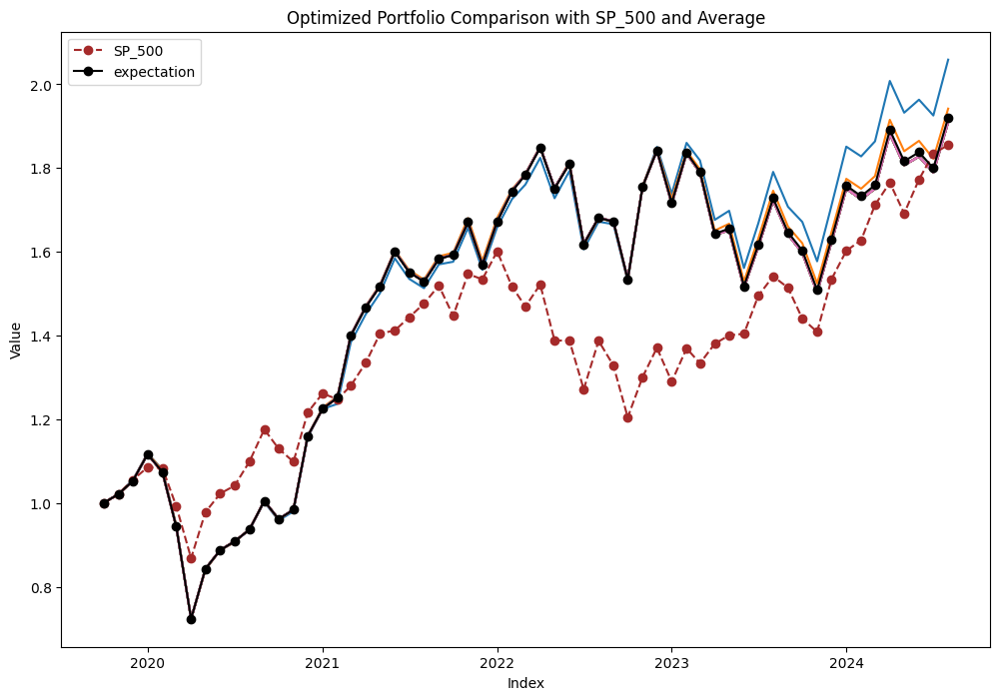

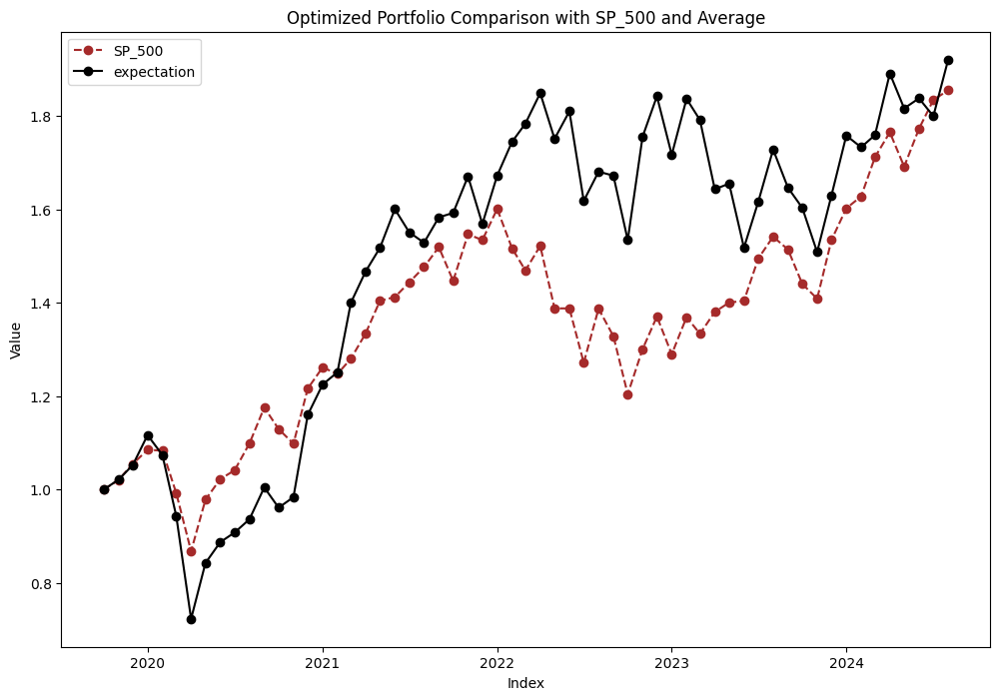

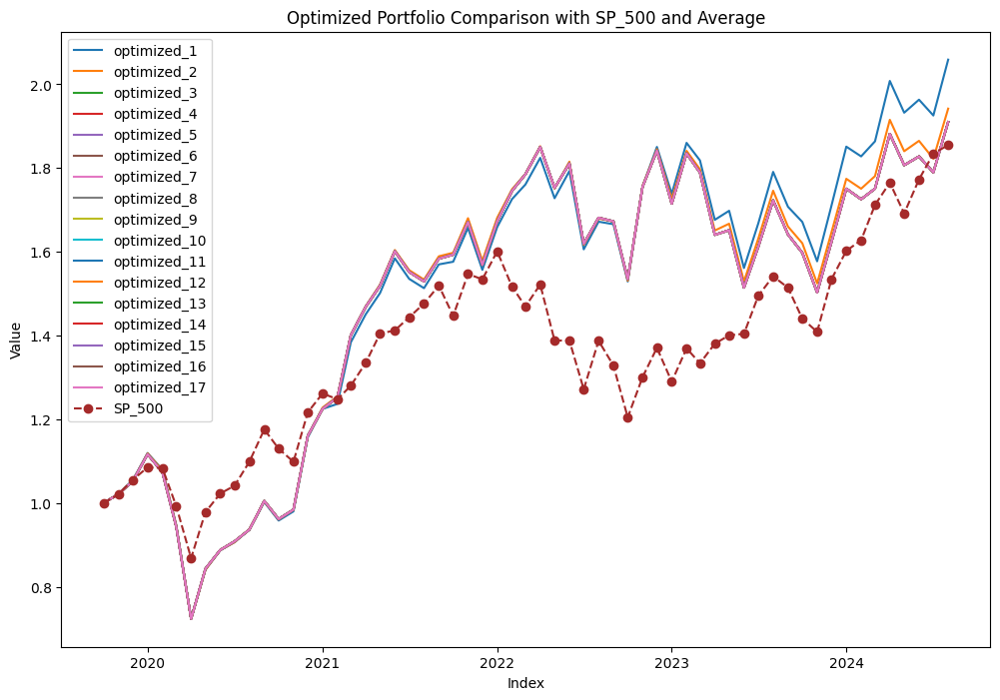

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.021251
2019-12-01,1.055174,1.052626
2020-01-01,1.085342,1.116837
2020-02-01,1.083575,1.074176
2020-03-01,0.992435,0.943523
2020-04-01,0.868262,0.723450
2020-05-01,0.978396,0.842822
2020-06-01,1.022699,0.887705


In [156]:
avg_100=final_visual()#100
final_visual2()
final_visual1()
avg_100

In [157]:
cumulative_exp_return,yoy_exp_return=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.574863
dtype: float64
The sharpe ratio of the sp500 : 0.66


,1,2,3,4,5
99th Percentile,-3.83,66.22,-3.10,8.76,22.65
Median,-3.83,65.68,-3.66,4.09,19.55
1st Percentile,-4.14,64.70,-4.10,4.09,19.55
SP500,12.98,28.09,-16.76,19.59,28.78


In [158]:
cumulative_exp_return

Year,2020,2021,2022,2023,2024
Percentile,,,,,
99 percentile,-4.182729,57.633498,52.906900,67.142634,105.902133
Average,-3.858486,59.255711,53.435838,60.335388,92.069759
1 percentile,-3.831759,59.329246,53.493721,59.767127,91.005409
sp500,12.975940,44.706627,20.454596,44.051876,85.515021


In [40]:
oos1_list,oos1_list_yearly,oos1_average=monte_carlo_simulation(17,1,0.5,0.5)

[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['CARR', 'ABNB', 'GEV', 'AMTM', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVUE', 'PLTR', 'VLTO', 'GEHC']: Exception("%ticker%: Data doesn't exist for startDate = 1472702400, endDate = 1567224000")
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2016-09-01 -> 2019-08-31)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  473 of 473 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d01a7e18dd264796956e5099cabfc34c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d01a7e18dd264796956e5099cabfc34c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 990
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'CARR', 'ABNB', 'GEV', 'SW', 'CEG', 'OTIS', 'KVUE', 'SOL

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/bdfef08c3070480498468b9e11df739d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/bdfef08c3070480498468b9e11df739d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1076
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'ABNB', 'CARR', 'GEV', 'SW', 'SOLV', 'CEG', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e4a5d5a47c184f5580ebd3cee1144954-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e4a5d5a47c184f5580ebd3cee1144954-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 963
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'CARR', 'ABNB', 'GEV', 'SW', 'CEG', 'SOLV', 'KVUE', 'OTI

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/94d482e50c5742078cd535406d01a078-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/94d482e50c5742078cd535406d01a078-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1031
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'GEV', 'ABNB', 'CARR', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d31b1aeef9974f6d92ea8dd1e5888eb9-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d31b1aeef9974f6d92ea8dd1e5888eb9-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 956
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['GEV', 'AMTM', 'ABNB', 'CARR', 'SW', 'SOLV', 'CEG', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/08d173a6f4154c0a8f87e41e5e8c4638-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/08d173a6f4154c0a8f87e41e5e8c4638-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 983
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['ABNB', 'AMTM', 'GEV', 'CARR', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/4e43aa304ded472eb4aaad69b5587761-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/4e43aa304ded472eb4aaad69b5587761-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 983
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be 

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d79d7ed084c64d7697091e9e0e179d50-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d79d7ed084c64d7697091e9e0e179d50-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 998
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'GEV', 'CARR', 'ABNB', 'SW', 'SOLV', 'CEG', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/69c1c89d971a45a991f395a3313dd53b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/69c1c89d971a45a991f395a3313dd53b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1042
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['GEV', 'ABNB', 'CARR', 'AMTM', 'SW', 'SOLV', 'CEG', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/51e10970a6ed43ee849b9705071ae2f1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/51e10970a6ed43ee849b9705071ae2f1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 1003
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini 

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['ABNB', 'GEV', 'CARR', 'AMTM', 'SW', 'SOLV', 'CEG', 'KVUE', 'OTI

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/593cc1f89fd646a7a998fc922ec3d97c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/593cc1f89fd646a7a998fc922ec3d97c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 996
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['GEV', 'ABNB', 'CARR', 'SW', 'CEG', 'SOLV', 'KVUE', 'OTIS', 'PLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/7069ac142fe84032a46b5adba8cdf88c-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/7069ac142fe84032a46b5adba8cdf88c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 982
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  37 of 37 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['AMTM', 'CARR', 'GEHC', 'ABNB', 'GEV', 'SW', 'CEG', 'SOLV', 'OTI

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ffb57a842f1b45609f34eccbe6030119-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ffb57a842f1b45609f34eccbe6030119-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 956
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['GEV', 'CARR', 'ABNB', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVUE', 'PLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/e75b1cb9dc6046cd838c0984f391c66d-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/e75b1cb9dc6046cd838c0984f391c66d-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 969
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['GEV', 'CARR', 'ABNB', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVUE', 'PLT

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/83b8b031d8cf41498f29553dce370b22-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/83b8b031d8cf41498f29553dce370b22-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 963
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['CARR', 'ABNB', 'GEV', 'AMTM', 'SW', 'SOLV', 'CEG', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/ccc7b350acc84222b4b0c8c5ebf6eade-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/ccc7b350acc84222b4b0c8c5ebf6eade-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.04 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 947
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  501 of 501 completed

14 Failed downloads:
['ABNB', 'CARR', 'GEV', 'AMTM', 'SW', 'CEG', 'SOLV', 'OTIS', 'KVU

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/gooners/my_env/jo_env/lib/python3.12/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/d8ab7f52f2f0485cb13d2cc01926c7cb-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/d8ab7f52f2f0485cb13d2cc01926c7cb-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2444 COLUMNS
At line 43228 RHS
At line 45668 BOUNDS
At line 46142 ENDATA
Problem MODEL has 2439 rows, 2400 columns and 39802 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.03 seconds
Cgl0004I processed model has 1020 rows, 1454 columns (473 integer (473 of which binary)) and 36964 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.3116 iterations 973
Cbc0038I Solution found of 1.3116
Cbc0038I Relaxing continuous gives 1.3116
Cbc0038I Before mini b

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


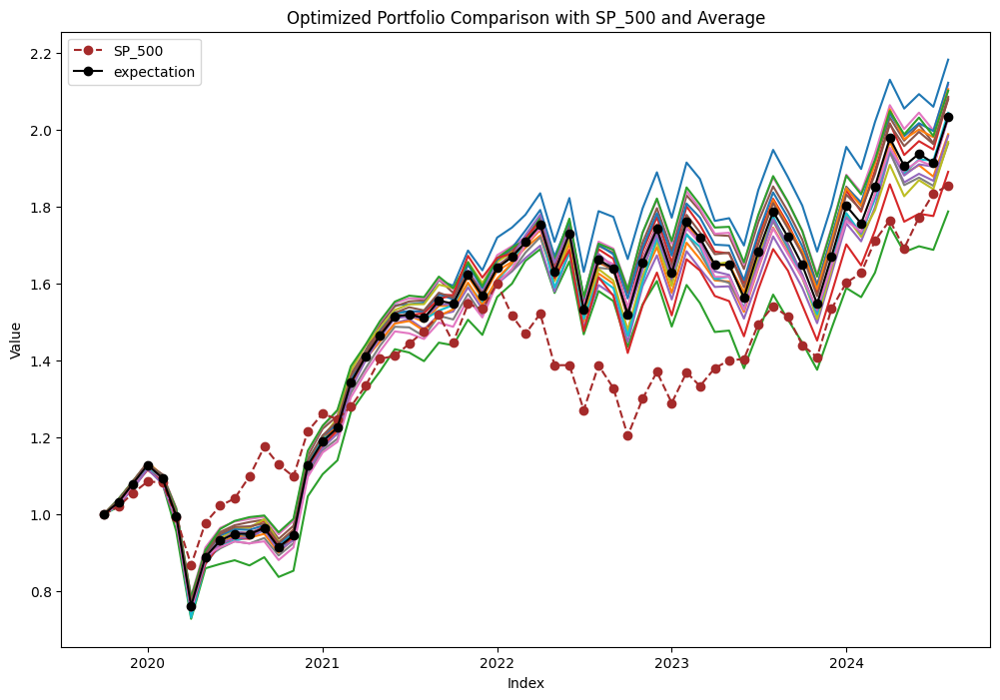

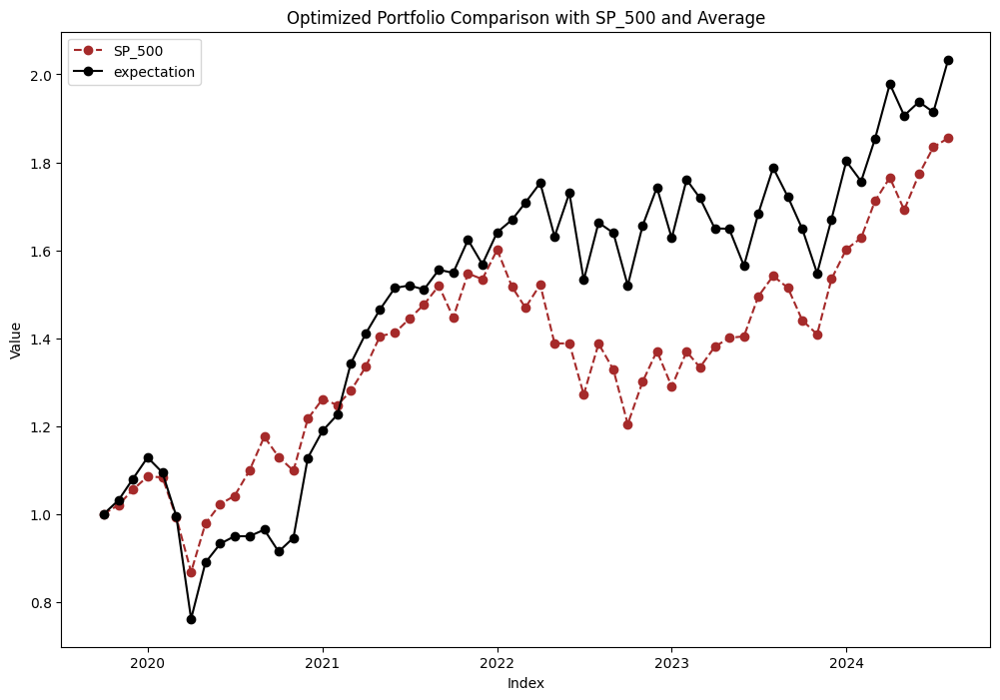

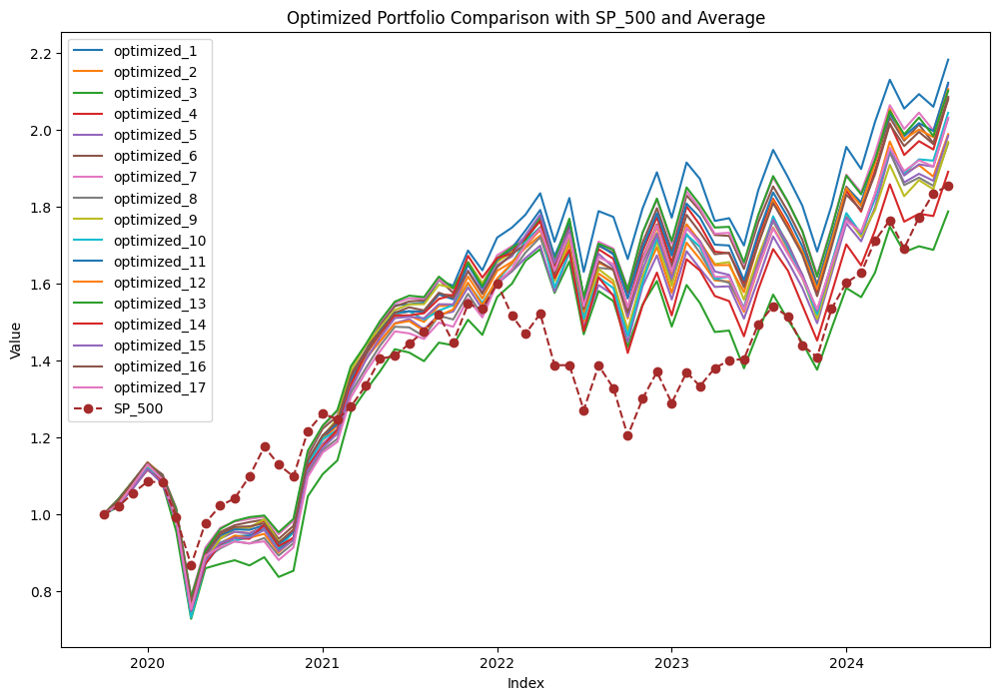

,SP_500,Optimized Portfolio
Date,,
2019-10-01,1.000000,1.000000
2019-11-01,1.020432,1.031082
2019-12-01,1.055174,1.079512
2020-01-01,1.085342,1.128802
2020-02-01,1.083575,1.094512
2020-03-01,0.992435,0.995289
2020-04-01,0.868262,0.761692
2020-05-01,0.978396,0.889680
2020-06-01,1.022699,0.932550


In [41]:
avg_100=final_visual()#1,0.5,0.5
final_visual2()
final_visual1()
avg_100

In [71]:
cumulative_exp_return,yoy_exp_return,sim_one_percentile=cumulative_returns_cal(oos1_list)
sharpe_simulation,sharpe_list_sim,sharpe_spy=list_sharpe_ratio(oos1_list)
print(f'The sharpe ratio of the portfolio on average:{sharpe_simulation}')
print(f'The sharpe ratio of the sp500 : {sharpe_spy}')
yoy_exp_return

The sharpe ratio of the portfolio on average:0    0.641821
dtype: float64
The sharpe ratio of the sp500 : 0.66


,1,2,3,4,5
99th Percentile,-4.73,74.83,4.19,11.38,26.30
Median,-7.80,69.07,-1.55,9.15,23.58
1st Percentile,-15.55,65.80,-9.17,1.46,20.99
SP500,12.98,28.09,-16.76,19.59,28.78


In [72]:
cumulative_exp_return

Year,2020,2021,2022,2023,2024
Percentile,,,,,
99 percentile,-9.074683,59.471823,66.403696,80.305545,118.260038
Average,-8.550298,54.857123,51.979065,64.840580,103.351261
1 percentile,-16.252974,43.984871,43.560872,44.673272,78.785326
sp500,12.975940,44.706627,20.454596,44.051876,85.515021


In [99]:
len(sim_one_percentile.T.columns)

5

In [34]:
from openpyxl import load_workbook

def save_df_with_combination_to_excel(df, filename, sheet_name, combination, start_row=0, start_col=0, gap=0):
    if not isinstance(combination, (list, tuple)):
        raise ValueError("Combination should be a list or tuple of values.")
    df_transposed = df.T
    df_transposed.columns = [f"Year {i+1}" for i in range(len(df_transposed.columns))]
    combined_row = list(combination) + df_transposed.iloc[0].tolist()
    combined_df = pd.DataFrame([combined_row], columns=[f"Beta {i+1}" for i in range(len(combination))] + df_transposed.columns.tolist())

    try:
        book = load_workbook(filename)
        if sheet_name in book.sheetnames:
            header = False  
        else:
            header = True
    except FileNotFoundError:
        header = True  

    with pd.ExcelWriter(filename, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
        combined_df.to_excel(
            writer,
            sheet_name=sheet_name,
            startrow=start_row,
            startcol=start_col,
            index=False,
            header=header
        )
        return start_row + len(combined_df) + gap, 


In [128]:
from openpyxl import Workbook
workbook_filename = 'combination_data.xlsx'
wb = Workbook()
wb.save(workbook_filename)


In [129]:
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0.75,0.5],0,0,0)

(1,)

In [130]:
save_df_with_combination_to_excel(sim_one_percentile,workbook_filename,'downside_protection',[1,0.5,0.5],2,0,0)

(3,)

In [35]:
def save_df_to_existing_excel(df, filename, sheet_name, start_row=0, start_col=0, gap=0):
    
    with pd.ExcelWriter(filename, engine='openpyxl', mode='a') as writer:
        if sheet_name not in writer.book.sheetnames:
            writer.book.create_sheet(sheet_name)
        df.to_excel(writer, sheet_name=sheet_name, startrow=start_row, startcol=start_col, index=False)
        
        return start_row + len(df) + gap


In [36]:
def cumulative_returns_cal(somelist):
    final_returns = {f"df {i + 1}": df.iloc[-1, 1] for i, df in enumerate(somelist)}
    final_return_values = list(final_returns.values())
    percentile_99_value = np.percentile(final_return_values, 99)
    percentile_1_value = np.percentile(final_return_values, 1)
    index_99 = min(range(len(final_return_values)), key=lambda i: abs(final_return_values[i] - percentile_99_value))
    index_1 = min(range(len(final_return_values)), key=lambda i: abs(final_return_values[i] - percentile_1_value))
    key_99 = list(final_returns.keys())[index_99]
    key_1 = list(final_returns.keys())[index_1]
    df_99 = somelist[int(key_99.split()[1]) - 1]  
    df_1 = somelist[int(key_1.split()[1]) - 1]
    yearly_returns_99 = calculate_yearly_returns_from_start(df_99)
    yearly_returns_1 = calculate_yearly_returns_from_start(df_1)
    yearly_returns_sp = calculate_yearly_returns_from_start2(df_1)
    yearly_returns_avg = calculate_yearly_returns_from_start(avg_100)
    yearly_returns_99 = {key: value * 100 for key, value in yearly_returns_99.items()}
    yearly_returns_1 = {key: value * 100 for key, value in yearly_returns_1.items()}
    yearly_returns_sp = {key: value * 100 for key, value in yearly_returns_sp.items()}
    yearly_returns_avg = {key: value * 100 for key, value in yearly_returns_avg.items()}
    data = {
        '99 percentile': pd.Series(yearly_returns_99),
        'Average': pd.Series(yearly_returns_avg),
        '1 percentile': pd.Series(yearly_returns_1),
        'sp500': pd.Series(yearly_returns_sp)
    }
    returns_df = pd.DataFrame(data)
    returns_df.index.name = 'Year'
    returns_df.columns.name = 'Percentile'
    returns_df = returns_df.T
    newyearly_data = new_get_all_yearly_returns(somelist)
    newpercentiles_data = new_calculate_percentiles(newyearly_data)
    sp500_newyearly_data = new_calculate_yearly_returns2(somelist[0])
    final_return_df = pd.DataFrame(newpercentiles_data)
    final_return_df.loc['SP500'] = pd.Series(sp500_newyearly_data)
    final_return_df = (final_return_df * 100).round(2)
    first_panknakercentile = {key: value['1st Percentile'] for key, value in newpercentiles_data.items()}
    one_percentile_df = pd.DataFrame(list(first_panknakercentile.items()), columns=['Year', '1 percentile return in %'])
    one_percentile_df.set_index('Year',inplace=True)
    one_percentile_df=(one_percentile_df * 100).round(2)

    
    return returns_df,final_return_df,one_percentile_df

In [145]:
cumulative_exp_return

Year,2020,2021,2022,2023,2024
Percentile,,,,,
99 percentile,16.468668,90.436891,92.674328,125.027713,171.592578
Average,14.246241,84.990054,88.173676,122.950294,162.575166
1 percentile,13.366071,84.232513,85.829895,117.754958,157.410671
sp500,12.975940,44.706627,20.454596,44.051876,85.515021


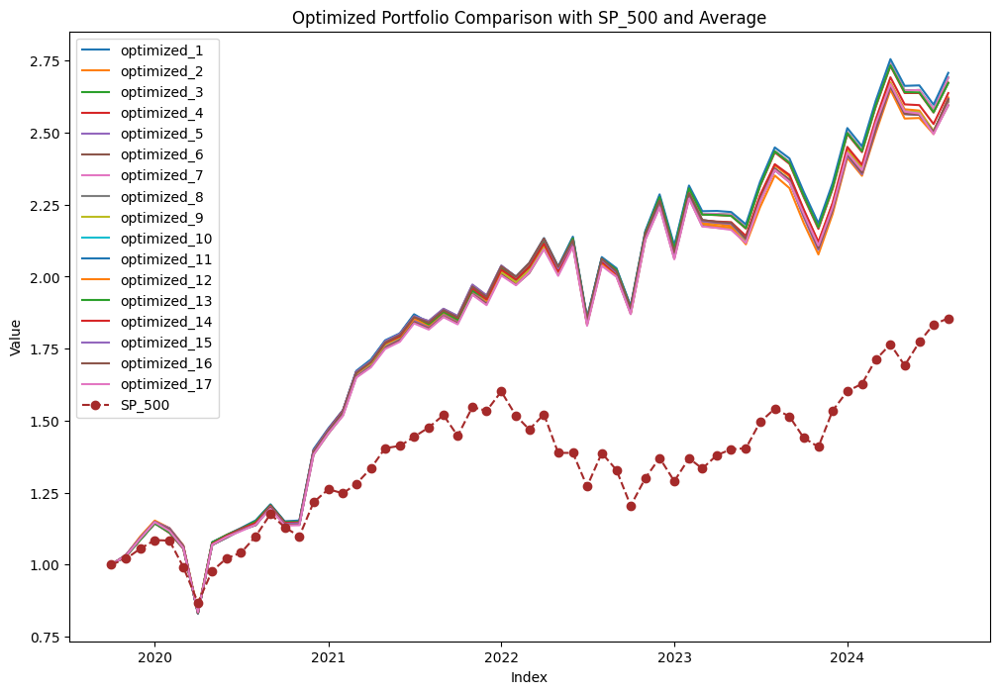

In [67]:
final_visual1() #110

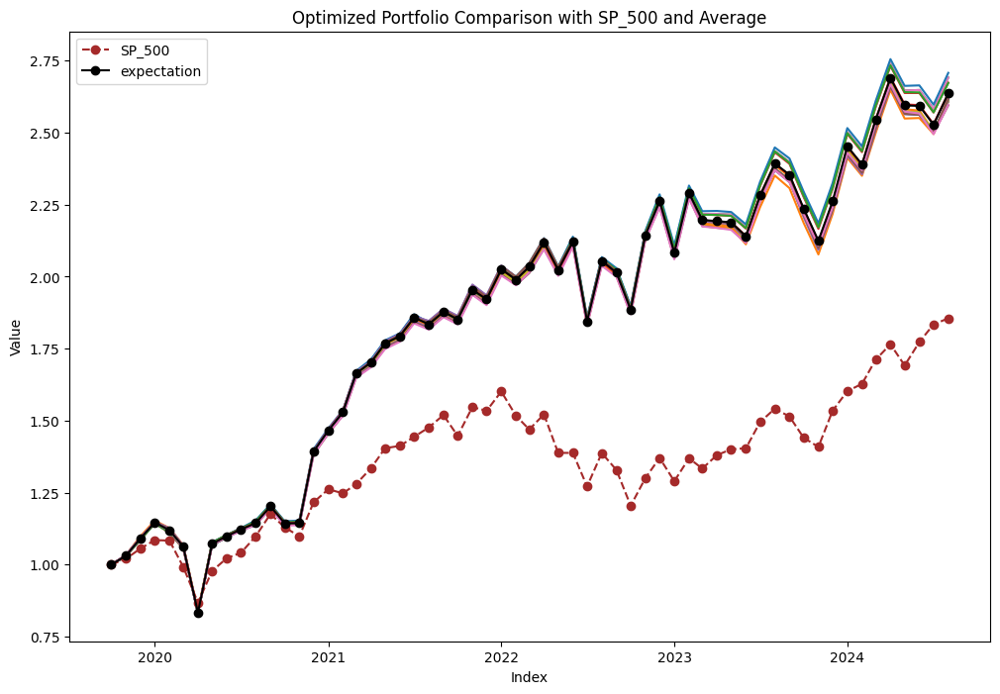

In [63]:
final_visual() #110

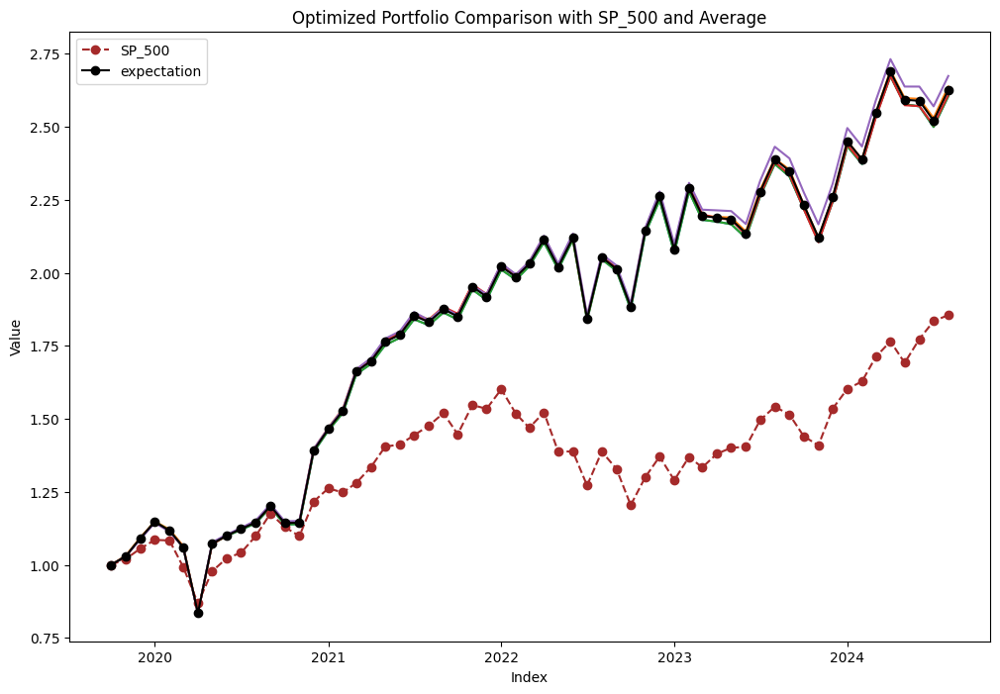

In [ ]:
final_visual() #110

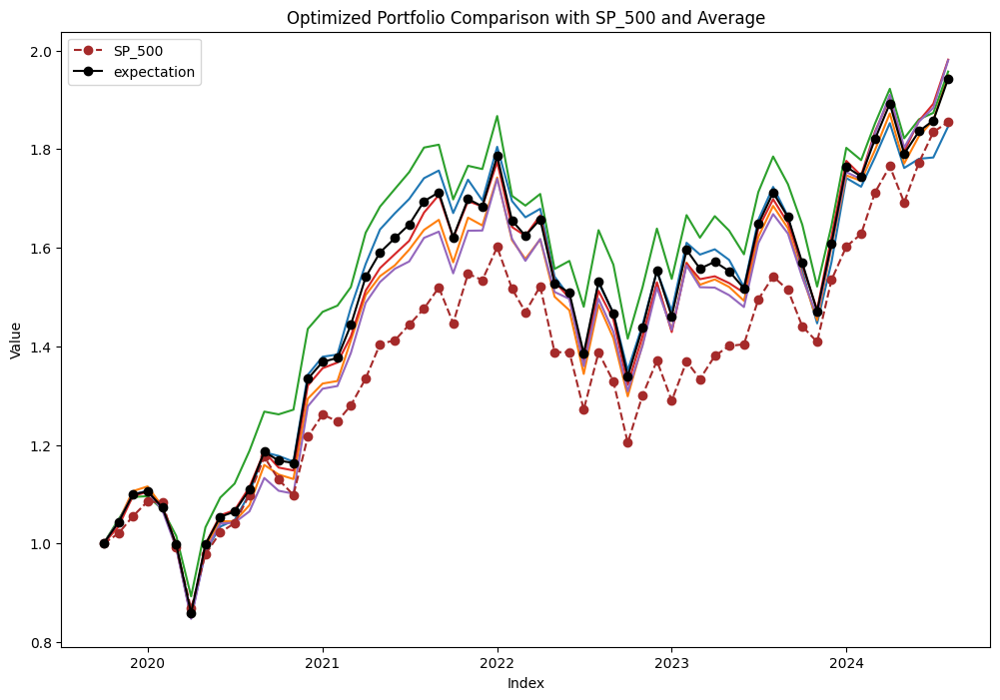

In [ ]:
final_visual() #010

In [37]:
def hedge_portfolio_beta(current_beta, target_beta, hedge_ratio, contrat_size, size_of_position, factor_weight, index_futures_price, hedge_period, index_multiple):
    factor_weight=round(0.99/hedge_ratio,1)
    if target_beta > current_beta:
        # If target beta is greater, take a long position
        number_of_contracts = (target_beta - current_beta) * (hedge_ratio * (factor_weight * size_of_position) / contrat_size)
        hedge_profit = number_of_contracts * (index_futures_price['Adj Close'].iloc[index_futures_price.index.get_loc(o1_start_d) + hedge_period + 1] - index_futures_price['Adj Close'].iloc[index_futures_price.index.get_loc(o1_start_d) + 1])
        opt_portf_profit = B * (oos1_new_performance.loc[str(index_futures_price.index[index_futures_price.index.get_loc(o1_start_d)+ hedge_period + 1]),'Optimized Portfolio'] - oos1_new_performance.loc[str(index_futures_price.index[index_futures_price.index.get_loc(o1_start_d)+1]),'Optimized Portfolio'])
        total_profit = opt_portf_profit + hedge_profit
        action = "LONG"
    elif target_beta < current_beta:
        # If target beta is smaller, take a short position
        number_of_contracts = (current_beta - target_beta) * (hedge_ratio * (factor_weight * size_of_position) / contrat_size)
        hedge_profit = number_of_contracts * (index_futures_price['Adj Close'].iloc[index_futures_price.index.get_loc(o1_start_d) + 1] - index_futures_price['Adj Close'].iloc[index_futures_price.index.get_loc(o1_start_d) + hedge_period + 1]) * index_multiple
    
        opt_portf_profit = B * (oos1_new_performance.loc[str(index_futures_price.index[index_futures_price.index.get_loc(o1_start_d)+ hedge_period + 1]),'Optimized Portfolio'] - oos1_new_performance.loc[str(index_futures_price.index[index_futures_price.index.get_loc(o1_start_d)+1]),'Optimized Portfolio'])
    
        total_profit = opt_portf_profit + hedge_profit
    
        action = "SHORT"
    else:

        # If target beta is equal to current beta, no action needed
        action = "no action"

        number_of_contracts = 0

        total_profit = 0

    return action, number_of_contracts, hedge_profit, opt_portf_profit, total_profit, hedge_period


In [411]:
# # MARKET FACTOR - SP_500 FUTURES MINIMUM VARIANCE HEDGE RATIO
sp500_futures = yf.download("ES=F",start=start,end=o1_end_d,interval='1mo')['Adj Close'].pct_change().dropna()
# Fama French Monthly Data using getFamaFrenchFactors module
ff3_monthly = gff.famaFrench3Factor(frequency='m')
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
ff3_monthly = ff3_monthly.loc[sp500_futures[:o1_start_d].index]
# Regression Analysis on Market Factor Vs SP 500 Futures Data 
y = ff3_monthly['Mkt-RF']
X = sp500_futures[:o1_start_d].values.reshape(-1,1)

mkt_model = LinearRegression()
mkt_model.fit(X, y)
market_hedge_ratio = mkt_model.coef_[0]
print('Minimum variance Hedge ratio for Mkt-RF Factor: {:,.2f}'.format(market_hedge_ratio))

# Futures Contract Price for Contract Multiplier
sp500_index_futures_price = yf.download("ES=F",interval='1mo')
sp500_index_futures_price.index = pd.to_datetime(sp500_index_futures_price.index)
sp500_index_futures_price = sp500_index_futures_price.tz_localize(None)
index_multiple = 50
sp500_index_futures_price
new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-08-01')],'Open':[4396.50],'High':[4419.75],'Low':[4377.25],'Close':[4379.75],'Adj Close':[4379.75],'Volume':[1193301]})
new_row.set_index('Date',inplace=True)
new_row
sp500_index_futures_price=pd.concat([sp500_index_futures_price,new_row]).sort_index()
sp500_index_futures_price

#  B is the size of the position
size_of_market_futures_contract = index_multiple * sp500_index_futures_price['Adj Close'].iloc[sp500_index_futures_price.index.get_loc(o1_start_d) + 1]


# mkt_opt is the current beta of Market Factor
mkt_target_beta = 1.1
# Hedging the Portfolio Using Index Futures
action, number_of_contracts, hedge_profit, opt_portf_profit, total_profit, hedge_period = hedge_portfolio_beta(mkt_opt,mkt_target_beta,market_hedge_ratio, size_of_market_futures_contract, B, 1, sp500_index_futures_price, 4, index_multiple)

print("To change beta from {} to {}, {} {:.0f} contracts over the next {} months and gain/loss from {} futures position is ${:,.2f}\nGain/Loss from optimal portfolio is ${:,.2f}\nTotal Gain/Loss from all of our positions is ${:,.2f}.".format(mkt_opt, mkt_target_beta, action, number_of_contracts, hedge_period, action, hedge_profit, opt_portf_profit, total_profit))


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Minimum variance Hedge ratio for Mkt-RF Factor: 0.96
To change beta from 1 to 1.1, LONG 1 contracts over the next 4 months and gain/loss from LONG futures position is $-84.14
Gain/Loss from optimal portfolio is $-229,018.81
Total Gain/Loss from all of our positions is $-229,102.95.


In [410]:
# # size FACTOR - russell 2000 FUTURES MINIMUM VARIANCE HEDGE RATIO
russell_futures = yf.download("RTY=F",start=start,end=o1_end_d,interval='1mo')['Adj Close'].pct_change().dropna()
# Fama French Monthly Data using getFamaFrenchFactors module
ff3_monthly = gff.famaFrench3Factor(frequency='m')
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
ff3_monthly = ff3_monthly.loc[russell_futures[:o1_start_d].index]
# Regression Analysis on size Factor Vs SP 500 Futures Data 
y = ff3_monthly['SMB']
X = russell_futures[:o1_start_d].values.reshape(-1,1)

smb_model = LinearRegression()
smb_model.fit(X, y)
smb_hedge_ratio = smb_model.coef_[0]
print('Minimum variance Hedge ratio for SMB Factor: {:,.2f}'.format(smb_hedge_ratio))

# Futures Contract Price for Contract Multiplier
smb_index_futures_price = yf.download("RTY=F",interval='1mo')
smb_index_futures_price.index = pd.to_datetime(smb_index_futures_price.index)
smb_index_futures_price = smb_index_futures_price.tz_localize(None)
index_multiple = 50
new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-08-01')],'Open':[2226.50],'High':[2257],'Low':[2207.5],'Close':[2210.9],'Adj Close':[2210.9],'Volume':[175613]})
new_row.set_index('Date',inplace=True)
new_row
smb_index_futures_price=pd.concat([smb_index_futures_price,new_row]).sort_index()
# new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-05-01')],'Open':[2,288.80	],'High':[2291.8],'Low':[2254.2],'Close':[2261.5],'Adj Close':[2261.5],'Volume':[204892]})
# new_row.set_index('Date',inplace=True)
# new_row
# smb_index_futures_price=pd.concat([smb_index_futures_price,new_row]).sort_index()
# smb_index_futures_price

#  B is the size of the position
size_of_smb_futures_contract = index_multiple * smb_index_futures_price['Adj Close'].iloc[smb_index_futures_price.index.get_loc(o1_start_d) + 1]


# mkt_opt is the current beta of size Factor
smb_target_beta = 0.1
# Hedging the Portfolio Using Index Futures
action, number_of_contracts, hedge_profit, opt_portf_profit, total_profit, hedge_period = hedge_portfolio_beta(smb_opt,smb_target_beta,smb_hedge_ratio, size_of_smb_futures_contract, B, 1, smb_index_futures_price, 4, index_multiple)

print("To change beta from {} to {}, {} {:.0f} contracts over the next {} months and gain/loss from {} futures position is ${:,.2f}\nGain/Loss from optimal portfolio is ${:,.2f}\nTotal Gain/Loss from all of our positions is ${:,.2f}.".format(smb_opt, smb_target_beta, action, number_of_contracts, hedge_period, action, hedge_profit, opt_portf_profit, total_profit))


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Minimum variance Hedge ratio for SMB Factor: 0.30
To change beta from 0 to 0.1, LONG 1 contracts over the next 4 months and gain/loss from LONG futures position is $-325.97
Gain/Loss from optimal portfolio is $-229,018.81
Total Gain/Loss from all of our positions is $-229,344.79.


In [409]:
# # value FACTOR - russell 1000 value FUTURES MINIMUM VARIANCE HEDGE RATIO
value_futures = yf.download("RTY=F",start=start,end=o1_end_d,interval='1mo')['Adj Close'].pct_change().dropna()
# Fama French Monthly Data using getFamaFrenchFactors module
ff3_monthly = gff.famaFrench3Factor(frequency='m')
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
ff3_monthly = ff3_monthly.loc[value_futures[:o1_start_d].index]
# Regression Analysis on Market Factor Vs SP 500 Futures Data 
y = ff3_monthly['HML']
X = value_futures[:o1_start_d].values.reshape(-1,1)

val_model = LinearRegression()
val_model.fit(X, y)
hml_hedge_ratio = val_model.coef_[0]
print('Minimum variance Hedge ratio for HML Factor: {:,.2f}'.format(hml_hedge_ratio))

# Futures Contract Price for Contract Multiplier
hml_index_futures_price = yf.download("RTY=F",interval='1mo')
hml_index_futures_price.index = pd.to_datetime(hml_index_futures_price.index)
hml_index_futures_price = hml_index_futures_price.tz_localize(None)
index_multiple = 50
# new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-08-01')],'Open':[2226.50],'High':[2257],'Low':[2207.5],'Close':[2210.9],'Adj Close':[2210.9],'Volume':[175613]})
# new_row.set_index('Date',inplace=True)
# new_row
# hml_index_futures_price=pd.concat([hml_index_futures_price,new_row]).sort_index()
# new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-05-01')],'Open':[2,288.80	],'High':[2291.8],'Low':[2254.2],'Close':[2261.5],'Adj Close':[2261.5],'Volume':[204892]})
# new_row.set_index('Date',inplace=True)
# new_row
# smb_index_futures_price=pd.concat([smb_index_futures_price,new_row]).sort_index()
# smb_index_futures_price

#  B is the size of the position
size_of_value_futures_contract = index_multiple * hml_index_futures_price['Adj Close'].iloc[hml_index_futures_price.index.get_loc(o1_start_d) + 1]


# mkt_opt is the current beta of Market Factor
hml_target_beta = 0.2
# Hedging the Portfolio Using Index Futures
action, number_of_contracts, hedge_profit, opt_portf_profit, total_profit, hedge_period = hedge_portfolio_beta(hml_opt,hml_target_beta,hml_hedge_ratio, size_of_value_futures_contract, B, 1, hml_index_futures_price, 4, index_multiple)

print("To change beta from {} to {}, {} {:.0f} contracts over the next {} months and gain/loss from {} futures position is ${:,.2f}\nGain/Loss from optimal portfolio is ${:,.2f}\nTotal Gain/Loss from all of our positions is ${:,.2f}.".format(hml_opt, hml_target_beta, action, number_of_contracts, hedge_period, action, hedge_profit, opt_portf_profit, total_profit))


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Minimum variance Hedge ratio for HML Factor: 0.01
To change beta from 0 to 0.2, LONG 3 contracts over the next 4 months and gain/loss from LONG futures position is $-649.92
Gain/Loss from optimal portfolio is $-229,018.81
Total Gain/Loss from all of our positions is $-229,668.73.


In [412]:
# # value FACTOR - russell 1000 value FUTURES MINIMUM VARIANCE HEDGE RATIO
value_futures = yf.download("RSV=F",start=start,end=o1_end_d,interval='1mo')['Adj Close'].pct_change().dropna()
# Fama French Monthly Data using getFamaFrenchFactors module
ff3_monthly = gff.famaFrench3Factor(frequency='m')
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
ff3_monthly = ff3_monthly.loc[value_futures[:o1_start_d].index]
# Regression Analysis on Market Factor Vs SP 500 Futures Data 
y = ff3_monthly['HML']
X = value_futures[:o1_start_d].values.reshape(-1,1)

val_model = LinearRegression()
val_model.fit(X, y)
hml_hedge_ratio = val_model.coef_[0]
print('Minimum variance Hedge ratio for HML Factor: {:,.2f}'.format(hml_hedge_ratio))

# Futures Contract Price for Contract Multiplier
hml_index_futures_price = yf.download("RSV=F",interval='1mo')
hml_index_futures_price.index = pd.to_datetime(hml_index_futures_price.index)
hml_index_futures_price = hml_index_futures_price.tz_localize(None)
index_multiple = 50
new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-08-01')],'Open':[2226.50],'High':[2257],'Low':[2207.5],'Close':[2210.9],'Adj Close':[2210.9],'Volume':[175613]})
new_row.set_index('Date',inplace=True)
new_row
hml_index_futures_price=pd.concat([hml_index_futures_price,new_row]).sort_index()
# new_row = pd.DataFrame({'Date':[pd.to_datetime('2021-05-01')],'Open':[2,288.80	],'High':[2291.8],'Low':[2254.2],'Close':[2261.5],'Adj Close':[2261.5],'Volume':[204892]})
# new_row.set_index('Date',inplace=True)
# new_row
# smb_index_futures_price=pd.concat([smb_index_futures_price,new_row]).sort_index()
# smb_index_futures_price

#  B is the size of the position
size_of_value_futures_contract = index_multiple * hml_index_futures_price['Adj Close'].iloc[hml_index_futures_price.index.get_loc(o1_start_d) + 1]


# mkt_opt is the current beta of Market Factor
hml_target_beta = 0.2
# Hedging the Portfolio Using Index Futures
action, number_of_contracts, hedge_profit, opt_portf_profit, total_profit, hedge_period = hedge_portfolio_beta(hml_opt,hml_target_beta,hml_hedge_ratio, size_of_value_futures_contract, B, 1, hml_index_futures_price, 4, index_multiple)

print("To change beta from {} to {}, {} {:.0f} contracts over the next {} months and gain/loss from {} futures position is ${:,.2f}\nGain/Loss from optimal portfolio is ${:,.2f}\nTotal Gain/Loss from all of our positions is ${:,.2f}.".format(hml_opt, hml_target_beta, action, number_of_contracts, hedge_period, action, hedge_profit, opt_portf_profit, total_profit))


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Minimum variance Hedge ratio for HML Factor: 0.15
To change beta from 0 to 0.2, LONG 3 contracts over the next 4 months and gain/loss from LONG futures position is $-598.06
Gain/Loss from optimal portfolio is $-229,018.81
Total Gain/Loss from all of our positions is $-229,616.87.


In [463]:
port_betas

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.975651,1,0.998867,0.0011
SMB,-0.112017,0,-0.003061,0.0031
HML,-0.030148,0,-0.005243,0.0052


In [29]:
new_date_calculation()

NameError: name 'os_years' is not defined

In [38]:
def variable_current_date():
    global today
    global os_start
    global os_end
    global n_year_before
    global n_year_after
    os_years


    

In [48]:
simulator(1.1,0,0.25,'2020-03-01','2023-01-01',1000000,50) 
port_betas
out_of_sample()

[*********************100%%**********************]  501 of 501 completed

8 Failed downloads:
['SW', 'GEV', 'VLTO', 'KVUE', 'SOLV']: Exception("%ticker%: Data doesn't exist for startDate = 1583038800, endDate = 1672549200")
['GEHC']: IndexError('index 0 is out of bounds for axis 0 with size 0')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2020-03-01 -> 2023-01-01)')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  489 of 489 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/d7f78e8060f346a0883f7aa4dfd4f58b-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/d7f78e8060f346a0883f7aa4dfd4f58b-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2520 COLUMNS
At line 42712 RHS
At line 45228 BOUNDS
At line 45718 ENDATA
Problem MODEL has 2515 rows, 2478 columns and 39180 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.06 seconds
Cgl0004I processed model has 1048 rows, 1500 columns (489 integer (489 of which binary)) and 36246 elements
Cbc0038I Initial state - 34 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 1.04029 ite

[*********************100%%**********************]  34 of 34 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2023-07-01,1.000000,1.000000
2023-08-01,1.031139,1.060492
2023-09-01,1.012871,1.042470
2023-10-01,0.963524,0.995064
2023-11-01,0.942346,0.946859
2023-12-01,1.026384,1.051127
2024-01-01,1.071780,1.115057
2024-02-01,1.088817,1.098178
2024-03-01,1.145131,1.116141


In [39]:
def visual():
      plt.style.use('ggplot')
      fig = plt.figure(figsize=(12,8), dpi=100)
      axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])   # left, bottom, width, height (range 0 to 1)
      for i in range(0,len(oos1_daily_data.columns[-2:])):
        axes.plot(oos1_new_performance.index, oos1_new_performance.iloc[:,i], linewidth=1)
      axes.set_xlabel('Date')
      axes.set_ylabel('Performance')
      axes.set_title('Out of Sample 1 - Daily Performance of $1 USD of Portfolios')
      axes.legend(oos1_daily_data.columns[-2:], bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0, fontsize='small')
      plt.savefig('oos1_daily_performance.png') 
      plt.show()


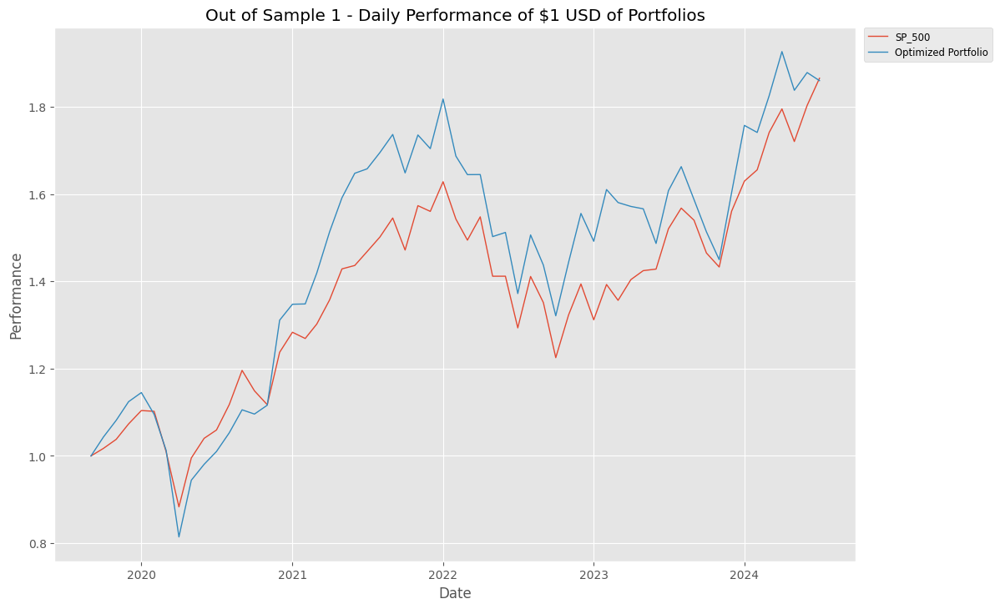

In [413]:
visual()

In [40]:
def random_generate_beta(l,u):
    upper_limit=u
    lower_limit=l
    random_number=round(random.uniform(lower_limit, upper_limit), 2)
    return random_number

In [40]:
testing_beta_mkt=random_generate_beta(1,1.2)
testing_beta_val=random_generate_beta(0,0)
testing_beta_smb=random_generate_beta(0,0)
print(testing_beta_mkt, testing_beta_val,testing_beta_smb)
def run_with_backtestss(nyears):
    
    global n_years
    n_years=nyears
    current_date()
    simulator(testing_beta_mkt,testing_beta_val,testing_beta_smb,n_year_before,n_year_after,1000000,50) 
    out_of_sample()
  
    return oos1_new_performance

run_with_backtestss(3)


1.02 0.0 0.0


[*********************100%%**********************]  501 of 501 completed

6 Failed downloads:
['GEV', 'SOLV', 'SW', 'VLTO']: Exception("%ticker%: Data doesn't exist for startDate = 1593576000, endDate = 1688184000")
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2020-07-01 -> 2023-07-01)')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  490 of 490 completed


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/645f92fe1ba44eabb5b5b0aad85fc6e5-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /var/folders/l4/hkz5jfdx3t581gbl8x7mfqs40000gn/T/645f92fe1ba44eabb5b5b0aad85fc6e5-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 2529 COLUMNS
At line 44769 RHS
At line 47294 BOUNDS
At line 47785 ENDATA
Problem MODEL has 2524 rows, 2485 columns and 41224 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 0 - 0.06 seconds
Cgl0004I processed model has 1054 rows, 1505 columns (490 integer (490 of which binary)) and 38284 elements
Cbc0038I Initial state - 36 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    0.00000 (0) obj. 2.17193 ite

[*********************100%%**********************]  36 of 36 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2023-08-01,1.000000,1.000000
2023-09-01,0.982284,0.982084
2023-10-01,0.934427,0.935691
2023-11-01,0.913889,0.906989
2023-12-01,0.995389,0.991257
2024-01-01,1.039414,1.042958
2024-02-01,1.055936,1.045114
2024-03-01,1.110550,1.046608
2024-04-01,1.144998,1.074531


In [109]:
sharess.to_excel('shares2.xlsx')

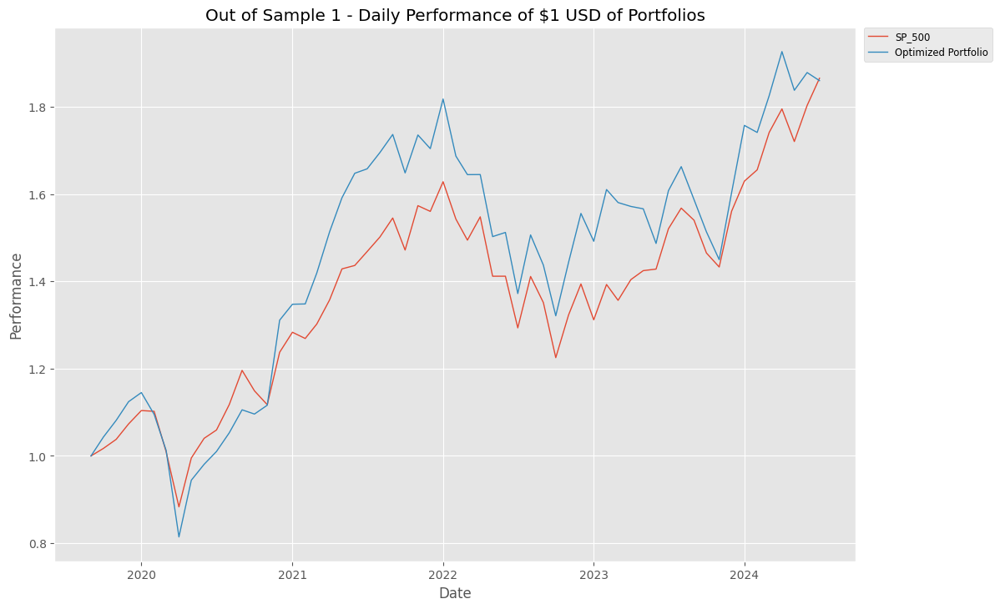

,Mkt-RF,SMB,HML,RF
Mkt-RF,1.000000,0.375112,0.087302,-0.132453
SMB,0.375112,1.000000,0.166171,-0.208541
HML,0.087302,0.166171,1.000000,-0.304060
RF,-0.132453,-0.208541,-0.304060,1.000000


In [414]:
visual()
ff3_monthly.corr()

In [20]:
sharess.to_excel('shares1.xlsx')

In [41]:
#future price function

def get_last_future_price(symbol):
    future = yf.Ticker(symbol)
    data = future.history(period="1d")
    last_price = data['Close'].iloc[-1]
    return last_price


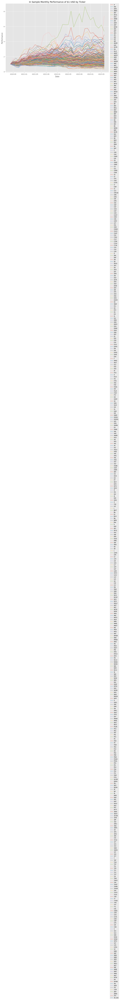

In [82]:
#Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
tickers = list(monthly_data.columns[:-1])
tick_index = tickers + ['SP_500']
init = 1        #Initial Common Value (Can be thought of Initial Investment of $1 USD in each stock)
global performance
performance = pd.DataFrame(np.ones((len(monthly_data),len(monthly_data.columns))), index = monthly_data.index, columns = monthly_data.columns)
for j in range(1,len(monthly_data.index)):
    performance.iloc[j] = performance.iloc[j-1]*(monthly_data.iloc[j-1][monthly_data.columns]+init)
plt.style.use('ggplot')
fig = plt.figure(figsize=(12,8), dpi=100)
axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])   # left, bottom, width, height (range 0 to 1)

# Plot on that set of axes
for i in range(0,len(monthly_data.columns)):
        axes.plot(performance.index, performance.iloc[:,i], linewidth=1)

#axes.set_prop_cycle(cycler)
axes.set_xlabel('Date')
axes.set_ylabel('Performance')
axes.set_title('In Sample Monthly Performance of $1 USD by Ticker')
axes.legend(tick_index, bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0, fontsize='small')

plt.show()